All requirements:
Implement your own facial recognition system.

Take code from practice as a basis and train a feature extractor on the LFW dataset.

During training, every N epochs (choose N yourself), run an assessment of the quality of the extractor and show in the logs the best found threshold and its F1 measure.

Implement the face alignment function (face cut + rotate + resize).

Test the pipeline (detection + alignment + feature extraction) on real images.

Also show recognition results on video (read each frame using cv2.VideoCapture and draw these frames into the output video via cv2.VideoWriter. Draw face boxes on the frames, the name of the face and the confidence of the face match).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# LFW dataset

##Loading

In [ ]:
# https://www.kaggle.com/discussions/general/74235
! mkdir ~/.kaggle
! cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d jessicali9530/lfw-dataset

 84% 94.0M/112M [00:00<00:00, 176MB/s]
100% 112M/112M [00:00<00:00, 169MB/s] 


In [ ]:
# !unzip '/content/lfw-dataset.zip' -d '/content/lfw-dataset'

In [ ]:
# # в этом датасете лица уже выровнены
# !kaggle datasets download -d jessicali9530/lfw-dataset

In [ ]:
!unzip -n -q /content/lfw-dataset.zip

##Reading

In [ ]:
dataset_root = '/content/lfw-deepfunneled/lfw-deepfunneled'

(250, 250)


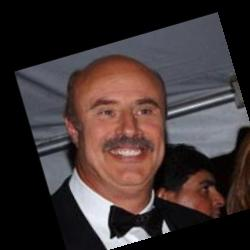

In [ ]:
import os
from PIL import Image

# test_img_path = f'{dataset_root}/Abel_Pacheco/Abel_Pacheco_0001.jpg'
test_img_path = f'{dataset_root}/Phil_McGraw/Phil_McGraw_0001.jpg'
# test_img_path = f'{dataset_root}/John_Bolton/John_Bolton_0016.jpg'

pil_img = Image.open(test_img_path)
print(pil_img.size)
pil_img

# Face detection

## Yolov8n-face (with keypoints)

https://github.com/derronqi/yolov8-face

In [ ]:
!gdown 1qcr9DbgsX3ryrz2uU8w4Xm3cOrRywXqb

Downloading...
From: https://drive.google.com/uc?id=1qcr9DbgsX3ryrz2uU8w4Xm3cOrRywXqb
To: /content/yolov8n-face.pt
100% 6.39M/6.39M [00:00<00:00, 77.6MB/s]


In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.2/661.2 kB 4.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import torch

device, fp16 = ('cuda', True) if torch.cuda.is_available() else ('cpu', False)

detector_model = YOLO('yolov8n-face.pt')
detector_model.to(device)
res = detector_model.predict(source=test_img_path,
                              show=False,
                              save=False,
                              conf=0.4,
                              save_txt=False,
                              save_crop=False,
                              verbose=False,
                              device=device,
                              half=fp16,
                              )[0]

WARNING ⚠️ NMS time limit 0.550s exceeded


In [ ]:
faces = []
for ind in range(len(res.boxes)):
    box_points = res.boxes.xyxy[ind].cpu().numpy().astype(int)
    keypoints = res.keypoints[ind].data.cpu().numpy()[0][:, :2].astype(int)
    faces.append(
        {
            "conf": res.boxes.conf[ind].cpu().item(),
            "box_points": box_points.tolist(),
            "key_points": keypoints.tolist(),
        }
    )
faces

[{'conf': 0.833984375,
  'box_points': [77, 62, 165, 185],
  'key_points': [[105, 112], [146, 110], [130, 134], [108, 149], [145, 148]]},
 {'conf': 0.73583984375,
  'box_points': [177, 169, 225, 220],
  'key_points': [[205, 189], [213, 187], [223, 196], [215, 209], [220, 208]]}]

#Face Alignment

### Drawing the box and key points
find_most_central_face

In [ ]:
import cv2

def draw_detection_results(image, face_info):
    conf = face_info['conf']
    box_points = face_info['box_points']
    key_points = face_info['key_points']

    x0, y0, x1, y1 = tuple(box_points)
    color = (0, 0, 255)
    text = f'{conf:.2f}'
    font = cv2.FONT_HERSHEY_SIMPLEX
    text_size, _ = cv2.getTextSize(text, font, 0.5, 2)
    text_x = int((x1 + x0 - text_size[0]) // 2)
    text_y = int(y0 - text_size[1])
    cv2.rectangle(image, (int(x0), int(y0)), (int(x1), int(y1)), color, 2)
    cv2.putText(image, text, (text_x, text_y), font, 0.5, color, 2)

    key_points_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (0, 255, 255), (128, 0, 128)]
    radius = 3
    for point, cur_color in zip(key_points, key_points_colors):
        cv2.circle(image, (int(point[0]), int(point[1])), radius, cur_color, -1)

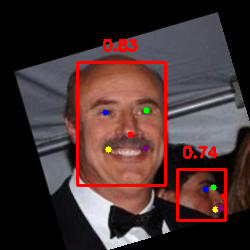

In [ ]:
from google.colab.patches import cv2_imshow

img = cv2.imread(test_img_path)

for face_info in faces:
    draw_detection_results(img, face_info)
cv2_imshow(img)

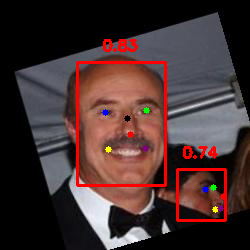

In [ ]:
def get_central_of_face(face_info):
    left_eye, right_eye, nose = face_info['key_points'][:3]
    center_x = (left_eye[0] + right_eye[0] + nose[0]) // 3
    center_y = (left_eye[1] + right_eye[1] + nose[1]) // 3
    face_center_point = center_x, center_y
    return face_center_point

def find_most_central_face(img, faces):
    image_height, image_width, C = img.shape

    min_distance = float('inf')
    most_central_face = None

    for face_info in faces:
        center_x, center_y = get_central_of_face(face_info)
        distance = ((center_x - image_width/2)**2 + (center_y - image_height/2)**2)**0.5

        if distance < min_distance:
            min_distance = distance
            most_central_face = face_info

    return most_central_face

face_info = find_most_central_face(img, faces)
center_x, center_y = face_center_point = get_central_of_face(face_info)

cv2.circle(img, (int(center_x), int(center_y)), 3, (0, 0, 0), -1)

cv2_imshow(img)

### Face cutting

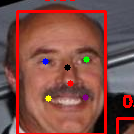

In [ ]:
import numpy as np

def crop_with_padding(image, new_bbox):
    return np.array(Image.fromarray(image).crop(new_bbox))

box_points = face_info['box_points']

max_sz = max(
        abs(box_points[0] - center_x),
        abs(box_points[1] - center_y),
        abs(box_points[2] - center_x),
        abs(box_points[3] - center_y),
    )

new_bbox = (face_center_point[0] - max_sz, face_center_point[1] - max_sz,
            face_center_point[0] + max_sz, face_center_point[1] + max_sz)
croped_img = crop_with_padding(img, new_bbox)

cv2_imshow(croped_img)

### preprocess_image (cutting+resizing of faces)
Implement the face alignment function (face cut + rotate + resize).

In [ ]:
!gdown 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'

Downloading...
From: http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
To: /content/shape_predictor_68_face_landmarks.dat.bz2
100% 64.0M/64.0M [00:00<00:00, 80.5MB/s]


In [ ]:
import os
import cv2
from tqdm import tqdm
import imutils

IMG_SIZE = (112, 112)

def preprocess_image(image_path):
    res = detector_model.predict(source=image_path,
                            show=False,
                            save=False,
                            conf=0.4,
                            save_txt=False,
                            save_crop=False,
                            verbose=False,
                            device=device,
                            half=fp16,
                            )[0]
    faces = []
    for ind in range(len(res.boxes)):
        box_points = res.boxes.xyxy[ind].cpu().numpy().astype(int)
        keypoints = res.keypoints[ind].data.cpu().numpy()[0][:, :2].astype(int)
        faces.append(
            {
                "conf": res.boxes.conf[ind].cpu().item(),
                "box_points": box_points.tolist(),
                "key_points": keypoints.tolist(),
            }
        )

    if len(faces) == 0:
        print(f"Error: found no faces on image: {image_path}!!!")
        return None
    img = image_path
    if type(image_path) == type('ds'):
      img = cv2.imread(image_path)
    face_info = find_most_central_face(img, faces)
    # print(face_info)
    box_points = face_info['box_points']
    # Calculate the angle for rotation based on eye landmarks
    left_eye = (face_info['key_points'][0][0], face_info['key_points'][0][1])
    right_eye = (face_info['key_points'][1][0], face_info['key_points'][1][1])
    dy = right_eye[1] - left_eye[1]
    dx = right_eye[0] - left_eye[0]
    angle = np.degrees(np.arctan2(dy, dx))
    # Rotate the image around the center of the face
    img = imutils.rotate(img, angle)

    max_sz = max(
            abs(box_points[0] - center_x),
            abs(box_points[1] - center_y),
            abs(box_points[2] - center_x),
            abs(box_points[3] - center_y),
        )

    new_bbox = (face_center_point[0] - max_sz, face_center_point[1] - max_sz,
                face_center_point[0] + max_sz, face_center_point[1] + max_sz)
    croped_img = crop_with_padding(img, new_bbox)
    preprocessed_image = cv2.resize(croped_img, IMG_SIZE)
    return preprocessed_image, faces

img = cv2.imread('/content/LFW-yolo/Aaron_Peirsol/Aaron_Peirsol_0001.jpg')
preprocess_image(img)

#Applying detection + face alignment to all dataset and saving to LFW_yolo

In [ ]:
LFW_yolo_root = '/content/LFW-yolo'
os.makedirs(LFW_yolo_root, exist_ok=True)

for person_folder in tqdm(os.listdir(dataset_root)):
    person_folder_path = os.path.join(dataset_root, person_folder)

    output_person_folder_path = os.path.join(LFW_yolo_root, person_folder)
    os.makedirs(output_person_folder_path, exist_ok=True)

    for image_file in os.listdir(person_folder_path):
        # print(image_file)
        image_path = os.path.join(person_folder_path, image_file)

        preprocessed_image, _ = preprocess_image(image_path)
        output_image_path = os.path.join(output_person_folder_path, image_file)
        cv2.imwrite(output_image_path, preprocessed_image)

100%|██████████| 5749/5749 [04:21<00:00, 21.99it/s]


(112, 112)


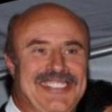

In [ ]:
import os
from PIL import Image

# test_img_path = f'{LFW_yolo_root}/Abel_Pacheco/Abel_Pacheco_0001.jpg'
test_img_path = f'{LFW_yolo_root}/Phil_McGraw/Phil_McGraw_0001.jpg'
# test_img_path = f'{LFW_yolo_root}/John_Bolton/John_Bolton_0016.jpg'

pil_img = Image.open(test_img_path)
print(pil_img.size)
pil_img

# Модель "экстрактор фичей"

In [ ]:
# !pip uninstall -q ultralytics

In [ ]:
!pip install -q torch torchvision ultralytics

In [ ]:
from torch import nn
from torchvision.models import efficientnet_b0


class EfficientNetB0(nn.Module):
    def __init__(self, embedding_size=512, pretrained=True):
        super(EfficientNetB0, self).__init__()
        self.model = efficientnet_b0(pretrained=pretrained)
        self.model.classifier = nn.Sequential(
            nn.Dropout(p=0.05, inplace=True),
            nn.Linear(in_features=1280,
                      out_features=embedding_size)
        )

    def forward(self, x):
        return self.model(x)

In [ ]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchvision.models._api import WeightsEnum
from torch.hub import load_state_dict_from_url

def get_state_dict(self, *args, **kwargs):
    kwargs.pop("check_hash")
    return load_state_dict_from_url(self.url, *args, **kwargs)
WeightsEnum.get_state_dict = get_state_dict

# efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
# efficientnet_b0(weights="DEFAULT")


In [ ]:
import torch
embed_size = 512
model = EfficientNetB0(embed_size, pretrained=True).to(device)
model.weights = EfficientNet_B0_Weights.IMAGENET1K_V1
# # ckpt = torch.load('/content/yolov8n-face.pth',
# #                   map_location=device)
# # model.load_state_dict(ckpt)
# model = EfficientNetB0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 151MB/s]


EfficientNetB0(
  (model): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): MBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
              (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
            (1): SqueezeExcitation(
              (avgpool): AdaptiveAvgPool2d(output_size=1)
              (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (activation): SiLU(inplace=True)
              (scale_

# ArcFace Loss and model definition

#### ArcFace Loss

Хорошая статья:

https://habr.com/ru/companies/ntechlab/articles/531842/


Implementations of ArcFace on PyTorch:

https://github.com/ronghuaiyang/arcface-pytorch/blob/master/models/metrics.py

https://github.com/deepinsight/insightface/blob/master/recognition/arcface_torch/losses.py

General meaning: we train the model as a classifier; we do not use ArcFace during inference - because only embeddings are needed.

In [ ]:
import torch
from torch import nn
import math
import torch.nn.functional as F

class ArcMarginProduct(nn.Module):
    r"""Implement of large margin arc distance: :
        Args:
            in_features: size of each input sample
            out_features: size of each output sample
            s: norm of input feature
            m: margin

            cos(theta + m)
        """

    def __init__(self, in_features, out_features, s=30.0, m=0.50, easy_margin=False):
        super(ArcMarginProduct, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.s = s
        self.m = m
        self.weight = nn.Parameter(torch.FloatTensor(out_features, in_features))
        nn.init.xavier_uniform_(self.weight)

        self.easy_margin = easy_margin
        self.cos_m = math.cos(m)
        self.sin_m = math.sin(m)
        self.th = math.cos(math.pi - m)
        self.mm = math.sin(math.pi - m) * m

    def forward(self, input, label):
        # --------------------------- cos(theta) & phi(theta) ---------------------------
        cosine = F.linear(F.normalize(input).to(device), F.normalize(self.weight).to(device))
        sine = torch.sqrt((1.0 - torch.pow(cosine, 2)).clamp(0, 1))
        phi = cosine * self.cos_m - sine * self.sin_m
        if self.easy_margin:
            phi = torch.where(cosine > 0, phi, cosine)
        else:
            phi = torch.where(cosine > self.th, phi, cosine - self.mm)
        # --------------------------- convert label to one-hot ---------------------------
        # one_hot = torch.zeros(cosine.size(), requires_grad=True, device='cuda')
        one_hot = torch.zeros(cosine.size(), device='cuda')
        one_hot.scatter_(1, label.view(-1, 1).long(), 1)
        # -------------torch.where(out_i = {x_i if condition_i else y_i) -------------
        output = (one_hot * phi) + (
                    (1.0 - one_hot) * cosine)  # you can use torch.where if your torch.__version__ is 0.4
        output *= self.s
        # print(output)

        return output

##Defining model

In [ ]:
LFW_yolo_root = '/content/LFW-yolo'
num_classes = len(os.listdir(LFW_yolo_root))
weight_decay = 5e-4
lr = 5e-4
lr_step = 10
embed_size = 512
model = EfficientNetB0(embed_size, pretrained=True).to(device)
model.weights = EfficientNet_B0_Weights.IMAGENET1K_V1
model.eval()
metric_fc = ArcMarginProduct(embed_size, num_classes, s=30, m=0.5)
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW([{'params': model.parameters()},
                              {'params': metric_fc.parameters()}],
                            lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=lr_step, gamma=0.1)

#Dataset and Dataloader

In [ ]:
# Task - implement a dataloader + train a feature extractor
dataset = None
dataloader = None
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os


class LFWDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.image_paths, self.labels, self.label_map = self.load_lfw_data()

    def load_lfw_data(self):
        image_paths = []
        labels = []
        label_map = {}

        # Assuming data_dir has subdirectories with names as person identities
        for idx, person_name in enumerate(os.listdir(self.data_dir)):
            person_dir = os.path.join(self.data_dir, person_name)
            if os.path.isdir(person_dir):
                label_map[person_name] = idx
                for filename in os.listdir(person_dir):
                    if filename.endswith(('.jpg', '.png', '.jpeg')):
                        image_path = os.path.join(person_dir, filename)
                        image_paths.append(image_path)
                        labels.append(person_name)

        return image_paths, labels, label_map

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label_str = self.labels[idx]

        # Map the class label to a numerical index
        label = self.label_map[label_str]
        # label = one_hot(torch.tensor(label), num_classes=len(self.label_map))
        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

# Example usage:
# Define the data directory and transformation
data_directory = '/content/LFW-yolo'
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Create an instance of the LFWDataset
lfw_dataset = LFWDataset(data_dir=data_directory, transform=transform)

# Create a DataLoader
batch_size = 32
lfw_dataloader = DataLoader(lfw_dataset, batch_size=batch_size, shuffle=True, num_workers=2)


#Training functions

In [ ]:
def train_one_epoch(model, metric_fc, dataloader, optimizer, criterion):
    model.to(device)
    model.train()
    all_correct = 0
    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        outputs = metric_fc(outputs.to(device), labels.to(device))
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        _, preds = torch.max(outputs, 1)
        cur_corrects_cnt = torch.sum(preds == labels.detach()) # for statistics
        all_correct += cur_corrects_cnt

In [ ]:
num_classes = len(os.listdir('/content/LFW-yolo'))
num_classes

5749

In [ ]:
from sklearn.metrics import f1_score
import torch
import torch.nn.functional as F
def f1_score_from_scratch(y_true, y_pred, epsilon=1e-7):
    tp = torch.sum(y_true * y_pred)
    fp = torch.sum((1 - y_true) * y_pred)
    fn = torch.sum(y_true * (1 - y_pred))

    precision = tp / (tp + fp + epsilon)
    recall = tp / (tp + fn + epsilon)
    # print('precision: ', precision.item(), 'recall: ', recall.item())
    if precision + recall == 0:
      print('deviding on zero, values: ', tp, fp)
    f1 = 2 * (precision * recall) / (precision + recall + epsilon)

    return f1.item()
def calculate_f1(outputs, labels, threshold):
    outputs = outputs - outputs.min()
    outputs = outputs / outputs.max()
    # print(outputs)
    predictions = (outputs > threshold).int()
    one_hot_labels = torch.nn.functional.one_hot(labels, predictions.shape[1])
    return f1_score_from_scratch(one_hot_labels, predictions)
    # return f1_score_from_scratch(one_hot_labels.cpu().numpy(), predictions.cpu().numpy())
def calculate_acc(outputs, labels, threshold):
    # outputs = outputs - outputs.min()
    # outputs = outputs / outputs.max()
    # y_pred_binary = (outputs > threshold).int()
    # y_true_binary = torch.nn.functional.one_hot(labels, y_pred_binary.shape[1])

    # return (y_pred_binary == y_true_binary).float().mean().item()
    _, preds = torch.max(outputs, 1)
    cur_corrects_cnt = torch.sum(preds == labels.detach())  # for statistics
    total_samples = labels.size(0)
    return cur_corrects_cnt/total_samples

def train_one_epoch(model, metric_fc, dataloader, optimizer, criterion, epoch, assessment_interval=5, test_dataloader=None):
    if not test_dataloader:
      test_dataloader = dataloader
    model.to(device)
    model.train()
    all_correct = 0
    total_samples = 0
    running_loss = 0.0

    # Variables for assessment
    best_f1 = 0.0
    best_threshold = 0.0
    current_f1 = 0.0

    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        outputs = metric_fc(outputs.to(device), labels.to(device))
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        _, preds = torch.max(outputs, 1)
        cur_corrects_cnt = torch.sum(preds == labels.detach())  # for statistics
        all_correct += cur_corrects_cnt
        total_samples += labels.size(0)
        running_loss += loss.item()

    # Calculate accuracy and loss for the epoch
    epoch_accuracy = all_correct.double() / total_samples
    epoch_loss = running_loss / len(dataloader)
    best_sub_threshold = None
    acc = None
    if epoch % assessment_interval == 0:
        # Run assessment every N epochs
        model.eval()
        all_labels = []
        all_outputs = []

        with torch.no_grad():
            for inputs, labels in test_dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                outputs = metric_fc(outputs.to(device), labels.to(device))

                all_labels.extend(labels.cpu().numpy())
                all_outputs.extend(outputs.cpu().numpy())

        all_labels = torch.tensor(all_labels).to(device)
        all_outputs = torch.tensor(all_outputs).to(device)

        # Find the best threshold
        i = 0
        best_sub_threshold = torch.zeros(9).to(device)
        accuracy_list = []
        thresholds = torch.arange(0.1, 1.0, 0.1).to(device)
        # thresholds = torch.arange(0.91, 1.0, 0.01).to(device)

        for threshold in thresholds:
            current_f1 = calculate_f1(all_outputs, all_labels, threshold)
            if current_f1 > best_f1:
                best_f1 = current_f1
                best_threshold = threshold.item()
                best_sub_threshold[i] += 1
            i += 1
            epoch_thr_accuracy_val = calculate_acc(all_outputs, all_labels, threshold)
            accuracy_list.append(epoch_thr_accuracy_val)
        best_thresholds = torch.index_select(thresholds, 0,\
                                (best_sub_threshold == best_sub_threshold.max()).nonzero(as_tuple=True)[0])
        acc = max(accuracy_list)

        print(f"Epoch {epoch} Val: Accuracy {max(accuracy_list):.4f}, Loss: {epoch_loss:.4f}, Best Thresholds: {best_thresholds.tolist()[-1]}, Best F1: {best_f1:.5f}")

    return epoch_accuracy, epoch_loss, best_sub_threshold, acc, best_f1


In [ ]:
import matplotlib.pyplot as plt

def plot_accuracies(train_accuracies, test_accuracies, test_epochs_interval=5):
    # Plotting the accuracies
    train_epochs = range(0, len(train_accuracies))
    test_epochs = range(0, len(test_accuracies)*test_epochs_interval, test_epochs_interval)
    # print(train_accuracies)
    plt.plot(train_epochs, train_accuracies, 'b', label='Training Accuracy')
    plt.plot(test_epochs, test_accuracies, 'r', label='Val Accuracy')

    plt.title('Training and Val Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()
import matplotlib.pyplot as plt

def plot_f1_scores(f1_scores, test_epochs_interval=5):
    test_epochs = range(0, len(f1_scores)*test_epochs_interval, test_epochs_interval)

    plt.plot(test_epochs, f1_scores, 'r', label='f1 scores')

    plt.title('f1_scores Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

# # Assuming you have lists of training and test accuracies, replace these with your actual lists
# train_accuracies = [0.8, 0.83, 0.85, 0.9, 0.91, 0.92, 0.95, 0.96, 0.98, 0.99]
# # Test accuracies added every 5 epochs
# test_accuracies = [0.75, 0.82, 0.9]

# plot_accuracies(train_accuracies, test_accuracies)



In [ ]:
best_sub_threshold = torch.tensor([0, 1, 2, 8, 4, 5, 6, 7, 8], device=device)
best_sub_threshold2 = torch.tensor([0, 1, 2, 3, 4, 5, 6, 7, 8], device=device)
torch.index_select(best_sub_threshold2, 0,\
                   (best_sub_threshold == best_sub_threshold.max()).nonzero(as_tuple=True)[0])

tensor([3, 8], device='cuda:0')

#Training with all imbalanced classes

<ipython-input-34-2044dbcf7266>:92: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  all_outputs = torch.tensor(all_outputs).to(device)


deviding on zero, values:  tensor(0, device='cuda:0') tensor(7, device='cuda:0')
Epoch 0 Val: Accuracy 0.1082, Loss: 20.7525, Best Thresholds: 0.699999988079071, Best F1: 0.15295
Epoch 0: train accuracy: 0.0521, Loss: 20.7525, Best Thresholds: 0.699999988079071
Epoch 1: train accuracy: 0.1197, Loss: 16.6984, Best Thresholds: 0.699999988079071
Epoch 2: train accuracy: 0.1853, Loss: 12.6798, Best Thresholds: 0.699999988079071
Epoch 3: train accuracy: 0.2395, Loss: 9.2386, Best Thresholds: 0.699999988079071
Epoch 4: train accuracy: 0.2936, Loss: 6.4986, Best Thresholds: 0.699999988079071
Epoch 5 Val: Accuracy 0.7253, Loss: 4.2964, Best Thresholds: 0.699999988079071, Best F1: 0.57456


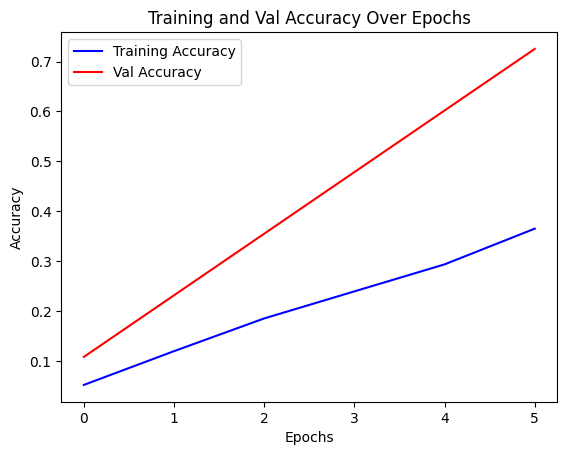

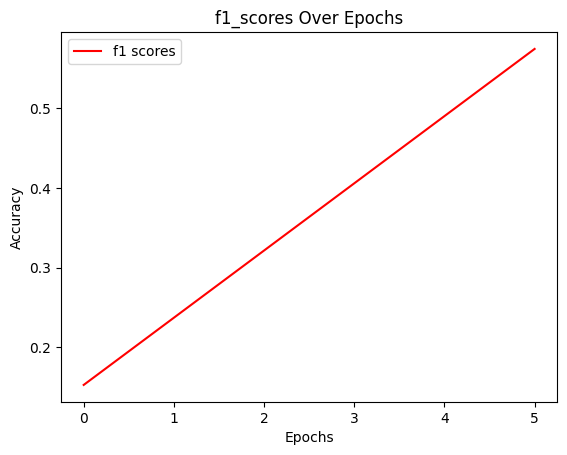

Epoch 5: train accuracy: 0.3651, Loss: 4.2964, Best Thresholds: 0.699999988079071
Epoch 6: train accuracy: 0.5156, Loss: 2.6321, Best Thresholds: 0.699999988079071
Epoch 7: train accuracy: 0.7559, Loss: 1.4346, Best Thresholds: 0.699999988079071
Epoch 8: train accuracy: 0.9068, Loss: 0.7109, Best Thresholds: 0.699999988079071
Epoch 9: train accuracy: 0.9629, Loss: 0.3928, Best Thresholds: 0.699999988079071
Epoch 10 Val: Accuracy 0.9989, Loss: 0.2623, Best Thresholds: 0.699999988079071, Best F1: 0.98694


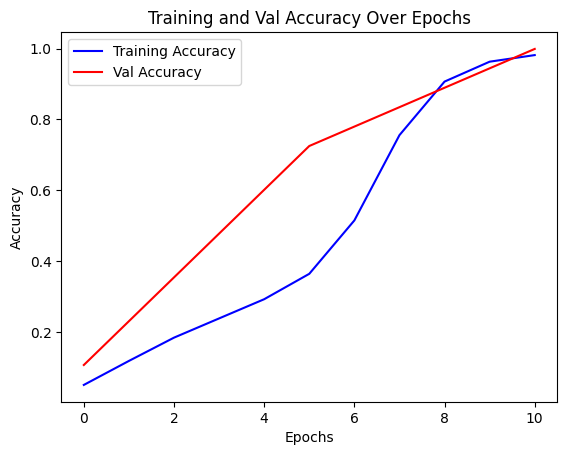

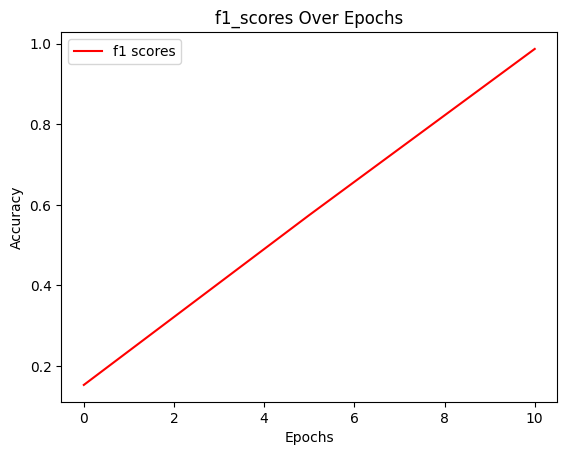

Epoch 10: train accuracy: 0.9815, Loss: 0.2623, Best Thresholds: 0.699999988079071


In [ ]:
epochs = 11
epoch_accuracies = []
epoch_losses = []
best_thresholds_freqs  = torch.zeros(9).to(device)
all_thresholds = torch.arange(0.1, 1.0, 0.1).to(device)
test_accuracies = []
train_accuracies = []
f1_scores = []
# Create an instance of the LFWDataset
lfw_dataset = LFWDataset(data_dir=data_directory, transform=transform)

# Create a DataLoader
batch_size = 32
lfw_dataloader = DataLoader(lfw_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
for epoch in range(epochs):
  epoch_accuracy, epoch_loss, best_thresholds_freq, test_acc, best_f1 = train_one_epoch(model, metric_fc,\
                      lfw_dataloader, optimizer, criterion, epoch)
  train_accuracies.append(epoch_accuracy.item())
  if test_acc != None:
    f1_scores.append(best_f1)
    test_accuracies.append(test_acc.item())
    if epoch >0:
      plot_accuracies(train_accuracies, test_accuracies)
      plot_f1_scores(f1_scores)
  if type(best_thresholds_freq) == type(torch.tensor(1)):
    best_thresholds_freqs += best_thresholds_freq
    best_thresholds = torch.index_select(all_thresholds, 0,\
                    (best_thresholds_freqs == best_thresholds_freqs.max()).nonzero(as_tuple=True)[0]).tolist()

  print(f"Epoch {epoch}: train accuracy: {epoch_accuracy:.4f}, Loss: {epoch_loss:.4f}, Best Thresholds: { best_thresholds[-1]}")

  epoch_accuracies.append(epoch_accuracy), epoch_losses.append(epoch_loss)

In [ ]:
!mkdir '/content/drive/MyDrive/saved_models'
!mkdir '/content/drive/MyDrive/saved_models/task2_image_generation'

In [ ]:
torch.save(model.state_dict(), '/content/drive/MyDrive/saved_models/task2_image_generation/model_imbalanced.pth')

#Training with balanced classes

##splitting data

In [ ]:
!mkdir "train_data"
!mkdir "test_data"

In [ ]:
data_root = '/content/LFW-yolo'
data_list = os.walk(data_root)
for root, folder, files in data_list:
  if len(files)>0:
    print(os.path.isdir(root), folder, files)
    break

True [] ['Richard_Naughton_0001.jpg']


In [ ]:
!rm -r '/content/train_data'
!rm -r '/content/test_data'

In [ ]:
data_root = '/content/LFW-yolo'
data_list = os.walk(data_root)
split_per = 0.3
cls_size = 20
cls_num = 0
if not os.path.isdir('train_data'):
  os.mkdir('train_data')
if not os.path.isdir('test_data'):
  os.mkdir('test_data')
import random
for root, folder, files in data_list:
  if len(files) > cls_size:
    shuffeled = files
    random.shuffle(shuffeled)
    test_files = shuffeled[:int(split_per*cls_size)]
    train_files = shuffeled[int(split_per*cls_size):cls_size]
    for x in train_files:
      if x.split('.')[-1] in ['png', 'jpg', 'jpeg']:
        folder_path = '/content/train_data/' + root.split('/')[-1]
        if not os.path.isdir(folder_path):
          os.mkdir(folder_path)
        Image.open(root + '/' + x).save(folder_path + '/' + x)
    for x in test_files:
      if x.split('.')[-1] in ['png', 'jpg', 'jpeg']:
        folder_path = '/content/test_data/' + root.split('/')[-1]
        if not os.path.isdir(folder_path):
          os.mkdir(folder_path)
        Image.open(root + '/' + x).save(folder_path + '/' + x)
    cls_num += 1
print('saved ', cls_num)

saved  57


In [ ]:
# Create an instance of the LFWDataset
lfw_dataset_trian = LFWDataset(data_dir='/content/train_data', transform=transform)
lfw_dataset_test = LFWDataset(data_dir='/content/test_data', transform=transform)

# Create a DataLoader
batch_size = 32
lfw_dataloader_train = DataLoader(lfw_dataset_trian, batch_size=batch_size, shuffle=True, num_workers=2)
lfw_dataloader_test = DataLoader(lfw_dataset_test, batch_size=batch_size, shuffle=True, num_workers=2)


##training

tensor([[0.5029, 0.4885, 0.5516,  ..., 0.3572, 0.3694, 0.4075],
        [0.4999, 0.5137, 0.5202,  ..., 0.3137, 0.3870, 0.4264],
        [0.5273, 0.5009, 0.4422,  ..., 0.4733, 0.4531, 0.4610],
        ...,
        [0.5751, 0.6293, 0.4817,  ..., 0.4013, 0.4169, 0.3754],
        [0.4871, 0.4577, 0.5031,  ..., 0.4431, 0.4388, 0.4347],
        [0.5175, 0.4411, 0.4556,  ..., 0.3572, 0.4024, 0.3966]], device='cuda:0')
precision:  0.00014088855823501945 recall:  0.8099415302276611
tensor([[0.5029, 0.4885, 0.5516,  ..., 0.3572, 0.3694, 0.4075],
        [0.4999, 0.5137, 0.5202,  ..., 0.3137, 0.3870, 0.4264],
        [0.5273, 0.5009, 0.4422,  ..., 0.4733, 0.4531, 0.4610],
        ...,
        [0.5751, 0.6293, 0.4817,  ..., 0.4013, 0.4169, 0.3754],
        [0.4871, 0.4577, 0.5031,  ..., 0.4431, 0.4388, 0.4347],
        [0.5175, 0.4411, 0.4556,  ..., 0.3572, 0.4024, 0.3966]], device='cuda:0')
precision:  6.561729969689623e-05 recall:  0.37719297409057617
tensor([[0.5029, 0.4885, 0.5516,  ..., 0.357

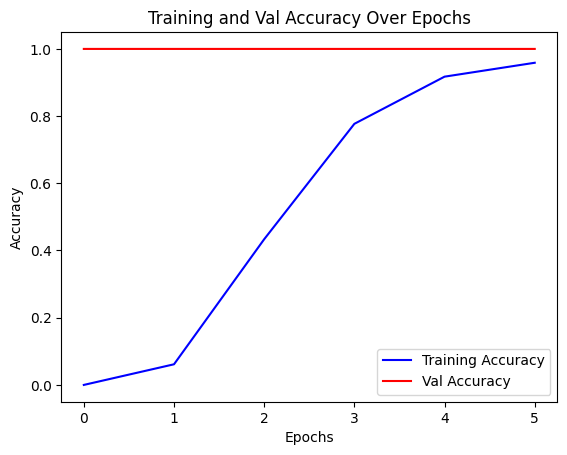

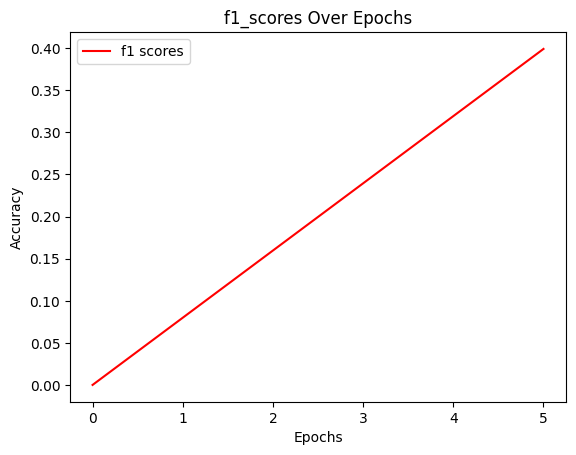

Epoch 5: train accuracy: 0.9586, Loss: 0.1854, Best Thresholds: 0.6000000238418579
Epoch 6: train accuracy: 0.9699, Loss: 0.1204, Best Thresholds: 0.6000000238418579
Epoch 7: train accuracy: 0.9599, Loss: 0.1567, Best Thresholds: 0.6000000238418579
Epoch 8: train accuracy: 0.9724, Loss: 0.0968, Best Thresholds: 0.6000000238418579
Epoch 9: train accuracy: 0.9699, Loss: 0.1004, Best Thresholds: 0.6000000238418579
tensor([[0.4110, 0.3864, 0.5082,  ..., 0.3545, 0.3501, 0.3348],
        [0.3897, 0.4509, 0.3500,  ..., 0.3380, 0.3496, 0.3577],
        [0.3435, 0.4785, 0.3638,  ..., 0.3623, 0.3758, 0.3488],
        ...,
        [0.3231, 0.2865, 0.5869,  ..., 0.3472, 0.3644, 0.3247],
        [0.4037, 0.3981, 0.5123,  ..., 0.3426, 0.3664, 0.3496],
        [0.4331, 0.4171, 0.3826,  ..., 0.3680, 0.3695, 0.3270]], device='cuda:0')
precision:  0.0001729262585286051 recall:  0.9941520690917969
tensor([[0.4110, 0.3864, 0.5082,  ..., 0.3545, 0.3501, 0.3348],
        [0.3897, 0.4509, 0.3500,  ..., 0.338

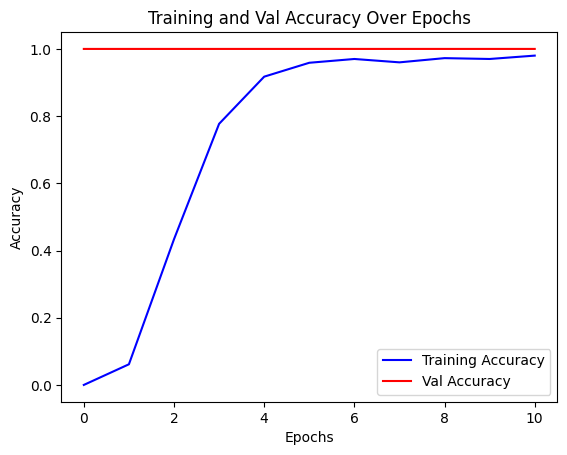

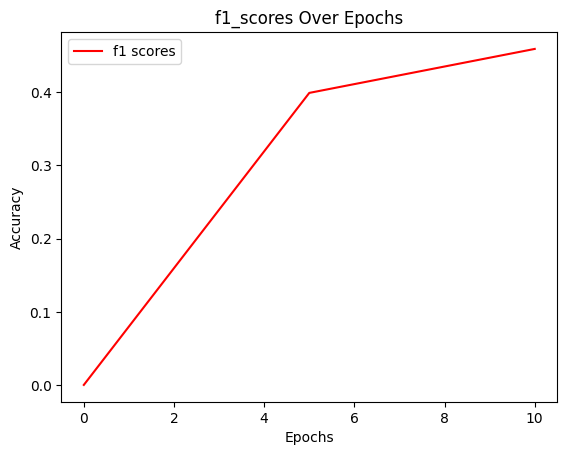

Epoch 10: train accuracy: 0.9799, Loss: 0.0853, Best Thresholds: 0.6000000238418579
Epoch 11: train accuracy: 0.9825, Loss: 0.0857, Best Thresholds: 0.6000000238418579
Epoch 12: train accuracy: 0.9812, Loss: 0.0772, Best Thresholds: 0.6000000238418579
Epoch 13: train accuracy: 0.9787, Loss: 0.0731, Best Thresholds: 0.6000000238418579
Epoch 14: train accuracy: 0.9712, Loss: 0.1058, Best Thresholds: 0.6000000238418579
tensor([[0.4361, 0.4590, 0.4828,  ..., 0.4211, 0.3932, 0.4259],
        [0.5132, 0.5180, 0.4189,  ..., 0.4076, 0.4354, 0.4091],
        [0.4723, 0.5213, 0.3576,  ..., 0.4110, 0.4102, 0.3963],
        ...,
        [0.4485, 0.4279, 0.4745,  ..., 0.4056, 0.3973, 0.4277],
        [0.4357, 0.3997, 0.6477,  ..., 0.4229, 0.4329, 0.4058],
        [0.3843, 0.3667, 0.3520,  ..., 0.4211, 0.4313, 0.4093]], device='cuda:0')
precision:  0.00017343477520626038 recall:  0.9970760345458984
tensor([[0.4361, 0.4590, 0.4828,  ..., 0.4211, 0.3932, 0.4259],
        [0.5132, 0.5180, 0.4189,  ...,

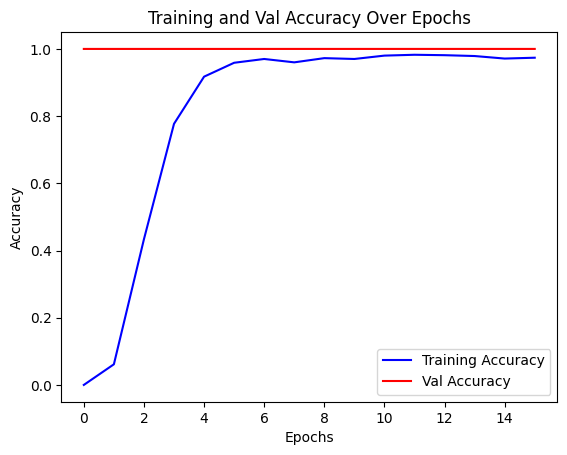

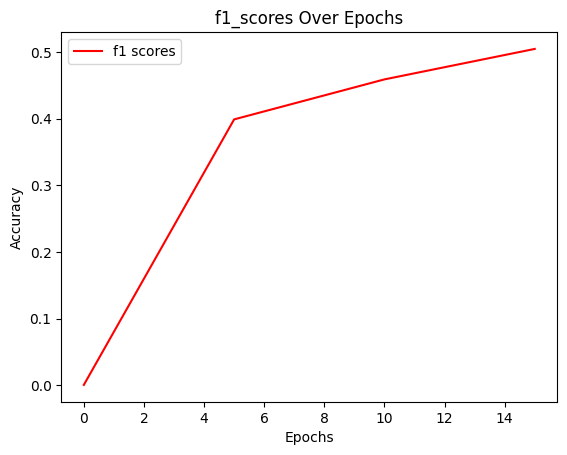

Epoch 15: train accuracy: 0.9737, Loss: 0.0970, Best Thresholds: 0.6000000238418579
Epoch 16: train accuracy: 0.9749, Loss: 0.0946, Best Thresholds: 0.6000000238418579
Epoch 17: train accuracy: 0.9624, Loss: 0.1347, Best Thresholds: 0.6000000238418579
Epoch 18: train accuracy: 0.9762, Loss: 0.0870, Best Thresholds: 0.6000000238418579
Epoch 19: train accuracy: 0.9712, Loss: 0.0843, Best Thresholds: 0.6000000238418579
tensor([[0.4626, 0.4474, 0.3478,  ..., 0.3782, 0.3931, 0.3959],
        [0.3441, 0.4159, 0.4976,  ..., 0.2963, 0.3437, 0.3135],
        [0.4565, 0.4220, 0.3284,  ..., 0.3217, 0.3485, 0.3138],
        ...,
        [0.4435, 0.3392, 0.2778,  ..., 0.3398, 0.3591, 0.3432],
        [0.3886, 0.3314, 0.4107,  ..., 0.3328, 0.3347, 0.3353],
        [0.3550, 0.2740, 0.3859,  ..., 0.3555, 0.3878, 0.3537]], device='cuda:0')
precision:  0.00017140069394372404 recall:  0.9853801131248474
tensor([[0.4626, 0.4474, 0.3478,  ..., 0.3782, 0.3931, 0.3959],
        [0.3441, 0.4159, 0.4976,  ...,

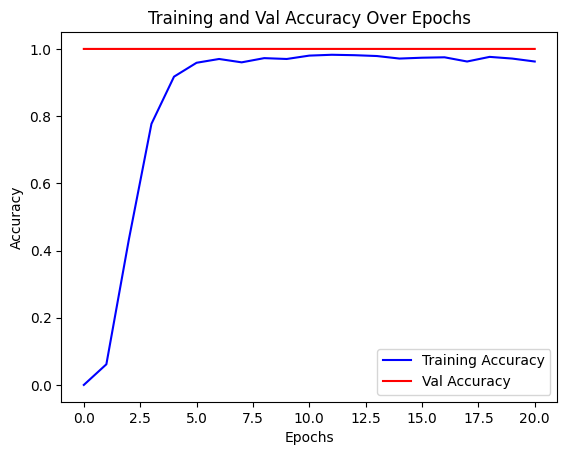

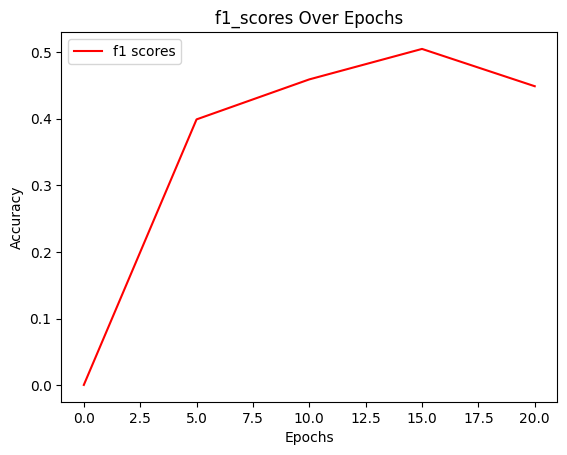

Epoch 20: train accuracy: 0.9624, Loss: 0.1450, Best Thresholds: 0.6000000238418579
Epoch 21: train accuracy: 0.9762, Loss: 0.1303, Best Thresholds: 0.6000000238418579
Epoch 22: train accuracy: 0.9774, Loss: 0.0819, Best Thresholds: 0.6000000238418579
Epoch 23: train accuracy: 0.9724, Loss: 0.1034, Best Thresholds: 0.6000000238418579
Epoch 24: train accuracy: 0.9712, Loss: 0.1056, Best Thresholds: 0.6000000238418579
tensor([[0.5549, 0.3348, 0.3371,  ..., 0.3098, 0.3330, 0.3236],
        [0.4158, 0.3246, 0.2644,  ..., 0.3420, 0.3153, 0.3316],
        [0.3646, 0.2531, 0.4227,  ..., 0.3229, 0.3448, 0.3377],
        ...,
        [0.4950, 0.2904, 0.3371,  ..., 0.3188, 0.3274, 0.3118],
        [0.2187, 0.4185, 0.4145,  ..., 0.3203, 0.3417, 0.3107],
        [0.2675, 0.3009, 0.4643,  ..., 0.3196, 0.3308, 0.3496]], device='cuda:0')
precision:  0.00016733251686673611 recall:  0.9619883298873901
tensor([[0.5549, 0.3348, 0.3371,  ..., 0.3098, 0.3330, 0.3236],
        [0.4158, 0.3246, 0.2644,  ...,

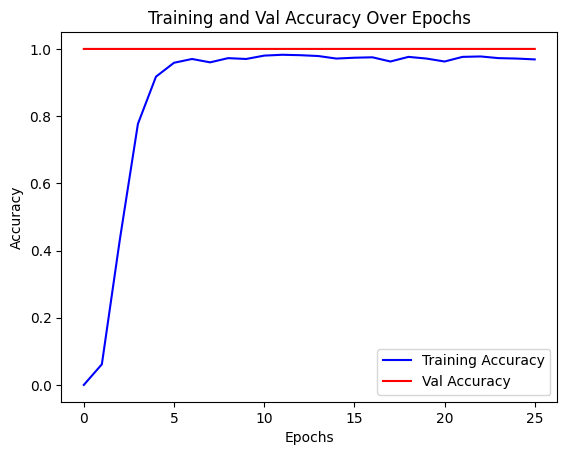

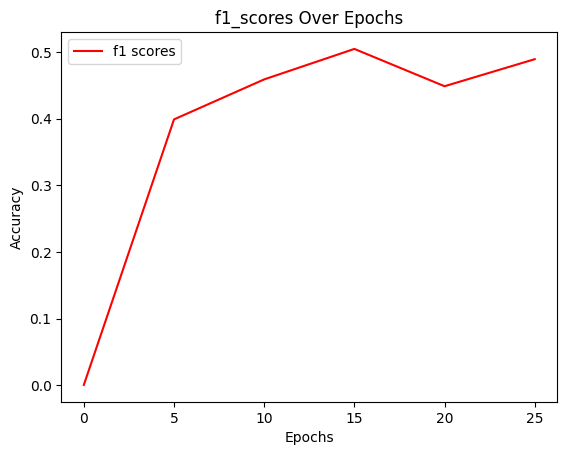

Epoch 25: train accuracy: 0.9687, Loss: 0.1574, Best Thresholds: 0.6000000238418579
Epoch 26: train accuracy: 0.9612, Loss: 0.1543, Best Thresholds: 0.6000000238418579
Epoch 27: train accuracy: 0.9474, Loss: 0.2130, Best Thresholds: 0.6000000238418579
Epoch 28: train accuracy: 0.9574, Loss: 0.2603, Best Thresholds: 0.6000000238418579
Epoch 29: train accuracy: 0.9599, Loss: 0.2218, Best Thresholds: 0.6000000238418579
tensor([[0.5345, 0.3931, 0.2769,  ..., 0.3395, 0.3524, 0.3571],
        [0.4495, 0.3050, 0.3968,  ..., 0.3438, 0.3311, 0.3575],
        [0.4619, 0.5175, 0.4124,  ..., 0.3590, 0.3522, 0.3725],
        ...,
        [0.4252, 0.3163, 0.3090,  ..., 0.3409, 0.3451, 0.3370],
        [0.5173, 0.4153, 0.3285,  ..., 0.3789, 0.3721, 0.3777],
        [0.3116, 0.4699, 0.3009,  ..., 0.3409, 0.3442, 0.3632]], device='cuda:0')
precision:  0.00017089217726606876 recall:  0.9824561476707458
tensor([[0.5345, 0.3931, 0.2769,  ..., 0.3395, 0.3524, 0.3571],
        [0.4495, 0.3050, 0.3968,  ...,

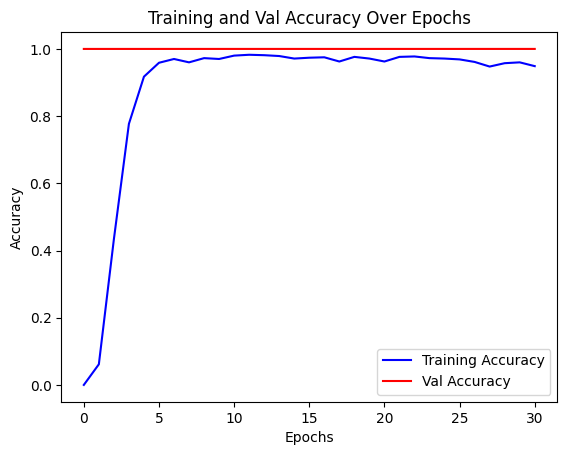

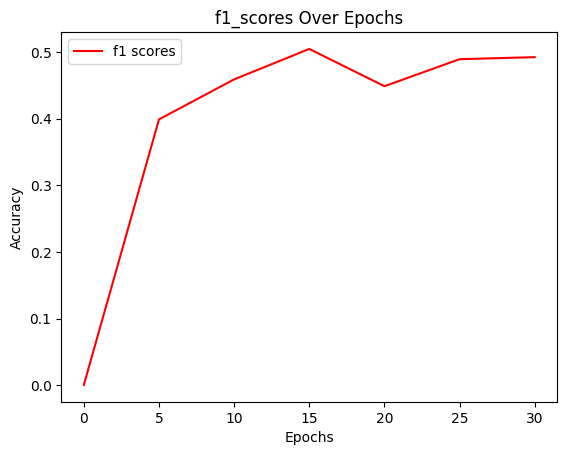

Epoch 30: train accuracy: 0.9486, Loss: 0.2220, Best Thresholds: 0.6000000238418579
Epoch 31: train accuracy: 0.9624, Loss: 0.1427, Best Thresholds: 0.6000000238418579
Epoch 32: train accuracy: 0.9774, Loss: 0.1173, Best Thresholds: 0.6000000238418579
Epoch 33: train accuracy: 0.9799, Loss: 0.1144, Best Thresholds: 0.6000000238418579
Epoch 34: train accuracy: 0.9825, Loss: 0.0874, Best Thresholds: 0.6000000238418579
tensor([[0.4190, 0.4021, 0.4159,  ..., 0.3819, 0.3618, 0.3843],
        [0.5566, 0.4141, 0.4207,  ..., 0.3573, 0.3549, 0.3615],
        [0.3574, 0.3911, 0.4124,  ..., 0.3387, 0.3360, 0.3325],
        ...,
        [0.3997, 0.3588, 0.3337,  ..., 0.3801, 0.3819, 0.3902],
        [0.4682, 0.3894, 0.5006,  ..., 0.3827, 0.3701, 0.3878],
        [0.5130, 0.4975, 0.3428,  ..., 0.3607, 0.3639, 0.3656]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.4190, 0.4021, 0.4159,  ..., 0.3819, 0.3618, 0.3843],
        [0.5566, 0.4141, 0.4207,  ...,

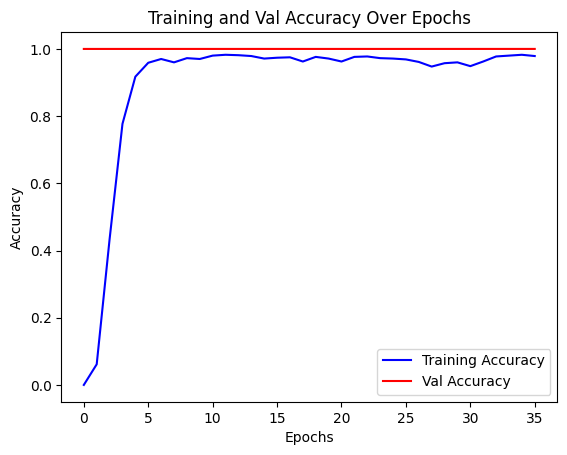

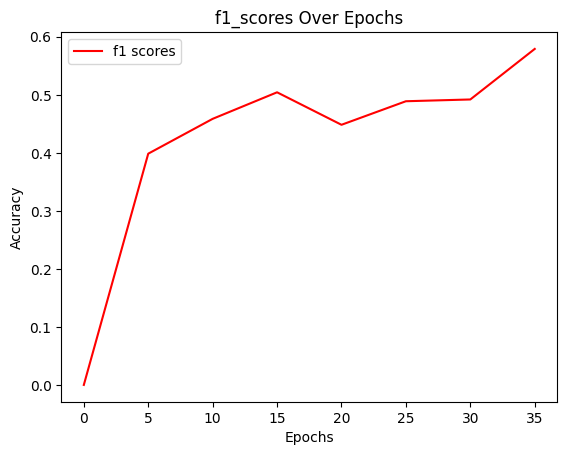

Epoch 35: train accuracy: 0.9787, Loss: 0.0929, Best Thresholds: 0.6000000238418579
Epoch 36: train accuracy: 0.9787, Loss: 0.1298, Best Thresholds: 0.6000000238418579
Epoch 37: train accuracy: 0.9687, Loss: 0.1877, Best Thresholds: 0.6000000238418579
Epoch 38: train accuracy: 0.9574, Loss: 0.2125, Best Thresholds: 0.6000000238418579
Epoch 39: train accuracy: 0.9712, Loss: 0.1617, Best Thresholds: 0.6000000238418579
tensor([[0.3753, 0.4053, 0.3718,  ..., 0.3569, 0.3380, 0.3717],
        [0.4136, 0.3438, 0.3902,  ..., 0.3496, 0.3485, 0.3510],
        [0.4779, 0.4517, 0.3493,  ..., 0.3556, 0.3598, 0.3596],
        ...,
        [0.5990, 0.3770, 0.3443,  ..., 0.3575, 0.3808, 0.3727],
        [0.4382, 0.4654, 0.3926,  ..., 0.3261, 0.3338, 0.3548],
        [0.3521, 0.3494, 0.4144,  ..., 0.3812, 0.3882, 0.3759]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.3753, 0.4053, 0.3718,  ..., 0.3569, 0.3380, 0.3717],
        [0.4136, 0.3438, 0.3902,  ...,

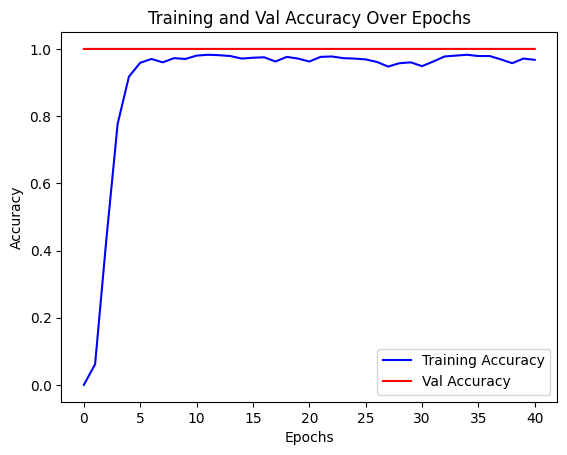

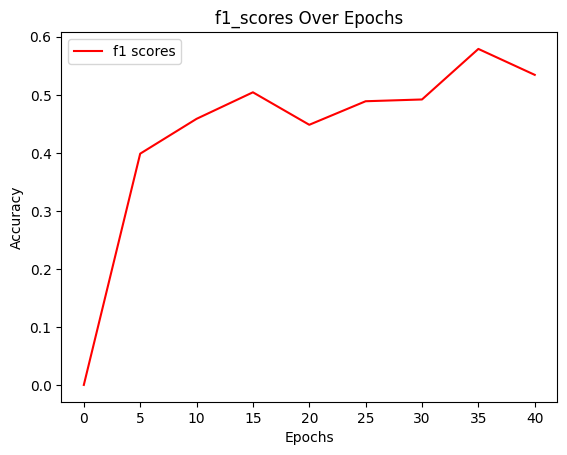

Epoch 40: train accuracy: 0.9674, Loss: 0.2252, Best Thresholds: 0.6000000238418579
Epoch 41: train accuracy: 0.9649, Loss: 0.1476, Best Thresholds: 0.6000000238418579
Epoch 42: train accuracy: 0.9749, Loss: 0.0856, Best Thresholds: 0.6000000238418579
Epoch 43: train accuracy: 0.9875, Loss: 0.0808, Best Thresholds: 0.6000000238418579
Epoch 44: train accuracy: 0.9900, Loss: 0.0548, Best Thresholds: 0.6000000238418579
tensor([[0.2415, 0.3998, 0.2612,  ..., 0.3151, 0.3096, 0.3186],
        [0.5539, 0.3342, 0.2919,  ..., 0.3109, 0.3083, 0.3303],
        [0.2958, 0.3221, 0.3556,  ..., 0.3597, 0.3653, 0.3625],
        ...,
        [0.3284, 0.4359, 0.2399,  ..., 0.3485, 0.3385, 0.3355],
        [0.3286, 0.3640, 0.3928,  ..., 0.3407, 0.3520, 0.3323],
        [0.3749, 0.2933, 0.3844,  ..., 0.3488, 0.3645, 0.3528]], device='cuda:0')
precision:  0.00017190922517329454 recall:  0.988304078578949
tensor([[0.2415, 0.3998, 0.2612,  ..., 0.3151, 0.3096, 0.3186],
        [0.5539, 0.3342, 0.2919,  ..., 

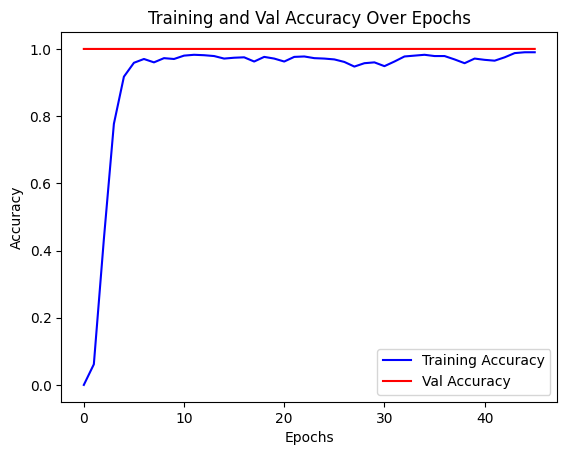

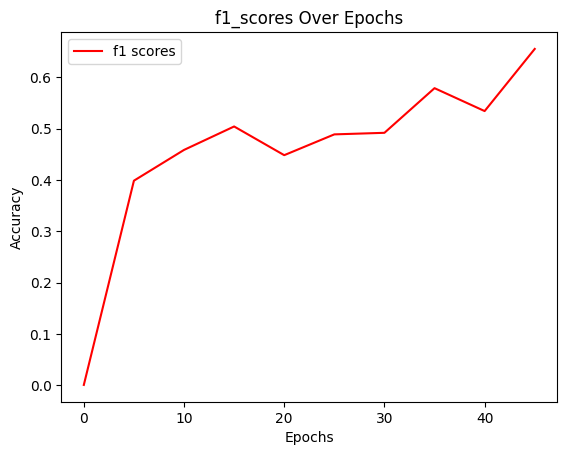

Epoch 45: train accuracy: 0.9900, Loss: 0.0499, Best Thresholds: 0.6000000238418579
Epoch 46: train accuracy: 0.9875, Loss: 0.0557, Best Thresholds: 0.6000000238418579
Epoch 47: train accuracy: 0.9837, Loss: 0.0989, Best Thresholds: 0.6000000238418579
Epoch 48: train accuracy: 0.9850, Loss: 0.0670, Best Thresholds: 0.6000000238418579
Epoch 49: train accuracy: 0.9900, Loss: 0.0473, Best Thresholds: 0.6000000238418579
tensor([[0.3374, 0.2500, 0.2329,  ..., 0.3195, 0.3212, 0.3334],
        [0.3283, 0.3011, 0.3241,  ..., 0.3088, 0.3170, 0.3247],
        [0.4357, 0.4102, 0.3169,  ..., 0.3484, 0.3509, 0.3524],
        ...,
        [0.3666, 0.3814, 0.3313,  ..., 0.2965, 0.2791, 0.2987],
        [0.1851, 0.3344, 0.3715,  ..., 0.3134, 0.3302, 0.3062],
        [0.3181, 0.3433, 0.2961,  ..., 0.2819, 0.2910, 0.3036]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.3374, 0.2500, 0.2329,  ..., 0.3195, 0.3212, 0.3334],
        [0.3283, 0.3011, 0.3241,  ...,

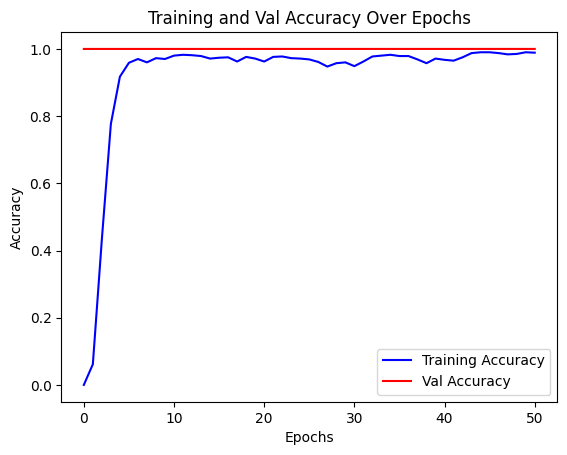

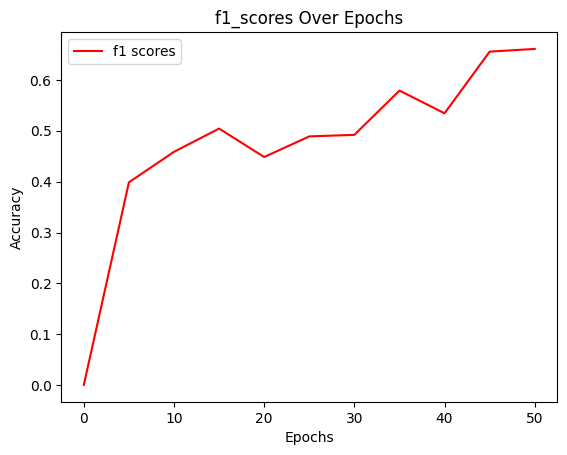

Epoch 50: train accuracy: 0.9887, Loss: 0.0397, Best Thresholds: 0.6000000238418579
Epoch 51: train accuracy: 0.9850, Loss: 0.0719, Best Thresholds: 0.6000000238418579
Epoch 52: train accuracy: 0.9812, Loss: 0.0984, Best Thresholds: 0.6000000238418579
Epoch 53: train accuracy: 0.9787, Loss: 0.0880, Best Thresholds: 0.6000000238418579
Epoch 54: train accuracy: 0.9812, Loss: 0.0470, Best Thresholds: 0.6000000238418579
tensor([[0.3851, 0.3617, 0.3840,  ..., 0.3324, 0.3491, 0.3535],
        [0.3592, 0.4429, 0.3009,  ..., 0.3427, 0.3488, 0.3387],
        [0.2954, 0.2871, 0.4098,  ..., 0.3259, 0.3009, 0.3263],
        ...,
        [0.4569, 0.2809, 0.3197,  ..., 0.3112, 0.3218, 0.3328],
        [0.3501, 0.3477, 0.3486,  ..., 0.3048, 0.3093, 0.3246],
        [0.3924, 0.4441, 0.3258,  ..., 0.3484, 0.3510, 0.3534]], device='cuda:0')
precision:  0.00017140069394372404 recall:  0.9853801131248474
tensor([[0.3851, 0.3617, 0.3840,  ..., 0.3324, 0.3491, 0.3535],
        [0.3592, 0.4429, 0.3009,  ...,

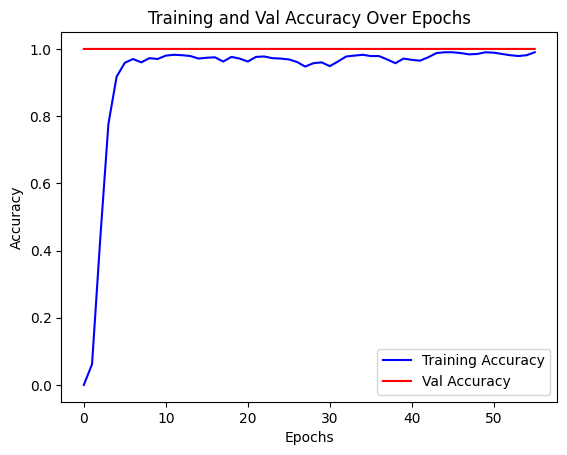

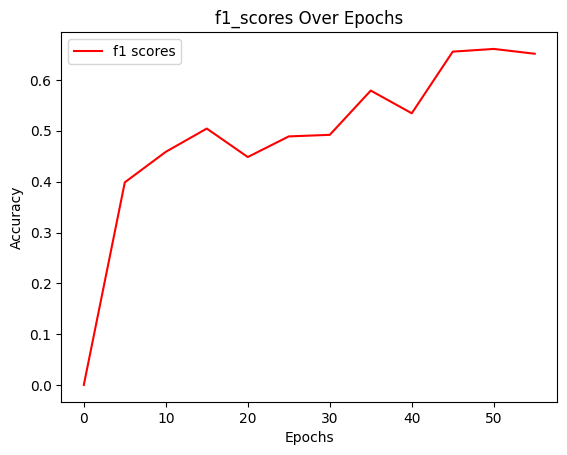

Epoch 55: train accuracy: 0.9900, Loss: 0.0528, Best Thresholds: 0.6000000238418579
Epoch 56: train accuracy: 0.9912, Loss: 0.0325, Best Thresholds: 0.6000000238418579
Epoch 57: train accuracy: 0.9925, Loss: 0.0395, Best Thresholds: 0.6000000238418579
Epoch 58: train accuracy: 0.9937, Loss: 0.0454, Best Thresholds: 0.6000000238418579
Epoch 59: train accuracy: 0.9962, Loss: 0.0241, Best Thresholds: 0.6000000238418579
tensor([[0.3155, 0.3358, 0.3963,  ..., 0.3326, 0.3355, 0.3469],
        [0.3560, 0.3307, 0.3993,  ..., 0.3187, 0.3345, 0.3326],
        [0.2086, 0.3117, 0.7570,  ..., 0.3183, 0.3354, 0.3043],
        ...,
        [0.2791, 0.3551, 0.3187,  ..., 0.3287, 0.3164, 0.3373],
        [0.3937, 0.3741, 0.3492,  ..., 0.3278, 0.3362, 0.3482],
        [0.3316, 0.3576, 0.3532,  ..., 0.3257, 0.3326, 0.3201]], device='cuda:0')
precision:  0.00017190931248478591 recall:  0.988304078578949
tensor([[0.3155, 0.3358, 0.3963,  ..., 0.3326, 0.3355, 0.3469],
        [0.3560, 0.3307, 0.3993,  ..., 

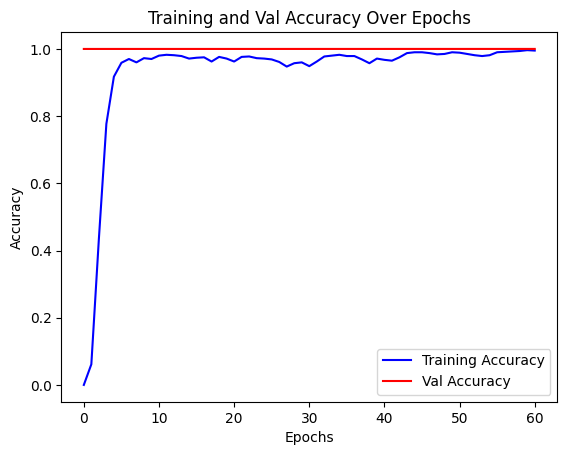

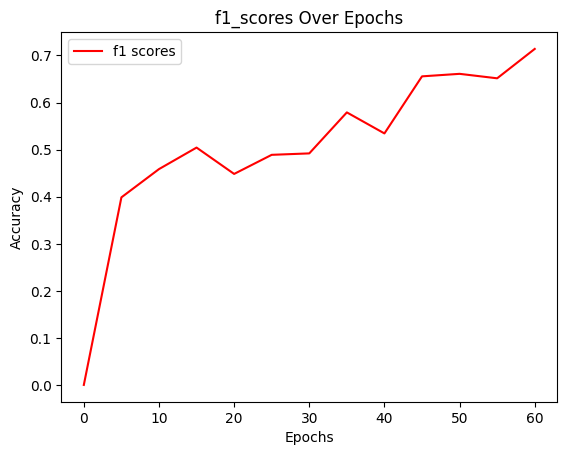

Epoch 60: train accuracy: 0.9950, Loss: 0.0301, Best Thresholds: 0.6000000238418579
Epoch 61: train accuracy: 0.9862, Loss: 0.0904, Best Thresholds: 0.6000000238418579
Epoch 62: train accuracy: 0.9787, Loss: 0.0991, Best Thresholds: 0.6000000238418579
Epoch 63: train accuracy: 0.9862, Loss: 0.0815, Best Thresholds: 0.6000000238418579
Epoch 64: train accuracy: 0.9887, Loss: 0.0424, Best Thresholds: 0.6000000238418579
tensor([[0.3208, 0.3897, 0.5220,  ..., 0.3670, 0.4000, 0.3772],
        [0.3947, 0.3727, 0.4032,  ..., 0.3513, 0.3564, 0.3509],
        [0.3881, 0.4614, 0.3829,  ..., 0.3961, 0.4062, 0.3870],
        ...,
        [0.3924, 0.3559, 0.4602,  ..., 0.3978, 0.4120, 0.3934],
        [0.3868, 0.4470, 0.3595,  ..., 0.3781, 0.3843, 0.3878],
        [0.4506, 0.3627, 0.4326,  ..., 0.3777, 0.3819, 0.3962]], device='cuda:0')
precision:  0.0001729262585286051 recall:  0.9941520690917969
tensor([[0.3208, 0.3897, 0.5220,  ..., 0.3670, 0.4000, 0.3772],
        [0.3947, 0.3727, 0.4032,  ..., 

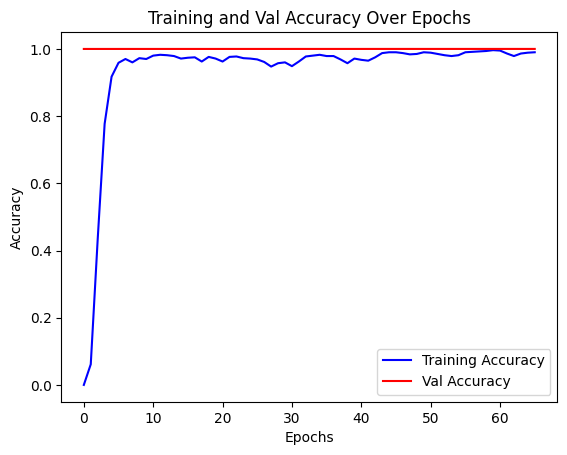

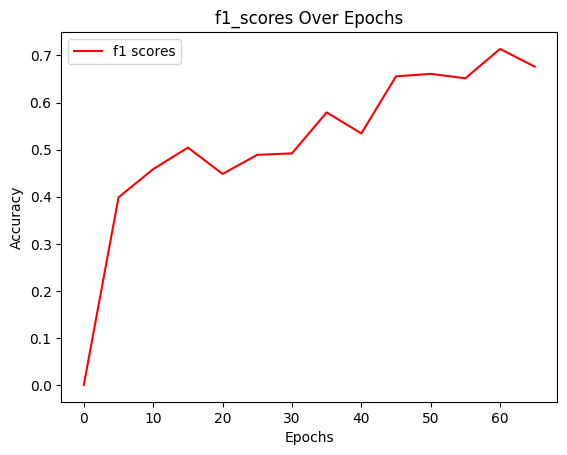

Epoch 65: train accuracy: 0.9900, Loss: 0.0556, Best Thresholds: 0.6000000238418579
Epoch 66: train accuracy: 0.9812, Loss: 0.0543, Best Thresholds: 0.6000000238418579
Epoch 67: train accuracy: 0.9875, Loss: 0.0473, Best Thresholds: 0.6000000238418579
Epoch 68: train accuracy: 0.9825, Loss: 0.0867, Best Thresholds: 0.6000000238418579
Epoch 69: train accuracy: 0.9762, Loss: 0.1287, Best Thresholds: 0.6000000238418579
tensor([[0.4525, 0.4377, 0.2989,  ..., 0.3755, 0.3823, 0.3776],
        [0.3684, 0.3809, 0.3510,  ..., 0.3946, 0.4216, 0.3821],
        [0.4694, 0.3475, 0.3928,  ..., 0.3953, 0.3874, 0.3850],
        ...,
        [0.3929, 0.4695, 0.3486,  ..., 0.4057, 0.4133, 0.4097],
        [0.3553, 0.3884, 0.3225,  ..., 0.4001, 0.3943, 0.4090],
        [0.4707, 0.3673, 0.4385,  ..., 0.3742, 0.3873, 0.3820]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.4525, 0.4377, 0.2989,  ..., 0.3755, 0.3823, 0.3776],
        [0.3684, 0.3809, 0.3510,  ...,

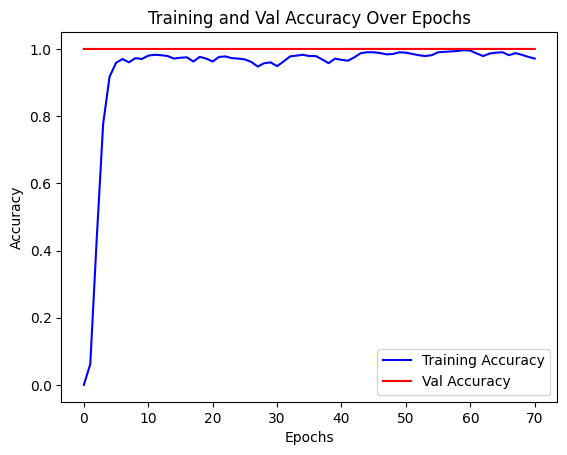

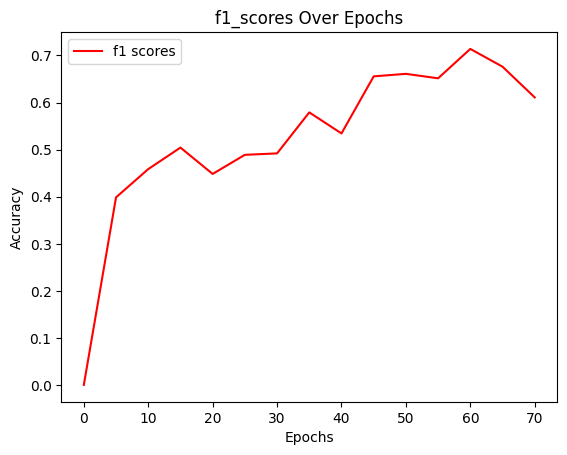

Epoch 70: train accuracy: 0.9712, Loss: 0.1431, Best Thresholds: 0.6000000238418579
Epoch 71: train accuracy: 0.9687, Loss: 0.1870, Best Thresholds: 0.6000000238418579
Epoch 72: train accuracy: 0.9749, Loss: 0.1262, Best Thresholds: 0.6000000238418579
Epoch 73: train accuracy: 0.9699, Loss: 0.1212, Best Thresholds: 0.6000000238418579
Epoch 74: train accuracy: 0.9699, Loss: 0.2044, Best Thresholds: 0.6000000238418579
tensor([[0.2086, 0.2806, 0.4419,  ..., 0.3103, 0.3292, 0.3184],
        [0.3918, 0.3593, 0.4255,  ..., 0.3214, 0.3289, 0.3188],
        [0.3927, 0.4692, 0.4695,  ..., 0.3077, 0.3159, 0.3209],
        ...,
        [0.3112, 0.7596, 0.4019,  ..., 0.3307, 0.3311, 0.3270],
        [0.3016, 0.4840, 0.3981,  ..., 0.2864, 0.3103, 0.2989],
        [0.3177, 0.3723, 0.3395,  ..., 0.3322, 0.3459, 0.3388]], device='cuda:0')
precision:  0.00016784104809630662 recall:  0.9649122953414917
tensor([[0.2086, 0.2806, 0.4419,  ..., 0.3103, 0.3292, 0.3184],
        [0.3918, 0.3593, 0.4255,  ...,

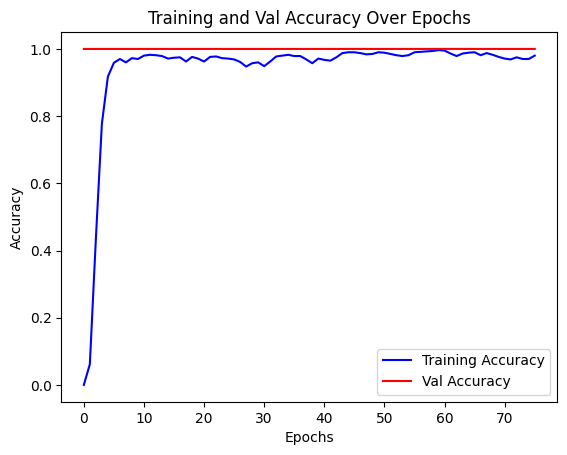

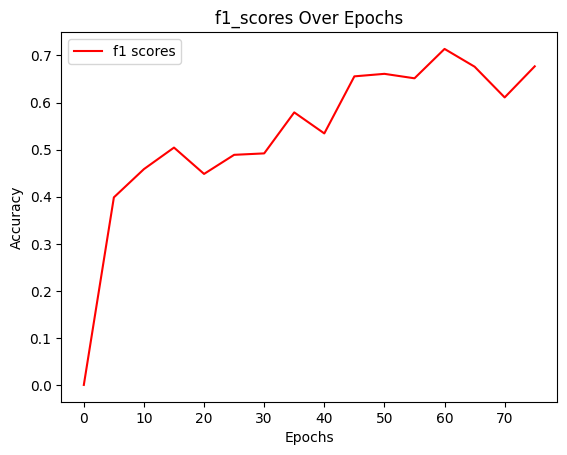

Epoch 75: train accuracy: 0.9799, Loss: 0.0719, Best Thresholds: 0.6000000238418579
Epoch 76: train accuracy: 0.9699, Loss: 0.1495, Best Thresholds: 0.6000000238418579
Epoch 77: train accuracy: 0.9749, Loss: 0.1544, Best Thresholds: 0.6000000238418579
Epoch 78: train accuracy: 0.9762, Loss: 0.0928, Best Thresholds: 0.6000000238418579
Epoch 79: train accuracy: 0.9812, Loss: 0.1158, Best Thresholds: 0.6000000238418579
tensor([[0.3560, 0.3573, 0.4450,  ..., 0.3494, 0.3531, 0.3593],
        [0.3452, 0.3234, 0.2864,  ..., 0.3216, 0.3244, 0.3292],
        [0.4436, 0.3030, 0.4134,  ..., 0.3440, 0.3602, 0.3561],
        ...,
        [0.4515, 0.3151, 0.3660,  ..., 0.3418, 0.3508, 0.3604],
        [0.5380, 0.4567, 0.3055,  ..., 0.3616, 0.3666, 0.3641],
        [0.2642, 0.3753, 0.3972,  ..., 0.3311, 0.3474, 0.3295]], device='cuda:0')
precision:  0.00017140069394372404 recall:  0.9853801131248474
tensor([[0.3560, 0.3573, 0.4450,  ..., 0.3494, 0.3531, 0.3593],
        [0.3452, 0.3234, 0.2864,  ...,

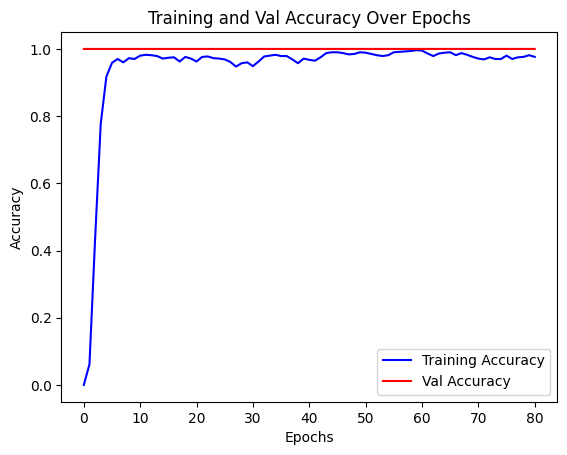

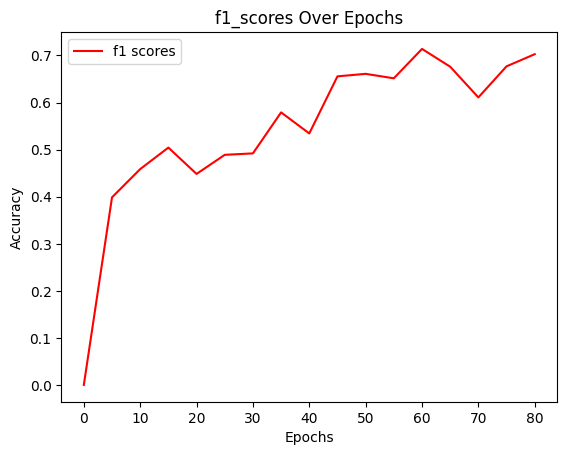

Epoch 80: train accuracy: 0.9762, Loss: 0.1420, Best Thresholds: 0.6000000238418579
Epoch 81: train accuracy: 0.9737, Loss: 0.1615, Best Thresholds: 0.6000000238418579
Epoch 82: train accuracy: 0.9825, Loss: 0.1029, Best Thresholds: 0.6000000238418579
Epoch 83: train accuracy: 0.9812, Loss: 0.0712, Best Thresholds: 0.6000000238418579
Epoch 84: train accuracy: 0.9875, Loss: 0.0809, Best Thresholds: 0.6000000238418579
tensor([[0.4129, 0.4141, 0.7954,  ..., 0.3938, 0.4056, 0.3762],
        [0.5374, 0.4445, 0.6768,  ..., 0.3710, 0.3830, 0.3679],
        [0.4105, 0.3048, 0.3426,  ..., 0.3998, 0.4173, 0.3937],
        ...,
        [0.2982, 0.3784, 0.3550,  ..., 0.3990, 0.3914, 0.4009],
        [0.3211, 0.4183, 0.4889,  ..., 0.3730, 0.3793, 0.3620],
        [0.4232, 0.3296, 0.4198,  ..., 0.3929, 0.4032, 0.3925]], device='cuda:0')
precision:  0.00017343477520626038 recall:  0.9970760345458984
tensor([[0.4129, 0.4141, 0.7954,  ..., 0.3938, 0.4056, 0.3762],
        [0.5374, 0.4445, 0.6768,  ...,

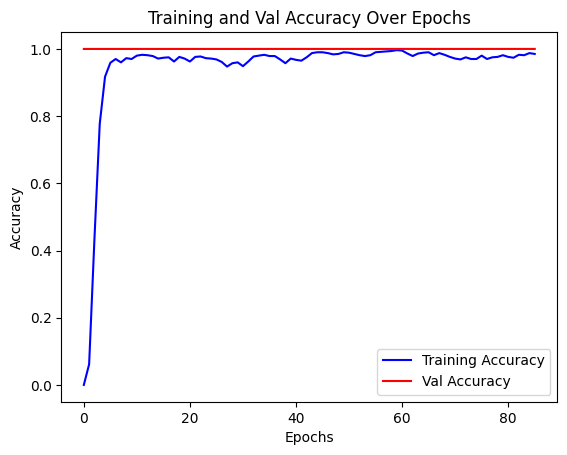

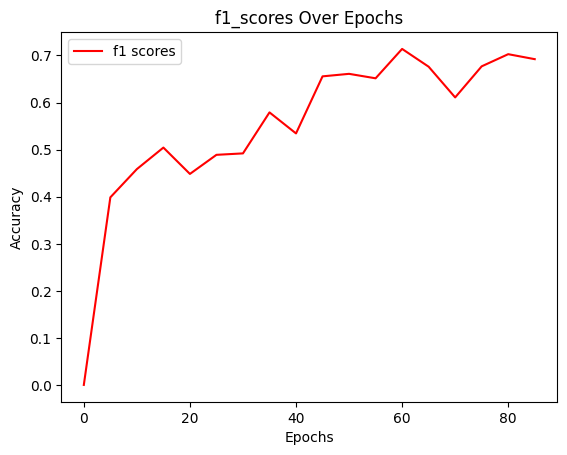

Epoch 85: train accuracy: 0.9850, Loss: 0.0556, Best Thresholds: 0.6000000238418579
Epoch 86: train accuracy: 0.9887, Loss: 0.1022, Best Thresholds: 0.6000000238418579
Epoch 87: train accuracy: 0.9812, Loss: 0.0976, Best Thresholds: 0.6000000238418579
Epoch 88: train accuracy: 0.9875, Loss: 0.0520, Best Thresholds: 0.6000000238418579
Epoch 89: train accuracy: 0.9887, Loss: 0.0503, Best Thresholds: 0.6000000238418579
tensor([[0.3338, 0.3732, 0.3849,  ..., 0.3149, 0.3341, 0.3301],
        [0.2873, 0.2965, 0.2533,  ..., 0.2916, 0.3049, 0.2959],
        [0.4316, 0.3927, 0.2684,  ..., 0.3052, 0.3211, 0.3020],
        ...,
        [0.3704, 0.4823, 0.3806,  ..., 0.3036, 0.3107, 0.3112],
        [0.3593, 0.4621, 0.2243,  ..., 0.2969, 0.3143, 0.3064],
        [0.3694, 0.2448, 0.3566,  ..., 0.3061, 0.3140, 0.3087]], device='cuda:0')
precision:  0.00016936678730417043 recall:  0.9736841917037964
tensor([[0.3338, 0.3732, 0.3849,  ..., 0.3149, 0.3341, 0.3301],
        [0.2873, 0.2965, 0.2533,  ...,

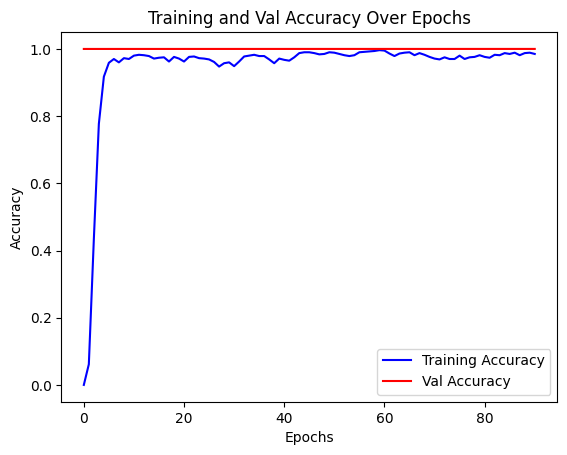

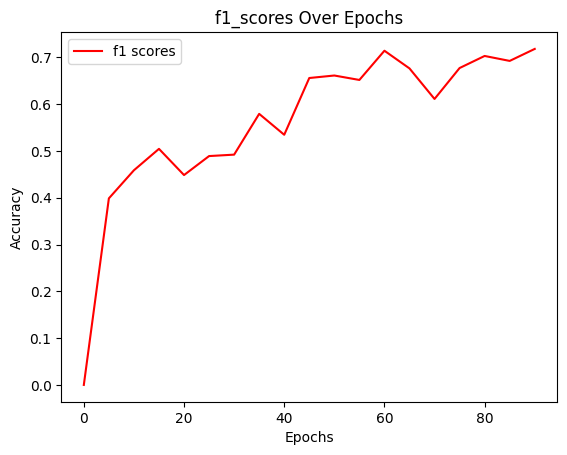

Epoch 90: train accuracy: 0.9850, Loss: 0.0501, Best Thresholds: 0.6000000238418579
Epoch 91: train accuracy: 0.9937, Loss: 0.0149, Best Thresholds: 0.6000000238418579
Epoch 92: train accuracy: 0.9875, Loss: 0.0535, Best Thresholds: 0.6000000238418579
Epoch 93: train accuracy: 0.9962, Loss: 0.0092, Best Thresholds: 0.6000000238418579
Epoch 94: train accuracy: 0.9950, Loss: 0.0122, Best Thresholds: 0.6000000238418579
tensor([[0.2771, 0.3402, 0.1398,  ..., 0.3546, 0.3668, 0.3557],
        [0.3463, 0.4952, 0.3118,  ..., 0.3127, 0.3288, 0.3188],
        [0.4382, 0.4143, 0.2622,  ..., 0.3785, 0.3709, 0.3718],
        ...,
        [0.3998, 0.3293, 0.1902,  ..., 0.2987, 0.2992, 0.3054],
        [0.3386, 0.4169, 0.4321,  ..., 0.3252, 0.3350, 0.3375],
        [0.3308, 0.3228, 0.4091,  ..., 0.3357, 0.3420, 0.3396]], device='cuda:0')
precision:  0.00017190922517329454 recall:  0.988304078578949
tensor([[0.2771, 0.3402, 0.1398,  ..., 0.3546, 0.3668, 0.3557],
        [0.3463, 0.4952, 0.3118,  ..., 

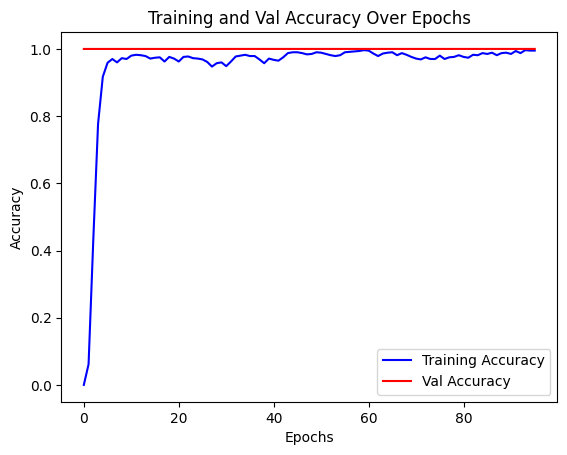

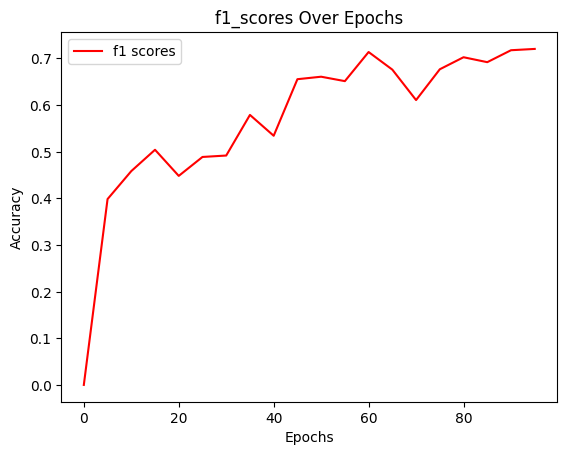

Epoch 95: train accuracy: 0.9950, Loss: 0.0257, Best Thresholds: 0.6000000238418579
Epoch 96: train accuracy: 0.9962, Loss: 0.0315, Best Thresholds: 0.6000000238418579
Epoch 97: train accuracy: 0.9912, Loss: 0.0221, Best Thresholds: 0.6000000238418579
Epoch 98: train accuracy: 0.9975, Loss: 0.0097, Best Thresholds: 0.6000000238418579
Epoch 99: train accuracy: 0.9962, Loss: 0.0061, Best Thresholds: 0.6000000238418579
tensor([[0.3490, 0.3203, 0.3437,  ..., 0.3256, 0.3253, 0.3340],
        [0.3089, 0.2590, 0.3969,  ..., 0.3036, 0.3193, 0.3251],
        [0.2154, 0.8288, 0.3821,  ..., 0.2966, 0.3071, 0.3001],
        ...,
        [0.4357, 0.4284, 0.3774,  ..., 0.2918, 0.2948, 0.2800],
        [0.3687, 0.2458, 0.3841,  ..., 0.3179, 0.3285, 0.3332],
        [0.3689, 0.3860, 0.2780,  ..., 0.3325, 0.3314, 0.3403]], device='cuda:0')
precision:  0.00017190922517329454 recall:  0.988304078578949
tensor([[0.3490, 0.3203, 0.3437,  ..., 0.3256, 0.3253, 0.3340],
        [0.3089, 0.2590, 0.3969,  ..., 

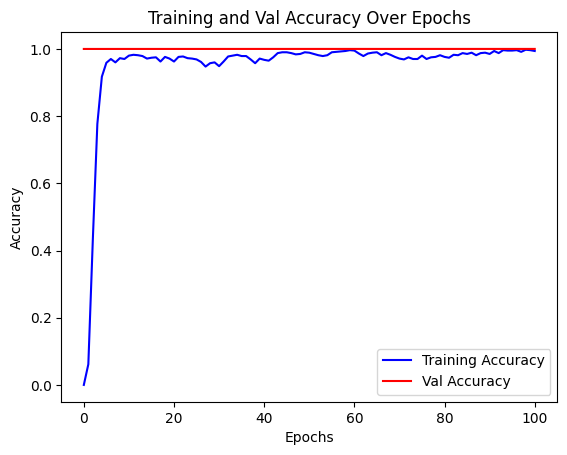

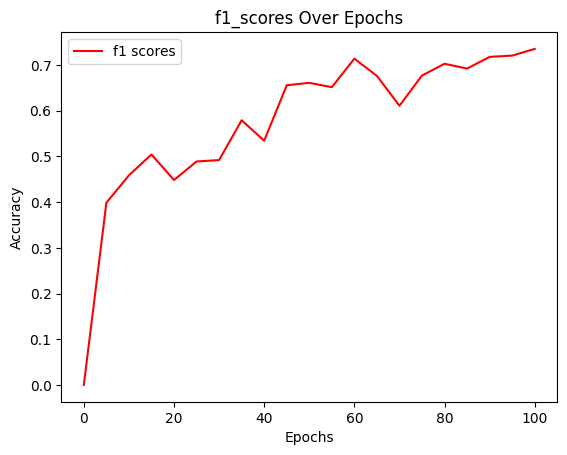

Epoch 100: train accuracy: 0.9937, Loss: 0.0167, Best Thresholds: 0.6000000238418579
Epoch 101: train accuracy: 0.9837, Loss: 0.0969, Best Thresholds: 0.6000000238418579
Epoch 102: train accuracy: 0.9825, Loss: 0.0916, Best Thresholds: 0.6000000238418579
Epoch 103: train accuracy: 0.9875, Loss: 0.0469, Best Thresholds: 0.6000000238418579
Epoch 104: train accuracy: 0.9825, Loss: 0.0790, Best Thresholds: 0.6000000238418579
tensor([[0.4167, 0.5117, 0.4194,  ..., 0.3716, 0.3821, 0.3881],
        [0.3786, 0.3456, 0.5101,  ..., 0.3600, 0.3735, 0.3774],
        [0.5062, 0.3206, 0.3118,  ..., 0.3539, 0.3750, 0.3750],
        ...,
        [0.4087, 0.4047, 0.4196,  ..., 0.3946, 0.3904, 0.3939],
        [0.3839, 0.4567, 0.3509,  ..., 0.3705, 0.3863, 0.3737],
        [0.3536, 0.3921, 0.4449,  ..., 0.3843, 0.3911, 0.3887]], device='cuda:0')
precision:  0.0001729262585286051 recall:  0.9941520690917969
tensor([[0.4167, 0.5117, 0.4194,  ..., 0.3716, 0.3821, 0.3881],
        [0.3786, 0.3456, 0.5101,  

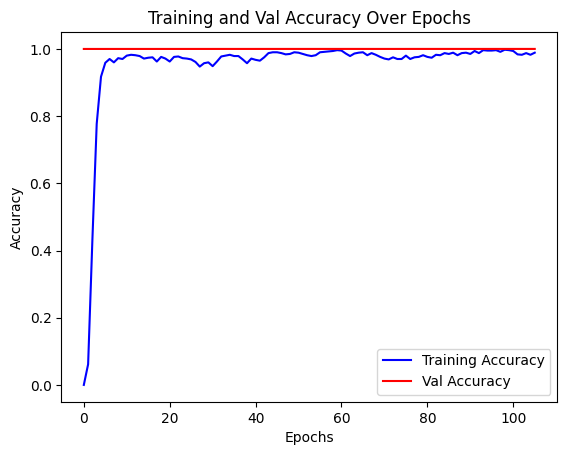

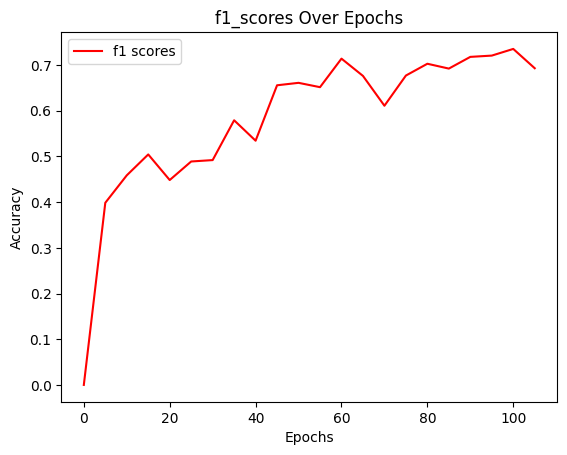

Epoch 105: train accuracy: 0.9887, Loss: 0.0577, Best Thresholds: 0.6000000238418579
Epoch 106: train accuracy: 0.9787, Loss: 0.1665, Best Thresholds: 0.6000000238418579
Epoch 107: train accuracy: 0.9674, Loss: 0.1590, Best Thresholds: 0.6000000238418579
Epoch 108: train accuracy: 0.9724, Loss: 0.1570, Best Thresholds: 0.6000000238418579
Epoch 109: train accuracy: 0.9712, Loss: 0.1698, Best Thresholds: 0.6000000238418579
tensor([[0.4475, 0.5170, 0.2450,  ..., 0.3709, 0.3786, 0.3737],
        [0.3988, 0.3044, 0.3843,  ..., 0.4010, 0.3922, 0.4031],
        [0.3951, 0.5183, 0.8129,  ..., 0.4003, 0.4105, 0.3881],
        ...,
        [0.3913, 0.4465, 0.3228,  ..., 0.4071, 0.4116, 0.4081],
        [0.3721, 0.4333, 0.2978,  ..., 0.3930, 0.4005, 0.3948],
        [0.4623, 0.3933, 0.4750,  ..., 0.3791, 0.3851, 0.3819]], device='cuda:0')
precision:  0.0001729262585286051 recall:  0.9941520690917969
tensor([[0.4475, 0.5170, 0.2450,  ..., 0.3709, 0.3786, 0.3737],
        [0.3988, 0.3044, 0.3843,  

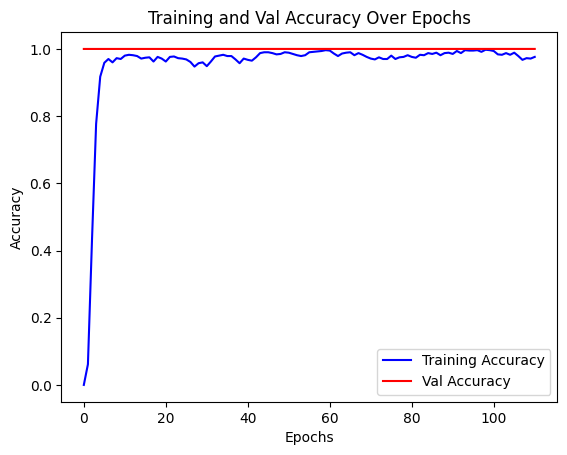

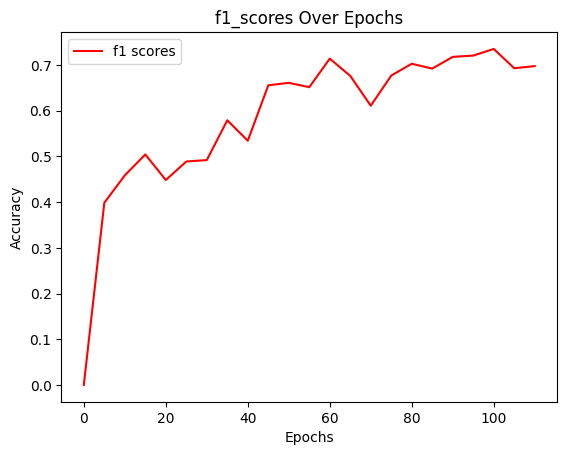

Epoch 110: train accuracy: 0.9762, Loss: 0.1500, Best Thresholds: 0.6000000238418579
Epoch 111: train accuracy: 0.9837, Loss: 0.0973, Best Thresholds: 0.6000000238418579
Epoch 112: train accuracy: 0.9687, Loss: 0.1528, Best Thresholds: 0.6000000238418579
Epoch 113: train accuracy: 0.9749, Loss: 0.1798, Best Thresholds: 0.6000000238418579
Epoch 114: train accuracy: 0.9825, Loss: 0.0952, Best Thresholds: 0.6000000238418579
tensor([[0.7140, 0.4724, 0.4117,  ..., 0.3904, 0.3920, 0.3879],
        [0.3797, 0.4234, 0.3980,  ..., 0.3920, 0.3979, 0.3956],
        [0.4436, 0.3583, 0.4234,  ..., 0.3879, 0.3841, 0.3876],
        ...,
        [0.4787, 0.4494, 0.4991,  ..., 0.4030, 0.4083, 0.4084],
        [0.3774, 0.4061, 0.3663,  ..., 0.3870, 0.3915, 0.3911],
        [0.4543, 0.3827, 0.2685,  ..., 0.3870, 0.3904, 0.3912]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.7140, 0.4724, 0.4117,  ..., 0.3904, 0.3920, 0.3879],
        [0.3797, 0.4234, 0.3980, 

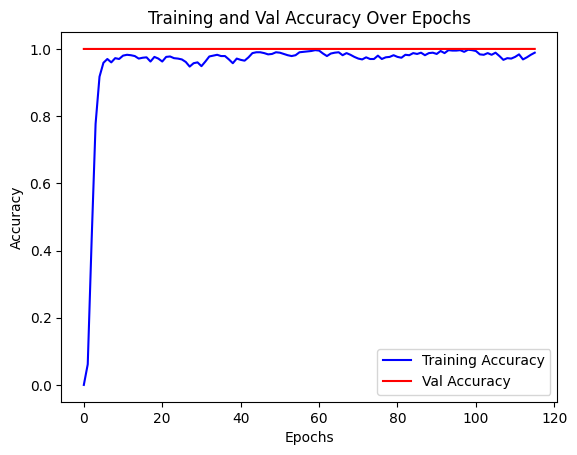

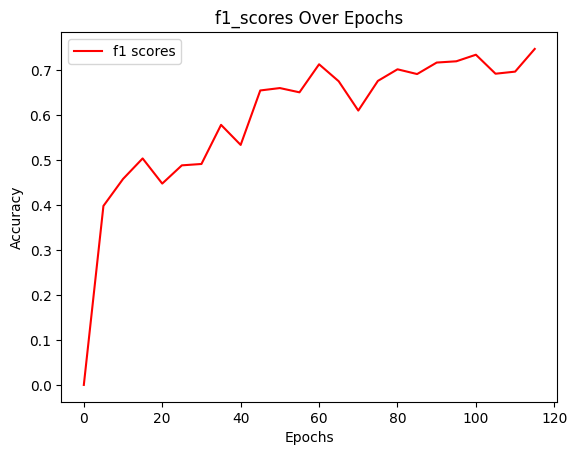

Epoch 115: train accuracy: 0.9887, Loss: 0.0296, Best Thresholds: 0.6000000238418579
Epoch 116: train accuracy: 0.9887, Loss: 0.0457, Best Thresholds: 0.6000000238418579
Epoch 117: train accuracy: 0.9837, Loss: 0.0713, Best Thresholds: 0.6000000238418579
Epoch 118: train accuracy: 0.9875, Loss: 0.0990, Best Thresholds: 0.6000000238418579
Epoch 119: train accuracy: 0.9837, Loss: 0.0622, Best Thresholds: 0.6000000238418579
tensor([[0.3400, 0.4104, 0.3090,  ..., 0.3179, 0.3242, 0.3195],
        [0.3598, 0.4952, 0.3596,  ..., 0.3450, 0.3541, 0.3444],
        [0.3710, 0.3392, 0.4077,  ..., 0.3301, 0.3371, 0.3326],
        ...,
        [0.3384, 0.3828, 0.3534,  ..., 0.3282, 0.3340, 0.3260],
        [0.3130, 0.2696, 0.3302,  ..., 0.3167, 0.3286, 0.3223],
        [0.4068, 0.4207, 0.2567,  ..., 0.3579, 0.3584, 0.3577]], device='cuda:0')
precision:  0.00017089226457756013 recall:  0.9824561476707458
tensor([[0.3400, 0.4104, 0.3090,  ..., 0.3179, 0.3242, 0.3195],
        [0.3598, 0.4952, 0.3596, 

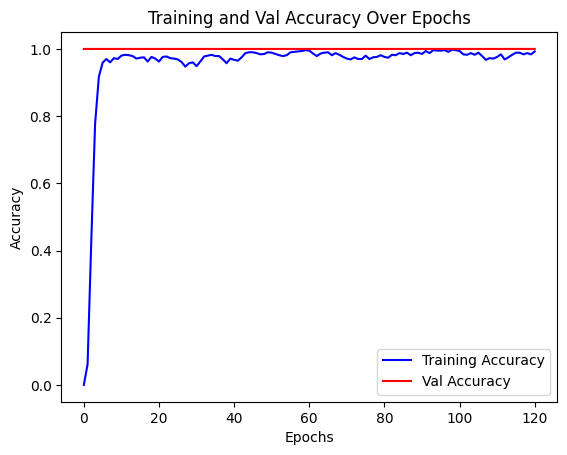

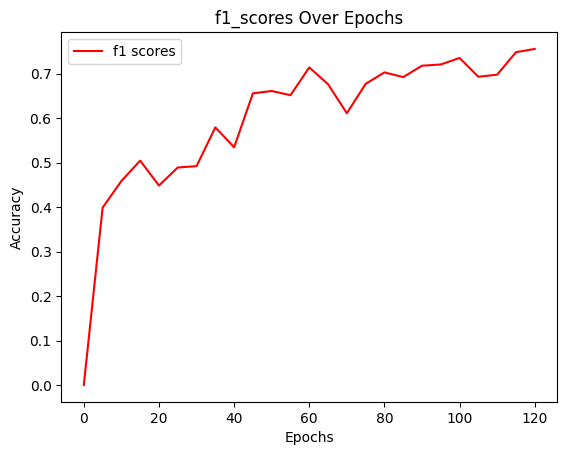

Epoch 120: train accuracy: 0.9925, Loss: 0.0499, Best Thresholds: 0.6000000238418579
Epoch 121: train accuracy: 0.9925, Loss: 0.0295, Best Thresholds: 0.6000000238418579
Epoch 122: train accuracy: 0.9900, Loss: 0.0311, Best Thresholds: 0.6000000238418579
Epoch 123: train accuracy: 0.9925, Loss: 0.0624, Best Thresholds: 0.6000000238418579
Epoch 124: train accuracy: 0.9937, Loss: 0.0197, Best Thresholds: 0.6000000238418579
tensor([[0.4025, 0.3596, 0.1748,  ..., 0.3200, 0.3173, 0.3164],
        [0.4182, 0.4203, 0.4436,  ..., 0.2967, 0.3078, 0.2977],
        [0.3642, 0.2701, 0.2861,  ..., 0.3152, 0.3272, 0.3161],
        ...,
        [0.4028, 0.2723, 0.2400,  ..., 0.3201, 0.3288, 0.3243],
        [0.2921, 0.3780, 0.4856,  ..., 0.3209, 0.3314, 0.3263],
        [0.4722, 0.3348, 0.3084,  ..., 0.3194, 0.3233, 0.3193]], device='cuda:0')
precision:  0.00017292652046307921 recall:  0.9941520690917969
tensor([[0.4025, 0.3596, 0.1748,  ..., 0.3200, 0.3173, 0.3164],
        [0.4182, 0.4203, 0.4436, 

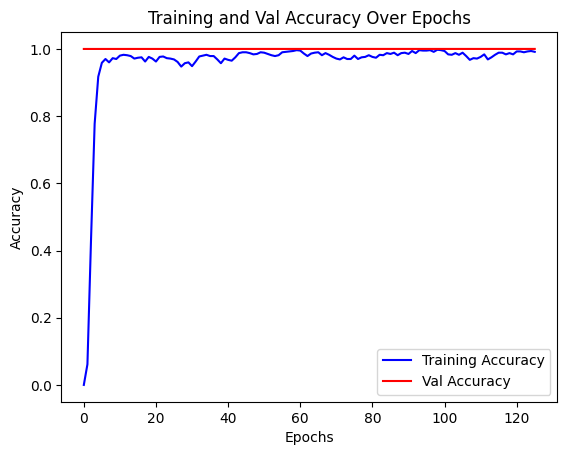

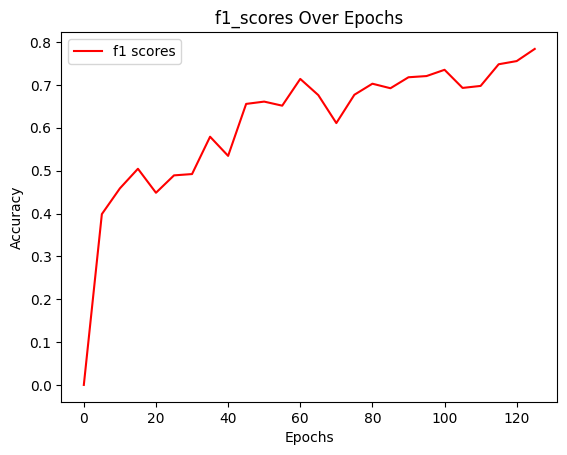

Epoch 125: train accuracy: 0.9912, Loss: 0.0613, Best Thresholds: 0.6000000238418579
Epoch 126: train accuracy: 0.9962, Loss: 0.0347, Best Thresholds: 0.6000000238418579
Epoch 127: train accuracy: 0.9962, Loss: 0.0103, Best Thresholds: 0.6000000238418579
Epoch 128: train accuracy: 0.9987, Loss: 0.0148, Best Thresholds: 0.6000000238418579
Epoch 129: train accuracy: 0.9975, Loss: 0.0144, Best Thresholds: 0.6000000238418579
tensor([[0.3513, 0.4704, 0.2340,  ..., 0.3360, 0.3354, 0.3377],
        [0.3735, 0.3984, 0.3740,  ..., 0.3419, 0.3536, 0.3450],
        [0.5628, 0.3771, 0.3763,  ..., 0.3050, 0.3263, 0.3061],
        ...,
        [0.2754, 0.5204, 0.3254,  ..., 0.3105, 0.3132, 0.3250],
        [0.3433, 0.3778, 0.3260,  ..., 0.3374, 0.3472, 0.3422],
        [0.3311, 0.3113, 0.3393,  ..., 0.3255, 0.3357, 0.3323]], device='cuda:0')
precision:  0.0001693666126811877 recall:  0.9736841917037964
tensor([[0.3513, 0.4704, 0.2340,  ..., 0.3360, 0.3354, 0.3377],
        [0.3735, 0.3984, 0.3740,  

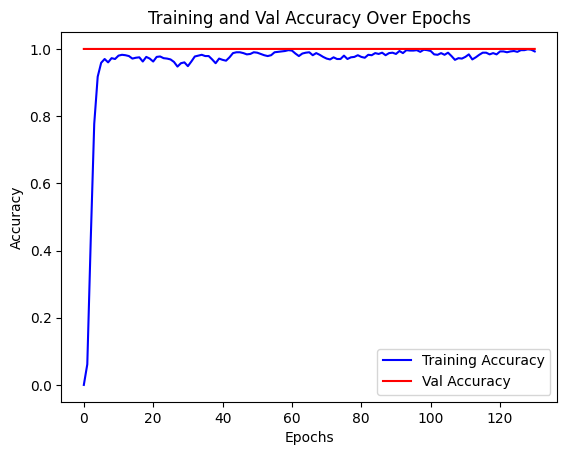

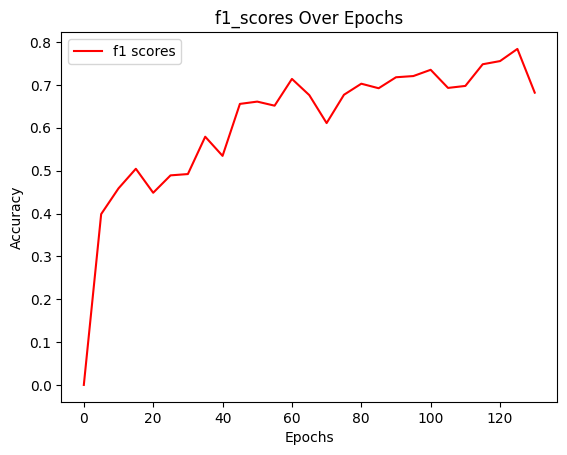

Epoch 130: train accuracy: 0.9925, Loss: 0.0595, Best Thresholds: 0.6000000238418579
Epoch 131: train accuracy: 0.9875, Loss: 0.0627, Best Thresholds: 0.6000000238418579
Epoch 132: train accuracy: 0.9925, Loss: 0.0145, Best Thresholds: 0.6000000238418579
Epoch 133: train accuracy: 0.9900, Loss: 0.0593, Best Thresholds: 0.6000000238418579
Epoch 134: train accuracy: 0.9925, Loss: 0.0395, Best Thresholds: 0.6000000238418579
tensor([[0.4490, 0.3716, 0.3915,  ..., 0.3455, 0.3455, 0.3573],
        [0.2865, 0.3155, 0.3916,  ..., 0.3542, 0.3609, 0.3568],
        [0.2682, 0.4661, 0.3840,  ..., 0.3309, 0.3275, 0.3235],
        ...,
        [0.4902, 0.3683, 0.3878,  ..., 0.3504, 0.3466, 0.3526],
        [0.3638, 0.2603, 0.3346,  ..., 0.3743, 0.3774, 0.3708],
        [0.3093, 0.4222, 0.3726,  ..., 0.3192, 0.3253, 0.3229]], device='cuda:0')
precision:  0.00016987539129331708 recall:  0.9766082167625427
tensor([[0.4490, 0.3716, 0.3915,  ..., 0.3455, 0.3455, 0.3573],
        [0.2865, 0.3155, 0.3916, 

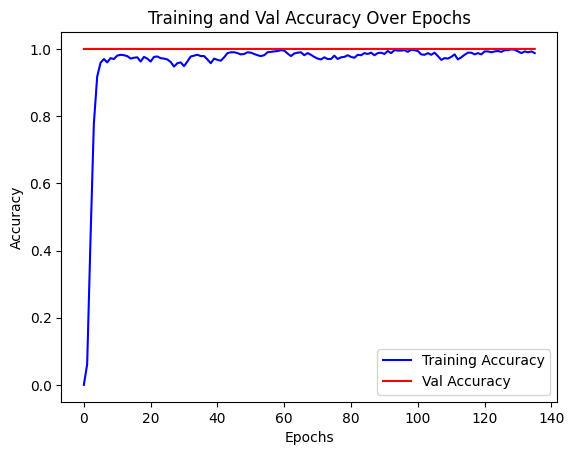

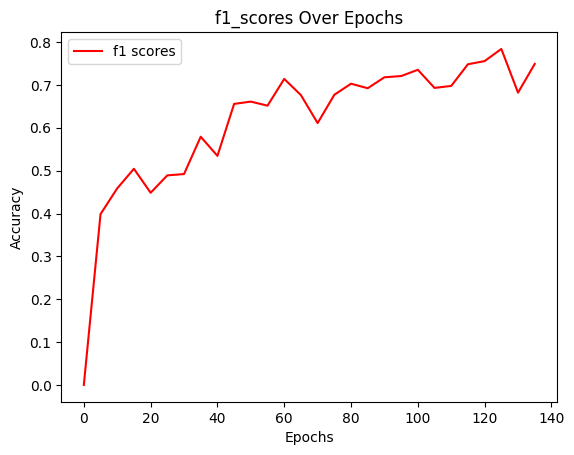

Epoch 135: train accuracy: 0.9875, Loss: 0.0456, Best Thresholds: 0.6000000238418579
Epoch 136: train accuracy: 0.9912, Loss: 0.0427, Best Thresholds: 0.6000000238418579
Epoch 137: train accuracy: 0.9875, Loss: 0.0662, Best Thresholds: 0.6000000238418579
Epoch 138: train accuracy: 0.9900, Loss: 0.0293, Best Thresholds: 0.6000000238418579
Epoch 139: train accuracy: 0.9850, Loss: 0.0929, Best Thresholds: 0.6000000238418579
tensor([[0.3205, 0.3452, 0.3374,  ..., 0.2924, 0.3026, 0.2942],
        [0.3600, 0.3958, 0.3447,  ..., 0.3242, 0.3221, 0.3332],
        [0.3699, 0.3581, 0.3706,  ..., 0.3264, 0.3261, 0.3363],
        ...,
        [0.3733, 0.3728, 0.3131,  ..., 0.3175, 0.3184, 0.3182],
        [0.3940, 0.3074, 0.3235,  ..., 0.3184, 0.3288, 0.3184],
        [0.3066, 0.3288, 0.3525,  ..., 0.3164, 0.3152, 0.3177]], device='cuda:0')
precision:  0.00017089226457756013 recall:  0.9824561476707458
tensor([[0.3205, 0.3452, 0.3374,  ..., 0.2924, 0.3026, 0.2942],
        [0.3600, 0.3958, 0.3447, 

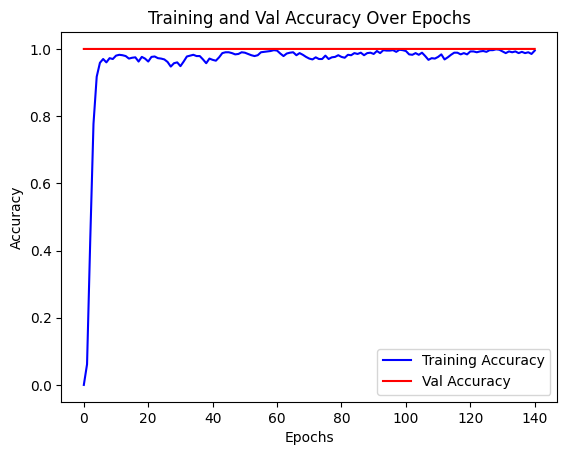

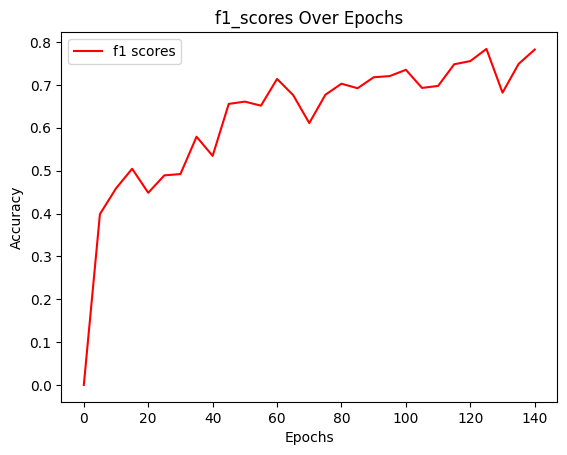

Epoch 140: train accuracy: 0.9950, Loss: 0.0218, Best Thresholds: 0.6000000238418579
Epoch 141: train accuracy: 0.9950, Loss: 0.0324, Best Thresholds: 0.6000000238418579
Epoch 142: train accuracy: 0.9925, Loss: 0.0399, Best Thresholds: 0.6000000238418579
Epoch 143: train accuracy: 0.9975, Loss: 0.0215, Best Thresholds: 0.6000000238418579
Epoch 144: train accuracy: 0.9887, Loss: 0.0375, Best Thresholds: 0.6000000238418579
tensor([[0.2898, 0.2925, 0.4817,  ..., 0.3270, 0.3351, 0.3318],
        [0.3398, 0.3936, 0.9015,  ..., 0.3449, 0.3524, 0.3437],
        [0.3622, 0.4558, 0.3565,  ..., 0.3455, 0.3498, 0.3476],
        ...,
        [0.3361, 0.4112, 0.3114,  ..., 0.3417, 0.3428, 0.3446],
        [0.3226, 0.5363, 0.3108,  ..., 0.3532, 0.3600, 0.3581],
        [0.4316, 0.4122, 0.3790,  ..., 0.3400, 0.3472, 0.3530]], device='cuda:0')
precision:  0.0001729262585286051 recall:  0.9941520690917969
tensor([[0.2898, 0.2925, 0.4817,  ..., 0.3270, 0.3351, 0.3318],
        [0.3398, 0.3936, 0.9015,  

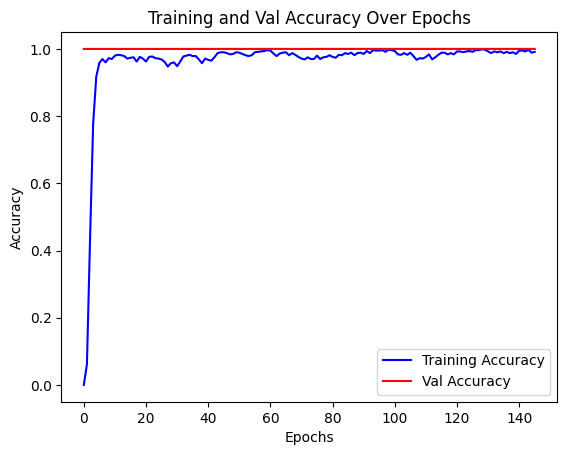

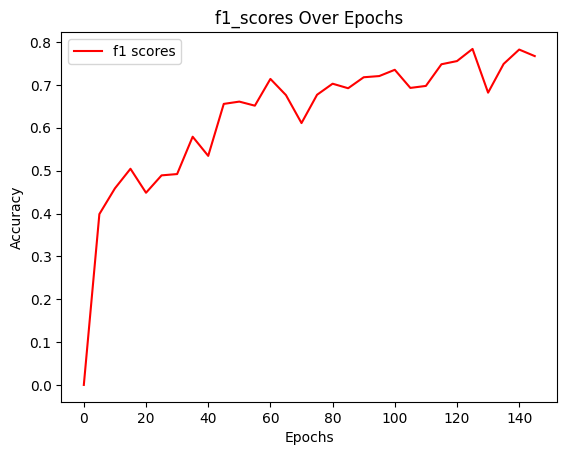

Epoch 145: train accuracy: 0.9912, Loss: 0.0297, Best Thresholds: 0.6000000238418579
Epoch 146: train accuracy: 0.9900, Loss: 0.0365, Best Thresholds: 0.6000000238418579
Epoch 147: train accuracy: 0.9900, Loss: 0.0356, Best Thresholds: 0.6000000238418579
Epoch 148: train accuracy: 0.9937, Loss: 0.0653, Best Thresholds: 0.6000000238418579
Epoch 149: train accuracy: 0.9925, Loss: 0.0387, Best Thresholds: 0.6000000238418579
tensor([[0.4087, 0.4843, 0.3377,  ..., 0.2940, 0.3097, 0.3026],
        [0.3462, 0.4195, 0.3711,  ..., 0.3302, 0.3317, 0.3323],
        [0.4273, 0.2446, 0.3282,  ..., 0.3118, 0.3061, 0.3146],
        ...,
        [0.3005, 0.3111, 0.3842,  ..., 0.3451, 0.3492, 0.3445],
        [0.5111, 0.3390, 0.4691,  ..., 0.3181, 0.3231, 0.3258],
        [0.2663, 0.3668, 0.3726,  ..., 0.3394, 0.3438, 0.3375]], device='cuda:0')
precision:  0.00017241791647393256 recall:  0.9912280440330505
tensor([[0.4087, 0.4843, 0.3377,  ..., 0.2940, 0.3097, 0.3026],
        [0.3462, 0.4195, 0.3711, 

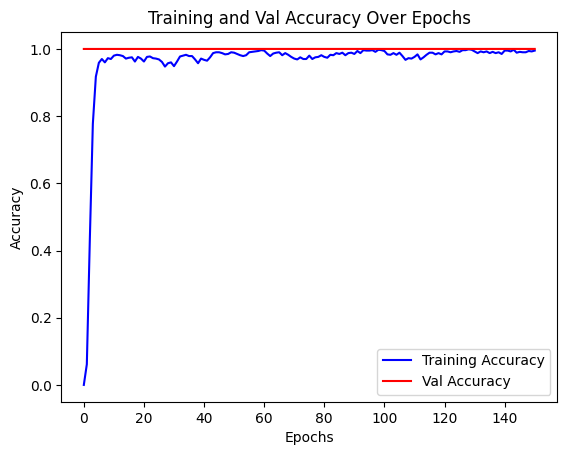

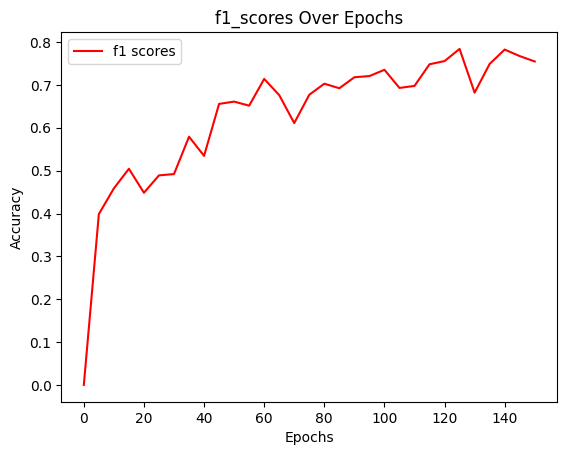

Epoch 150: train accuracy: 0.9950, Loss: 0.0564, Best Thresholds: 0.6000000238418579
Epoch 151: train accuracy: 0.9900, Loss: 0.0539, Best Thresholds: 0.6000000238418579
Epoch 152: train accuracy: 0.9950, Loss: 0.0309, Best Thresholds: 0.6000000238418579
Epoch 153: train accuracy: 0.9962, Loss: 0.0221, Best Thresholds: 0.6000000238418579
Epoch 154: train accuracy: 0.9900, Loss: 0.0604, Best Thresholds: 0.6000000238418579
tensor([[0.4327, 0.1812, 0.2094,  ..., 0.2815, 0.2920, 0.2904],
        [0.3036, 0.3008, 0.2832,  ..., 0.3011, 0.3139, 0.3054],
        [0.2850, 0.4058, 0.1530,  ..., 0.2843, 0.2885, 0.2854],
        ...,
        [0.3521, 0.3434, 0.3627,  ..., 0.2720, 0.2777, 0.2742],
        [0.3155, 0.2118, 0.3154,  ..., 0.2819, 0.2858, 0.2826],
        [0.2168, 0.4042, 0.3994,  ..., 0.2849, 0.2891, 0.2819]], device='cuda:0')
precision:  0.0001703869493212551 recall:  0.9795321822166443
tensor([[0.4327, 0.1812, 0.2094,  ..., 0.2815, 0.2920, 0.2904],
        [0.3036, 0.3008, 0.2832,  

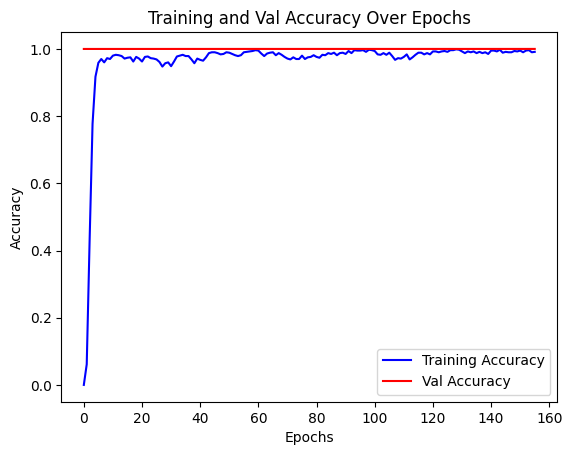

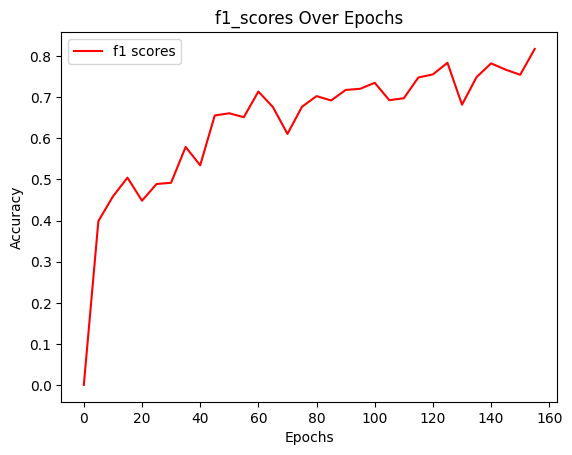

Epoch 155: train accuracy: 0.9912, Loss: 0.0355, Best Thresholds: 0.6000000238418579
Epoch 156: train accuracy: 0.9887, Loss: 0.0428, Best Thresholds: 0.6000000238418579
Epoch 157: train accuracy: 0.9900, Loss: 0.0473, Best Thresholds: 0.6000000238418579
Epoch 158: train accuracy: 0.9900, Loss: 0.0246, Best Thresholds: 0.6000000238418579
Epoch 159: train accuracy: 0.9887, Loss: 0.0651, Best Thresholds: 0.6000000238418579
tensor([[0.4080, 0.3380, 0.4224,  ..., 0.3617, 0.3573, 0.3617],
        [0.3603, 0.2867, 0.4167,  ..., 0.3498, 0.3574, 0.3524],
        [0.3692, 0.2600, 0.3079,  ..., 0.3515, 0.3595, 0.3552],
        ...,
        [0.3383, 0.5715, 0.4099,  ..., 0.3328, 0.3440, 0.3430],
        [0.4598, 0.3474, 0.4186,  ..., 0.3602, 0.3618, 0.3630],
        [0.4096, 0.3232, 0.3885,  ..., 0.3214, 0.3354, 0.3274]], device='cuda:0')
precision:  0.0001708923518890515 recall:  0.9824561476707458
tensor([[0.4080, 0.3380, 0.4224,  ..., 0.3617, 0.3573, 0.3617],
        [0.3603, 0.2867, 0.4167,  

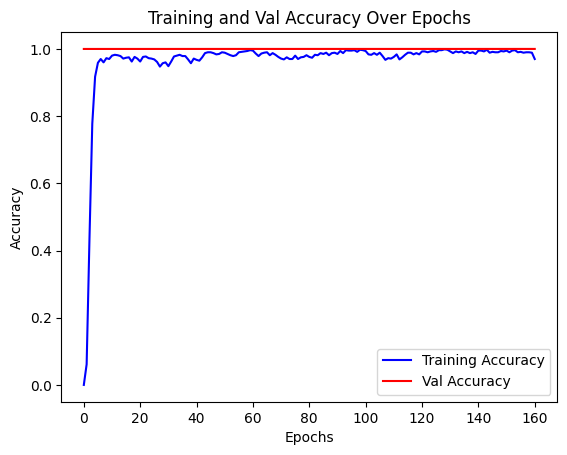

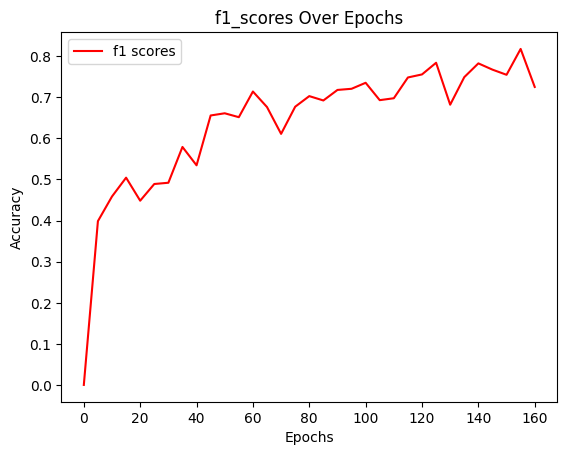

Epoch 160: train accuracy: 0.9699, Loss: 0.1403, Best Thresholds: 0.6000000238418579
Epoch 161: train accuracy: 0.9862, Loss: 0.1099, Best Thresholds: 0.6000000238418579
Epoch 162: train accuracy: 0.9887, Loss: 0.0558, Best Thresholds: 0.6000000238418579
Epoch 163: train accuracy: 0.9912, Loss: 0.0563, Best Thresholds: 0.6000000238418579
Epoch 164: train accuracy: 0.9837, Loss: 0.1106, Best Thresholds: 0.6000000238418579
tensor([[0.3553, 0.5664, 0.4290,  ..., 0.4136, 0.4184, 0.4185],
        [0.5836, 0.4511, 0.4521,  ..., 0.4009, 0.4116, 0.4045],
        [0.5508, 0.4107, 0.4449,  ..., 0.4356, 0.4396, 0.4382],
        ...,
        [0.5065, 0.5120, 0.4531,  ..., 0.4182, 0.4155, 0.4231],
        [0.4661, 0.4539, 0.4099,  ..., 0.4153, 0.4154, 0.4147],
        [0.3731, 0.4848, 0.3987,  ..., 0.4010, 0.4077, 0.4070]], device='cuda:0')
precision:  0.00017343477520626038 recall:  0.9970760345458984
tensor([[0.3553, 0.5664, 0.4290,  ..., 0.4136, 0.4184, 0.4185],
        [0.5836, 0.4511, 0.4521, 

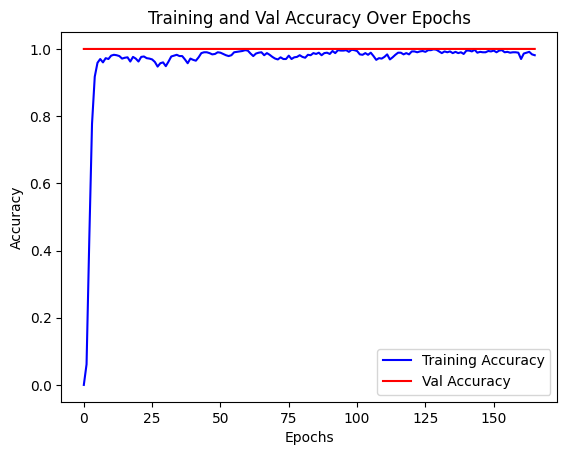

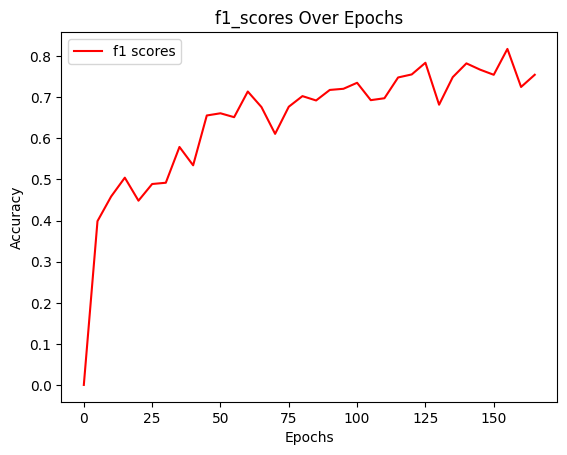

Epoch 165: train accuracy: 0.9812, Loss: 0.1183, Best Thresholds: 0.6000000238418579
Epoch 166: train accuracy: 0.9812, Loss: 0.1347, Best Thresholds: 0.6000000238418579
Epoch 167: train accuracy: 0.9862, Loss: 0.0763, Best Thresholds: 0.6000000238418579
Epoch 168: train accuracy: 0.9912, Loss: 0.0305, Best Thresholds: 0.6000000238418579
Epoch 169: train accuracy: 0.9900, Loss: 0.0624, Best Thresholds: 0.6000000238418579
tensor([[0.4379, 0.6079, 0.4996,  ..., 0.3909, 0.4047, 0.3986],
        [0.4407, 0.5502, 0.7155,  ..., 0.4119, 0.4220, 0.4170],
        [0.4767, 0.4222, 0.5623,  ..., 0.3908, 0.4019, 0.3905],
        ...,
        [0.4452, 0.4772, 0.8604,  ..., 0.4349, 0.4382, 0.4271],
        [0.4158, 0.4107, 0.3289,  ..., 0.4422, 0.4375, 0.4344],
        [0.4380, 0.4182, 0.4476,  ..., 0.4106, 0.4167, 0.4114]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.4379, 0.6079, 0.4996,  ..., 0.3909, 0.4047, 0.3986],
        [0.4407, 0.5502, 0.7155, 

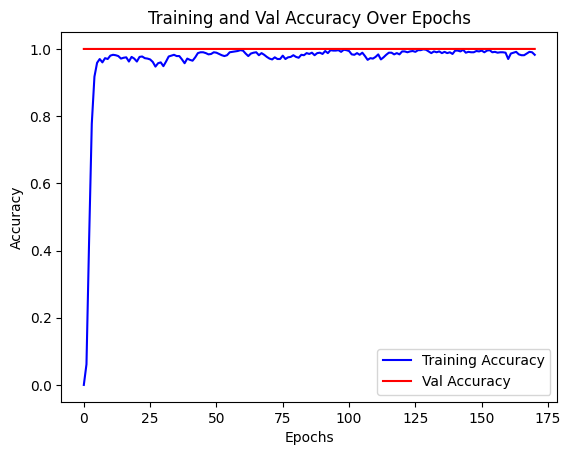

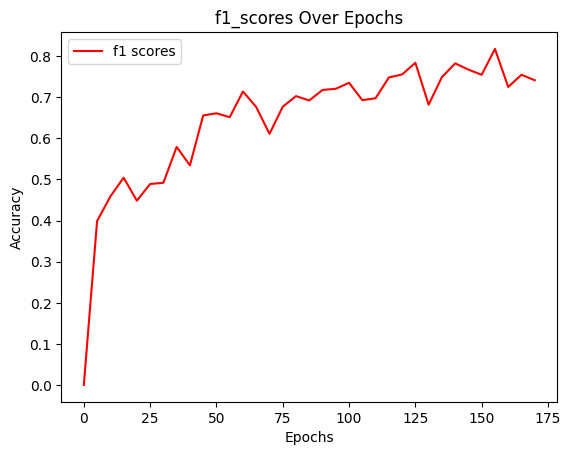

Epoch 170: train accuracy: 0.9825, Loss: 0.0714, Best Thresholds: 0.6000000238418579
Epoch 171: train accuracy: 0.9887, Loss: 0.0568, Best Thresholds: 0.6000000238418579
Epoch 172: train accuracy: 0.9912, Loss: 0.0218, Best Thresholds: 0.6000000238418579
Epoch 173: train accuracy: 0.9975, Loss: 0.0095, Best Thresholds: 0.6000000238418579
Epoch 174: train accuracy: 0.9912, Loss: 0.0326, Best Thresholds: 0.6000000238418579
tensor([[0.3512, 0.2951, 0.1823,  ..., 0.3118, 0.3188, 0.3143],
        [0.3011, 0.3031, 0.3322,  ..., 0.3296, 0.3293, 0.3309],
        [0.3587, 0.2800, 0.3971,  ..., 0.3327, 0.3445, 0.3395],
        ...,
        [0.3503, 0.3606, 0.3277,  ..., 0.3315, 0.3335, 0.3356],
        [0.4202, 0.2702, 0.3658,  ..., 0.3393, 0.3449, 0.3403],
        [0.2665, 0.2670, 0.3806,  ..., 0.3124, 0.3243, 0.3144]], device='cuda:0')
precision:  0.0001698753039818257 recall:  0.9766082167625427
tensor([[0.3512, 0.2951, 0.1823,  ..., 0.3118, 0.3188, 0.3143],
        [0.3011, 0.3031, 0.3322,  

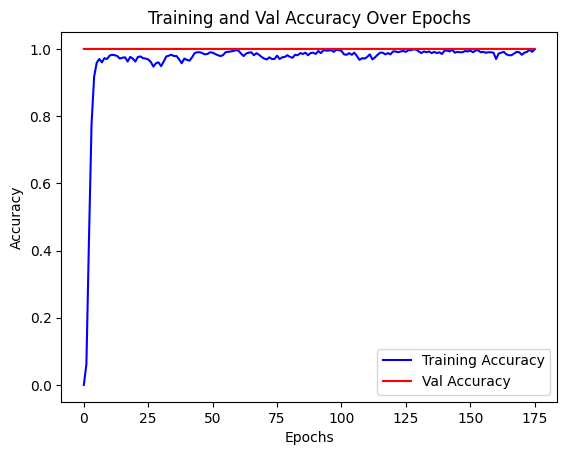

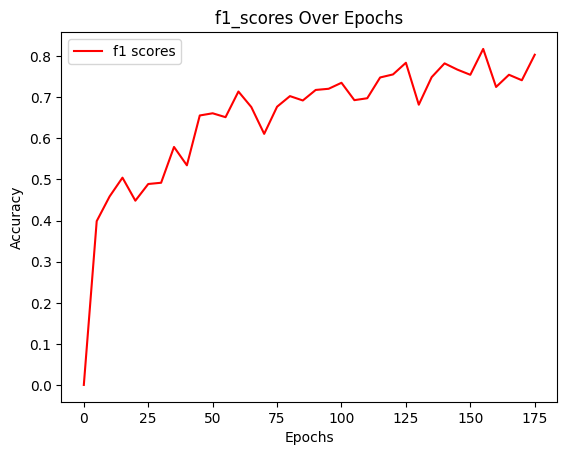

Epoch 175: train accuracy: 0.9987, Loss: 0.0073, Best Thresholds: 0.6000000238418579
Epoch 176: train accuracy: 0.9925, Loss: 0.0361, Best Thresholds: 0.6000000238418579
Epoch 177: train accuracy: 0.9962, Loss: 0.0142, Best Thresholds: 0.6000000238418579
Epoch 178: train accuracy: 0.9937, Loss: 0.0131, Best Thresholds: 0.6000000238418579
Epoch 179: train accuracy: 0.9937, Loss: 0.0290, Best Thresholds: 0.6000000238418579
tensor([[0.4672, 0.3869, 0.3790,  ..., 0.3640, 0.3748, 0.3659],
        [0.3937, 0.3375, 0.3540,  ..., 0.3823, 0.3894, 0.3845],
        [0.4101, 0.3192, 0.4534,  ..., 0.4095, 0.4015, 0.4072],
        ...,
        [0.4555, 0.3358, 0.2384,  ..., 0.3642, 0.3713, 0.3684],
        [0.3570, 0.4025, 0.3858,  ..., 0.3949, 0.3840, 0.3899],
        [0.4591, 0.3382, 0.3407,  ..., 0.3870, 0.3905, 0.3953]], device='cuda:0')
precision:  0.00017190922517329454 recall:  0.988304078578949
tensor([[0.4672, 0.3869, 0.3790,  ..., 0.3640, 0.3748, 0.3659],
        [0.3937, 0.3375, 0.3540,  

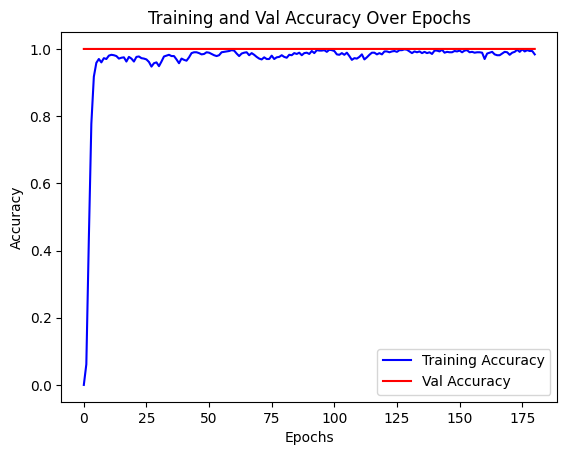

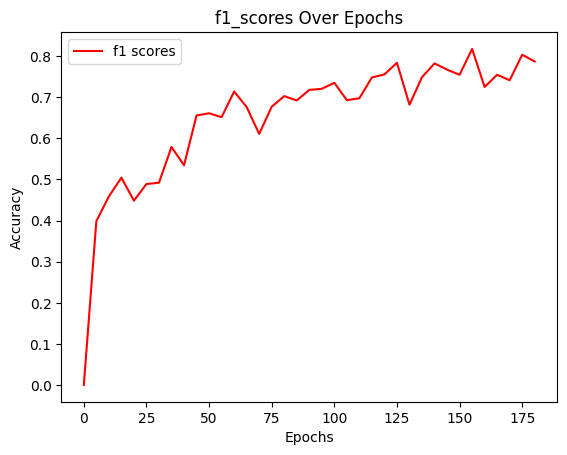

Epoch 180: train accuracy: 0.9837, Loss: 0.0899, Best Thresholds: 0.6000000238418579
Epoch 181: train accuracy: 0.9925, Loss: 0.0575, Best Thresholds: 0.6000000238418579
Epoch 182: train accuracy: 0.9825, Loss: 0.0556, Best Thresholds: 0.6000000238418579
Epoch 183: train accuracy: 0.9912, Loss: 0.0657, Best Thresholds: 0.6000000238418579
Epoch 184: train accuracy: 0.9912, Loss: 0.0886, Best Thresholds: 0.6000000238418579
tensor([[0.4822, 0.2081, 0.3787,  ..., 0.3649, 0.3630, 0.3666],
        [0.4175, 0.2808, 0.2630,  ..., 0.4077, 0.4036, 0.3992],
        [0.3970, 0.3623, 0.3471,  ..., 0.3904, 0.3914, 0.3894],
        ...,
        [0.3777, 0.3555, 0.3099,  ..., 0.3684, 0.3712, 0.3704],
        [0.3774, 0.8857, 0.4365,  ..., 0.3602, 0.3743, 0.3639],
        [0.4201, 0.3477, 0.2945,  ..., 0.3900, 0.3872, 0.3898]], device='cuda:0')
precision:  0.00017089217726606876 recall:  0.9824561476707458
tensor([[0.4822, 0.2081, 0.3787,  ..., 0.3649, 0.3630, 0.3666],
        [0.4175, 0.2808, 0.2630, 

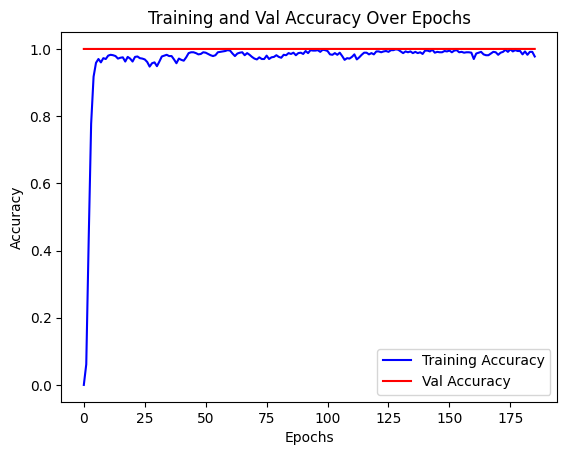

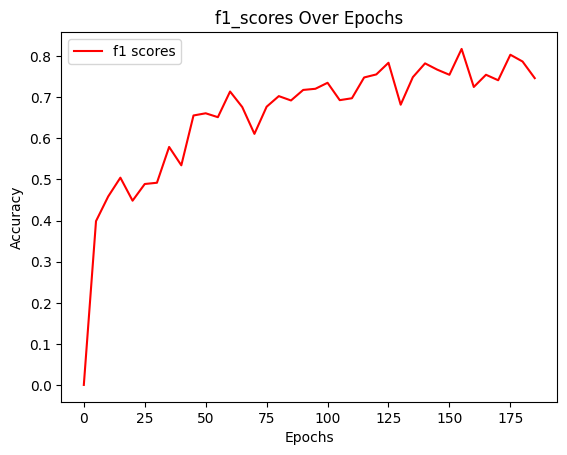

Epoch 185: train accuracy: 0.9774, Loss: 0.1573, Best Thresholds: 0.6000000238418579
Epoch 186: train accuracy: 0.9875, Loss: 0.0585, Best Thresholds: 0.6000000238418579
Epoch 187: train accuracy: 0.9762, Loss: 0.1999, Best Thresholds: 0.6000000238418579
Epoch 188: train accuracy: 0.9737, Loss: 0.1270, Best Thresholds: 0.6000000238418579
Epoch 189: train accuracy: 0.9825, Loss: 0.1461, Best Thresholds: 0.6000000238418579
tensor([[0.3573, 0.4006, 0.7852,  ..., 0.3795, 0.3841, 0.3760],
        [0.4529, 0.3721, 0.4638,  ..., 0.3817, 0.3830, 0.3801],
        [0.3786, 0.2942, 0.3020,  ..., 0.3739, 0.3792, 0.3707],
        ...,
        [0.3625, 0.4425, 0.4699,  ..., 0.3878, 0.3913, 0.3922],
        [0.3241, 0.3558, 0.4013,  ..., 0.4019, 0.3961, 0.4029],
        [0.3448, 0.4099, 0.4133,  ..., 0.3961, 0.3959, 0.3943]], device='cuda:0')
precision:  0.0001693666126811877 recall:  0.9736841917037964
tensor([[0.3573, 0.4006, 0.7852,  ..., 0.3795, 0.3841, 0.3760],
        [0.4529, 0.3721, 0.4638,  

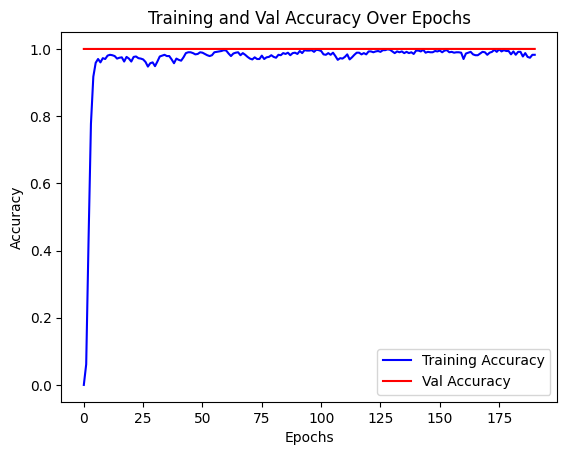

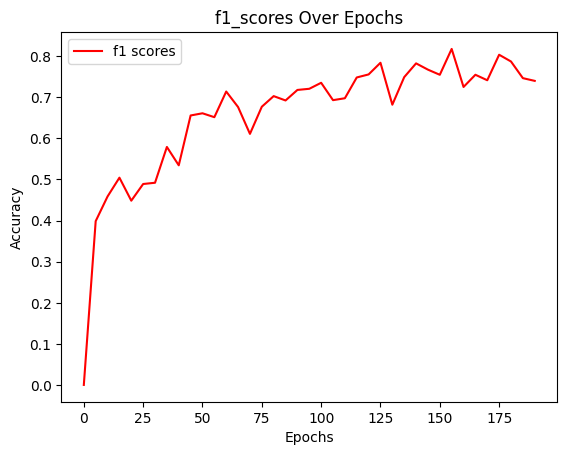

Epoch 190: train accuracy: 0.9825, Loss: 0.1538, Best Thresholds: 0.6000000238418579
Epoch 191: train accuracy: 0.9774, Loss: 0.1043, Best Thresholds: 0.6000000238418579
Epoch 192: train accuracy: 0.9875, Loss: 0.0942, Best Thresholds: 0.6000000238418579
Epoch 193: train accuracy: 0.9937, Loss: 0.0421, Best Thresholds: 0.6000000238418579
Epoch 194: train accuracy: 0.9862, Loss: 0.0647, Best Thresholds: 0.6000000238418579
tensor([[0.3738, 0.3570, 0.4185,  ..., 0.3148, 0.3215, 0.3209],
        [0.3757, 0.3367, 0.3008,  ..., 0.3291, 0.3365, 0.3365],
        [0.2803, 0.2415, 0.2843,  ..., 0.3049, 0.3149, 0.3153],
        ...,
        [0.3665, 0.4717, 0.2834,  ..., 0.3000, 0.3086, 0.3051],
        [0.3852, 0.8268, 0.2957,  ..., 0.3520, 0.3523, 0.3492],
        [0.3050, 0.2369, 0.2210,  ..., 0.3233, 0.3317, 0.3238]], device='cuda:0')
precision:  0.00017190931248478591 recall:  0.988304078578949
tensor([[0.3738, 0.3570, 0.4185,  ..., 0.3148, 0.3215, 0.3209],
        [0.3757, 0.3367, 0.3008,  

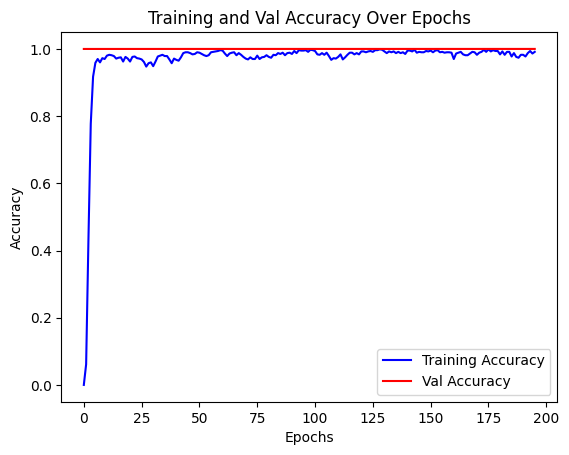

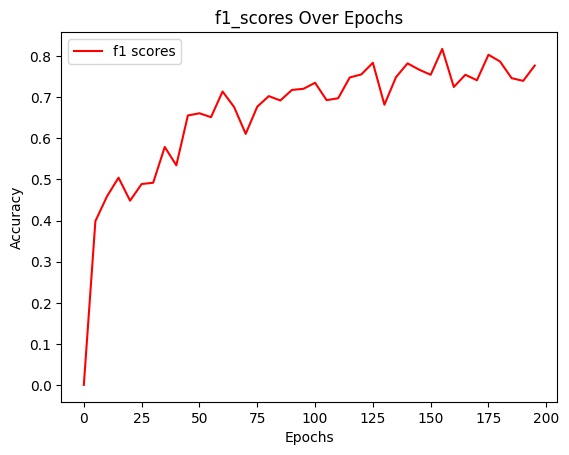

Epoch 195: train accuracy: 0.9912, Loss: 0.0344, Best Thresholds: 0.6000000238418579
Epoch 196: train accuracy: 0.9900, Loss: 0.0649, Best Thresholds: 0.6000000238418579
Epoch 197: train accuracy: 0.9900, Loss: 0.0579, Best Thresholds: 0.6000000238418579
Epoch 198: train accuracy: 0.9875, Loss: 0.1033, Best Thresholds: 0.6000000238418579
Epoch 199: train accuracy: 0.9799, Loss: 0.1580, Best Thresholds: 0.6000000238418579
tensor([[0.2755, 0.3311, 0.2230,  ..., 0.3113, 0.3218, 0.3193],
        [0.3257, 0.3399, 0.3341,  ..., 0.3326, 0.3335, 0.3317],
        [0.3349, 0.3345, 0.2354,  ..., 0.3134, 0.3284, 0.3178],
        ...,
        [0.4391, 0.4167, 0.3880,  ..., 0.3199, 0.3180, 0.3203],
        [0.2217, 0.4052, 0.2031,  ..., 0.3103, 0.3169, 0.3092],
        [0.3756, 0.4644, 0.4299,  ..., 0.3524, 0.3504, 0.3535]], device='cuda:0')
precision:  0.00017241852765437216 recall:  0.9912280440330505
tensor([[0.2755, 0.3311, 0.2230,  ..., 0.3113, 0.3218, 0.3193],
        [0.3257, 0.3399, 0.3341, 

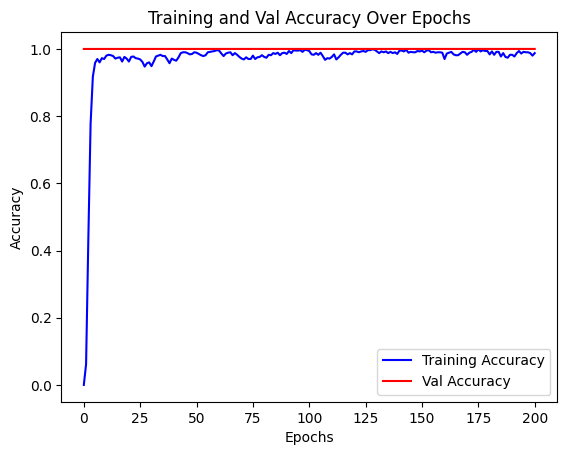

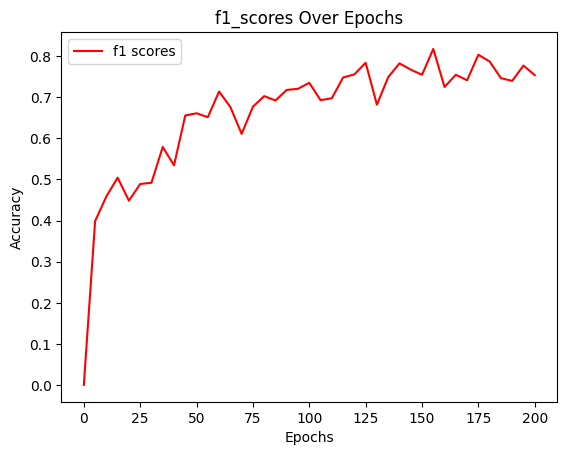

Epoch 200: train accuracy: 0.9875, Loss: 0.0666, Best Thresholds: 0.6000000238418579
Epoch 201: train accuracy: 0.9887, Loss: 0.0604, Best Thresholds: 0.6000000238418579
Epoch 202: train accuracy: 0.9900, Loss: 0.0700, Best Thresholds: 0.6000000238418579
Epoch 203: train accuracy: 0.9925, Loss: 0.0452, Best Thresholds: 0.6000000238418579
Epoch 204: train accuracy: 0.9937, Loss: 0.0393, Best Thresholds: 0.6000000238418579
tensor([[0.4281, 0.3673, 0.3427,  ..., 0.3055, 0.3153, 0.3087],
        [0.4141, 0.3456, 0.2923,  ..., 0.3150, 0.3212, 0.3213],
        [0.3993, 0.4525, 0.4541,  ..., 0.3419, 0.3437, 0.3439],
        ...,
        [0.3137, 0.4245, 0.3821,  ..., 0.3208, 0.3302, 0.3293],
        [0.5812, 0.3251, 0.3004,  ..., 0.2842, 0.2882, 0.2864],
        [0.2694, 0.2885, 0.2043,  ..., 0.2489, 0.2689, 0.2618]], device='cuda:0')
precision:  0.00017140174168162048 recall:  0.9853801131248474
tensor([[0.4281, 0.3673, 0.3427,  ..., 0.3055, 0.3153, 0.3087],
        [0.4141, 0.3456, 0.2923, 

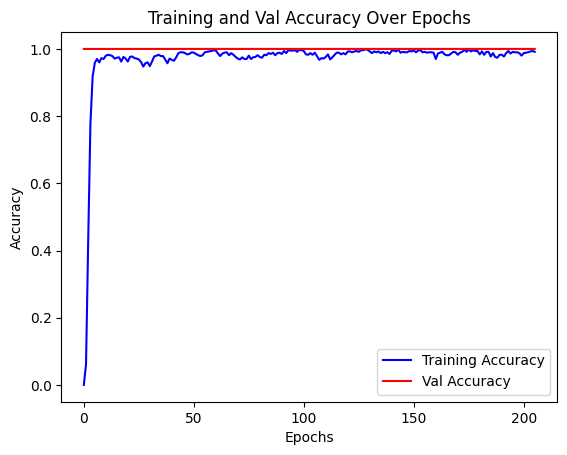

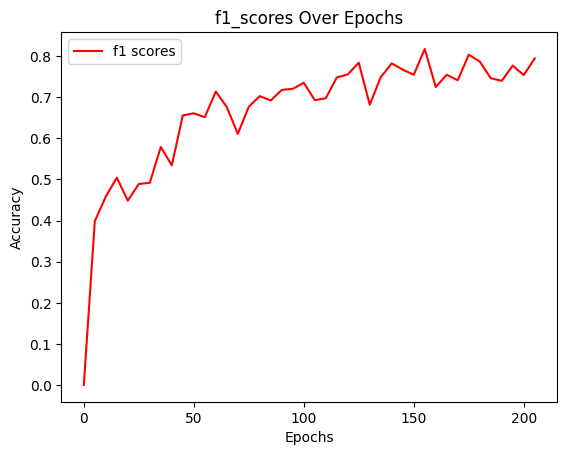

Epoch 205: train accuracy: 0.9912, Loss: 0.0260, Best Thresholds: 0.6000000238418579
Epoch 206: train accuracy: 0.9900, Loss: 0.0576, Best Thresholds: 0.6000000238418579
Epoch 207: train accuracy: 0.9925, Loss: 0.0596, Best Thresholds: 0.6000000238418579
Epoch 208: train accuracy: 0.9900, Loss: 0.0583, Best Thresholds: 0.6000000238418579
Epoch 209: train accuracy: 0.9887, Loss: 0.0544, Best Thresholds: 0.6000000238418579
tensor([[0.4286, 0.2891, 0.3211,  ..., 0.3653, 0.3691, 0.3634],
        [0.3367, 0.3902, 0.2346,  ..., 0.3390, 0.3452, 0.3407],
        [0.3770, 0.3900, 0.3369,  ..., 0.3779, 0.3683, 0.3696],
        ...,
        [0.3182, 0.3177, 0.4400,  ..., 0.3690, 0.3663, 0.3653],
        [0.2143, 0.3813, 0.3855,  ..., 0.3467, 0.3509, 0.3481],
        [0.3428, 0.3930, 0.3055,  ..., 0.3100, 0.3125, 0.3132]], device='cuda:0')
precision:  0.00017140086856670678 recall:  0.9853801131248474
tensor([[0.4286, 0.2891, 0.3211,  ..., 0.3653, 0.3691, 0.3634],
        [0.3367, 0.3902, 0.2346, 

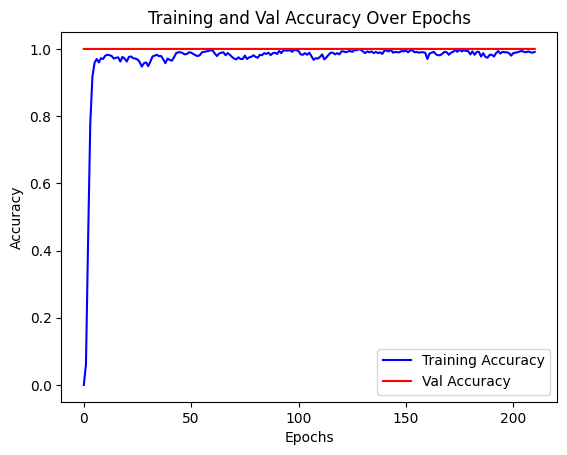

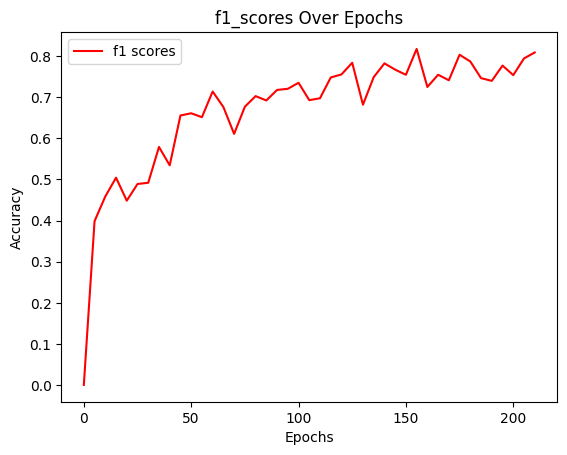

Epoch 210: train accuracy: 0.9912, Loss: 0.0301, Best Thresholds: 0.6000000238418579
Epoch 211: train accuracy: 0.9925, Loss: 0.0352, Best Thresholds: 0.6000000238418579
Epoch 212: train accuracy: 0.9925, Loss: 0.0196, Best Thresholds: 0.6000000238418579
Epoch 213: train accuracy: 0.9925, Loss: 0.0392, Best Thresholds: 0.6000000238418579
Epoch 214: train accuracy: 0.9962, Loss: 0.0099, Best Thresholds: 0.6000000238418579
tensor([[0.3308, 0.3274, 0.3817,  ..., 0.3577, 0.3624, 0.3632],
        [0.4135, 0.4097, 0.3773,  ..., 0.3451, 0.3509, 0.3517],
        [0.3090, 0.2991, 0.4849,  ..., 0.3805, 0.3709, 0.3762],
        ...,
        [0.3623, 0.3007, 0.3872,  ..., 0.3542, 0.3591, 0.3598],
        [0.3247, 0.5108, 0.3799,  ..., 0.3634, 0.3592, 0.3614],
        [0.3759, 0.4199, 0.3645,  ..., 0.3779, 0.3745, 0.3756]], device='cuda:0')
precision:  0.00017140069394372404 recall:  0.9853801131248474
tensor([[0.3308, 0.3274, 0.3817,  ..., 0.3577, 0.3624, 0.3632],
        [0.4135, 0.4097, 0.3773, 

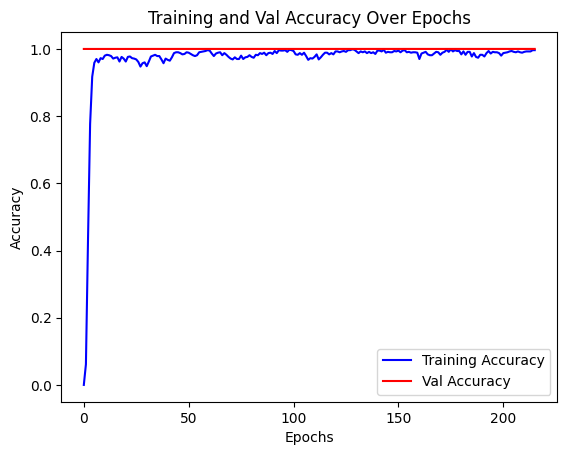

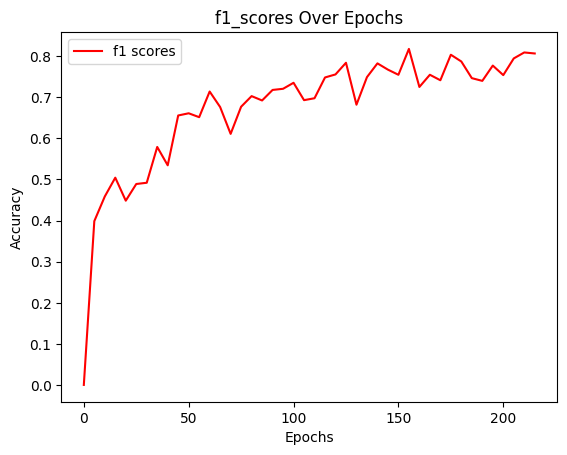

Epoch 215: train accuracy: 0.9962, Loss: 0.0233, Best Thresholds: 0.6000000238418579
Epoch 216: train accuracy: 0.9962, Loss: 0.0155, Best Thresholds: 0.6000000238418579
Epoch 217: train accuracy: 0.9950, Loss: 0.0245, Best Thresholds: 0.6000000238418579
Epoch 218: train accuracy: 0.9987, Loss: 0.0070, Best Thresholds: 0.6000000238418579
Epoch 219: train accuracy: 0.9962, Loss: 0.0102, Best Thresholds: 0.6000000238418579
tensor([[0.4649, 0.4006, 0.4825,  ..., 0.3564, 0.3599, 0.3555],
        [0.4472, 0.3613, 0.3633,  ..., 0.3608, 0.3719, 0.3655],
        [0.3065, 0.5522, 0.2850,  ..., 0.3694, 0.3721, 0.3702],
        ...,
        [0.4269, 0.4042, 0.3592,  ..., 0.3613, 0.3718, 0.3667],
        [0.3533, 0.3979, 0.4417,  ..., 0.3694, 0.3819, 0.3776],
        [0.3177, 0.3859, 0.3090,  ..., 0.3540, 0.3651, 0.3607]], device='cuda:0')
precision:  0.00017190931248478591 recall:  0.988304078578949
tensor([[0.4649, 0.4006, 0.4825,  ..., 0.3564, 0.3599, 0.3555],
        [0.4472, 0.3613, 0.3633,  

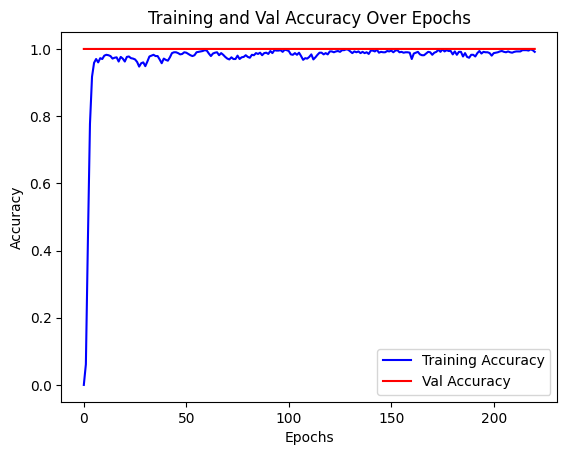

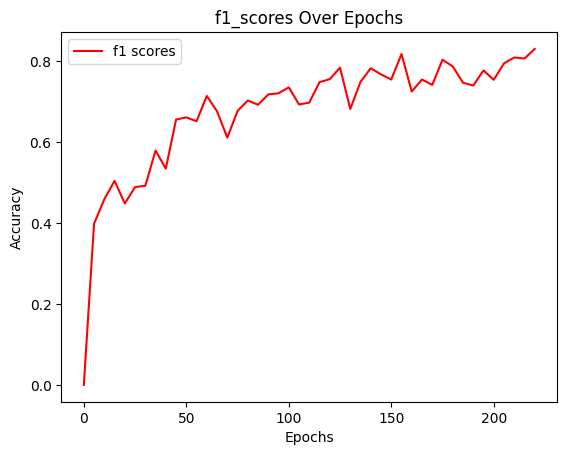

Epoch 220: train accuracy: 0.9912, Loss: 0.0723, Best Thresholds: 0.6000000238418579
Epoch 221: train accuracy: 0.9925, Loss: 0.0514, Best Thresholds: 0.6000000238418579
Epoch 222: train accuracy: 0.9937, Loss: 0.0408, Best Thresholds: 0.6000000238418579
Epoch 223: train accuracy: 0.9900, Loss: 0.0542, Best Thresholds: 0.6000000238418579
Epoch 224: train accuracy: 0.9887, Loss: 0.0649, Best Thresholds: 0.6000000238418579
tensor([[0.2877, 0.3702, 0.2839,  ..., 0.3225, 0.3212, 0.3244],
        [0.3432, 0.3226, 0.3645,  ..., 0.3094, 0.3134, 0.3119],
        [0.3416, 0.3952, 0.2275,  ..., 0.3351, 0.3324, 0.3362],
        ...,
        [0.3830, 0.2613, 0.2227,  ..., 0.3039, 0.3148, 0.3108],
        [0.3517, 0.3642, 0.3491,  ..., 0.3279, 0.3280, 0.3281],
        [0.4235, 0.2862, 0.3450,  ..., 0.3127, 0.3051, 0.3115]], device='cuda:0')
precision:  0.00016784164472483099 recall:  0.9649122953414917
tensor([[0.2877, 0.3702, 0.2839,  ..., 0.3225, 0.3212, 0.3244],
        [0.3432, 0.3226, 0.3645, 

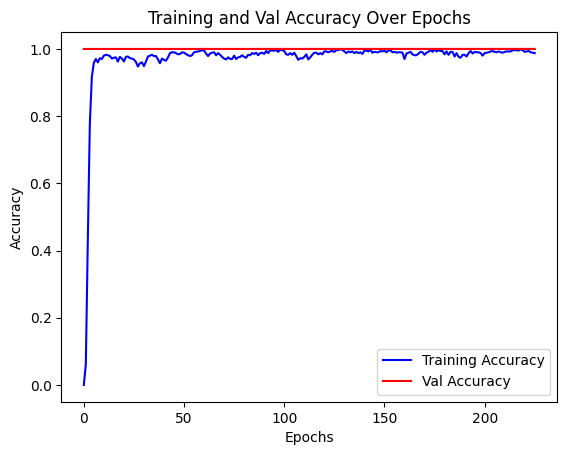

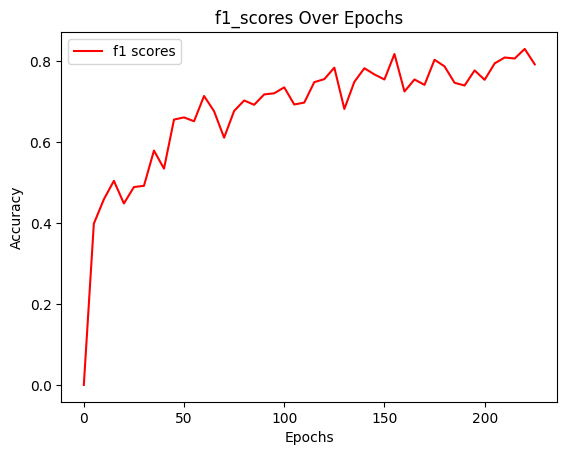

Epoch 225: train accuracy: 0.9875, Loss: 0.0934, Best Thresholds: 0.6000000238418579
Epoch 226: train accuracy: 0.9962, Loss: 0.0149, Best Thresholds: 0.6000000238418579
Epoch 227: train accuracy: 0.9950, Loss: 0.0159, Best Thresholds: 0.6000000238418579
Epoch 228: train accuracy: 0.9850, Loss: 0.1061, Best Thresholds: 0.6000000238418579
Epoch 229: train accuracy: 0.9887, Loss: 0.0453, Best Thresholds: 0.6000000238418579
tensor([[0.3430, 0.4473, 0.4570,  ..., 0.3615, 0.3670, 0.3651],
        [0.3572, 0.3754, 0.3702,  ..., 0.3859, 0.3837, 0.3828],
        [0.4085, 0.2909, 0.3205,  ..., 0.3625, 0.3616, 0.3652],
        ...,
        [0.3408, 0.7145, 0.3555,  ..., 0.3829, 0.3817, 0.3796],
        [0.3676, 0.4084, 0.4359,  ..., 0.3873, 0.3904, 0.3872],
        [0.3593, 0.4066, 0.4121,  ..., 0.3609, 0.3678, 0.3635]], device='cuda:0')
precision:  0.00017038366058841348 recall:  0.9795321822166443
tensor([[0.3430, 0.4473, 0.4570,  ..., 0.3615, 0.3670, 0.3651],
        [0.3572, 0.3754, 0.3702, 

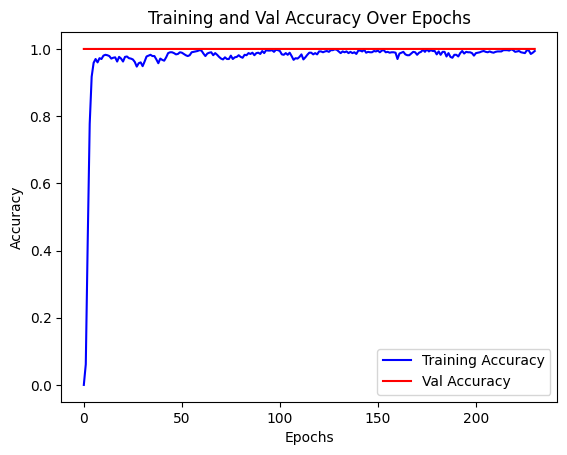

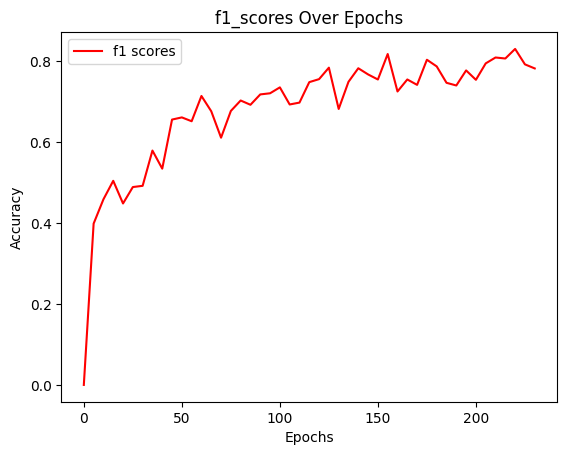

Epoch 230: train accuracy: 0.9937, Loss: 0.0281, Best Thresholds: 0.6000000238418579
Epoch 231: train accuracy: 0.9937, Loss: 0.0349, Best Thresholds: 0.6000000238418579
Epoch 232: train accuracy: 0.9950, Loss: 0.0118, Best Thresholds: 0.6000000238418579
Epoch 233: train accuracy: 0.9950, Loss: 0.0148, Best Thresholds: 0.6000000238418579
Epoch 234: train accuracy: 0.9975, Loss: 0.0169, Best Thresholds: 0.6000000238418579
tensor([[0.3877, 0.4720, 0.3147,  ..., 0.3586, 0.3628, 0.3610],
        [0.4043, 0.3435, 0.4417,  ..., 0.3602, 0.3694, 0.3657],
        [0.3470, 0.3841, 0.4496,  ..., 0.3766, 0.3688, 0.3731],
        ...,
        [0.3489, 0.6663, 0.3008,  ..., 0.3208, 0.3341, 0.3258],
        [0.4879, 0.3330, 0.3137,  ..., 0.3447, 0.3507, 0.3515],
        [0.3476, 0.4455, 0.4571,  ..., 0.3646, 0.3708, 0.3692]], device='cuda:0')
precision:  0.00017089226457756013 recall:  0.9824561476707458
tensor([[0.3877, 0.4720, 0.3147,  ..., 0.3586, 0.3628, 0.3610],
        [0.4043, 0.3435, 0.4417, 

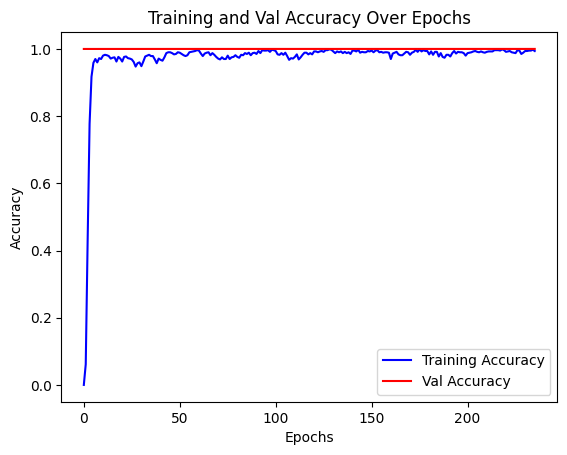

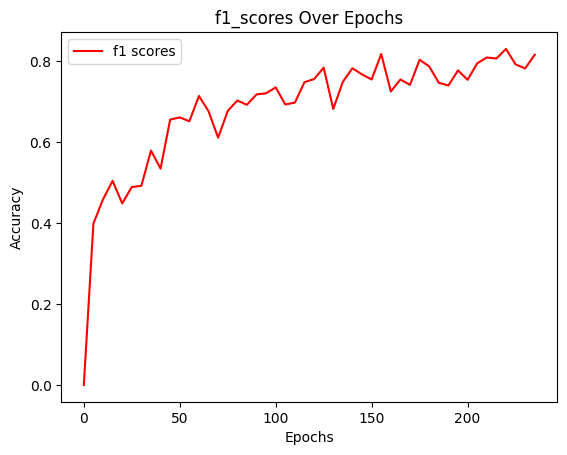

Epoch 235: train accuracy: 0.9937, Loss: 0.0389, Best Thresholds: 0.6000000238418579
Epoch 236: train accuracy: 0.9950, Loss: 0.0127, Best Thresholds: 0.6000000238418579
Epoch 237: train accuracy: 0.9975, Loss: 0.0111, Best Thresholds: 0.6000000238418579
Epoch 238: train accuracy: 0.9962, Loss: 0.0260, Best Thresholds: 0.6000000238418579
Epoch 239: train accuracy: 0.9887, Loss: 0.0429, Best Thresholds: 0.6000000238418579
tensor([[0.3548, 0.4370, 0.4007,  ..., 0.3511, 0.3553, 0.3540],
        [0.4524, 0.4675, 0.2818,  ..., 0.3377, 0.3381, 0.3367],
        [0.3667, 0.3697, 0.3310,  ..., 0.3393, 0.3489, 0.3435],
        ...,
        [0.4664, 0.3489, 0.4035,  ..., 0.3506, 0.3558, 0.3523],
        [0.3278, 0.3357, 0.4024,  ..., 0.3446, 0.3471, 0.3425],
        [0.4502, 0.3895, 0.3330,  ..., 0.3326, 0.3352, 0.3368]], device='cuda:0')
precision:  0.00017038400983437896 recall:  0.9795321822166443
tensor([[0.3548, 0.4370, 0.4007,  ..., 0.3511, 0.3553, 0.3540],
        [0.4524, 0.4675, 0.2818, 

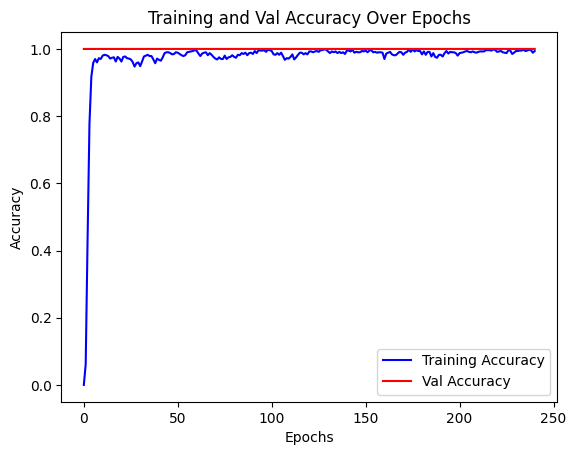

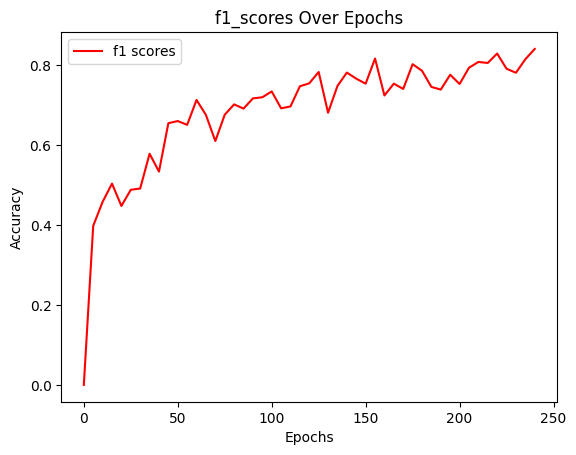

Epoch 240: train accuracy: 0.9937, Loss: 0.0315, Best Thresholds: 0.6000000238418579
Epoch 241: train accuracy: 0.9875, Loss: 0.0739, Best Thresholds: 0.6000000238418579
Epoch 242: train accuracy: 0.9925, Loss: 0.0174, Best Thresholds: 0.6000000238418579
Epoch 243: train accuracy: 0.9950, Loss: 0.0219, Best Thresholds: 0.6000000238418579
Epoch 244: train accuracy: 0.9912, Loss: 0.0378, Best Thresholds: 0.6000000238418579
tensor([[0.2973, 0.4571, 0.3130,  ..., 0.3724, 0.3738, 0.3710],
        [0.3645, 0.6881, 0.3636,  ..., 0.3573, 0.3660, 0.3639],
        [0.3404, 0.4275, 0.4420,  ..., 0.3674, 0.3717, 0.3703],
        ...,
        [0.2590, 0.3727, 0.3487,  ..., 0.3480, 0.3552, 0.3546],
        [0.3464, 0.3451, 0.4203,  ..., 0.3694, 0.3671, 0.3697],
        [0.3063, 0.4969, 0.4685,  ..., 0.3860, 0.3860, 0.3862]], device='cuda:0')
precision:  0.00017140069394372404 recall:  0.9853801131248474
tensor([[0.2973, 0.4571, 0.3130,  ..., 0.3724, 0.3738, 0.3710],
        [0.3645, 0.6881, 0.3636, 

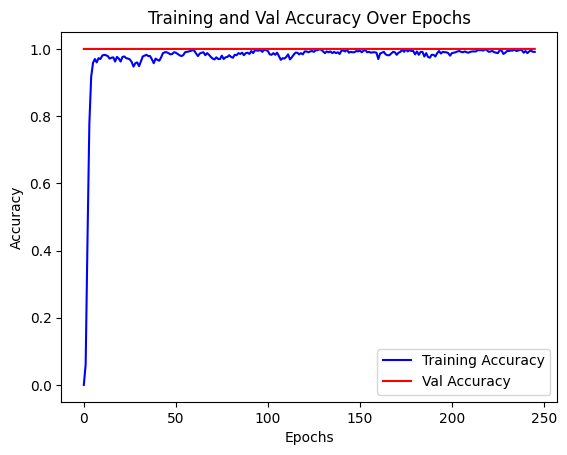

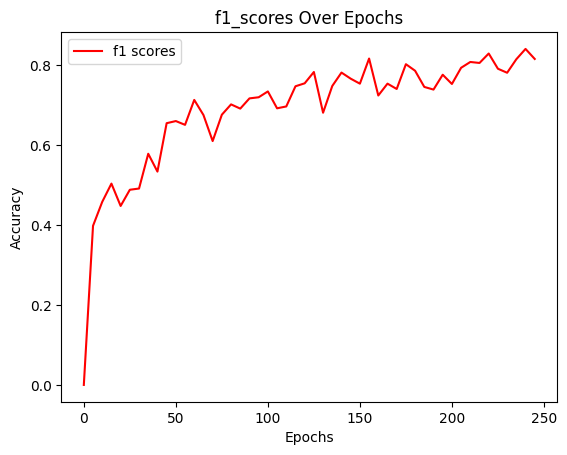

Epoch 245: train accuracy: 0.9912, Loss: 0.0307, Best Thresholds: 0.6000000238418579
Epoch 246: train accuracy: 0.9987, Loss: 0.0054, Best Thresholds: 0.6000000238418579
Epoch 247: train accuracy: 0.9962, Loss: 0.0159, Best Thresholds: 0.6000000238418579
Epoch 248: train accuracy: 0.9925, Loss: 0.0563, Best Thresholds: 0.6000000238418579
Epoch 249: train accuracy: 0.9900, Loss: 0.0705, Best Thresholds: 0.6000000238418579
tensor([[0.7147, 0.2632, 0.3165,  ..., 0.3541, 0.3531, 0.3510],
        [0.4857, 0.3710, 0.4120,  ..., 0.3520, 0.3576, 0.3517],
        [0.3402, 0.3950, 0.3410,  ..., 0.3582, 0.3599, 0.3610],
        ...,
        [0.3871, 0.4185, 0.4114,  ..., 0.3304, 0.3431, 0.3379],
        [0.4513, 0.3596, 0.3222,  ..., 0.3416, 0.3454, 0.3412],
        [0.3596, 0.3783, 0.3928,  ..., 0.3239, 0.3368, 0.3264]], device='cuda:0')
precision:  0.00017089226457756013 recall:  0.9824561476707458
tensor([[0.7147, 0.2632, 0.3165,  ..., 0.3541, 0.3531, 0.3510],
        [0.4857, 0.3710, 0.4120, 

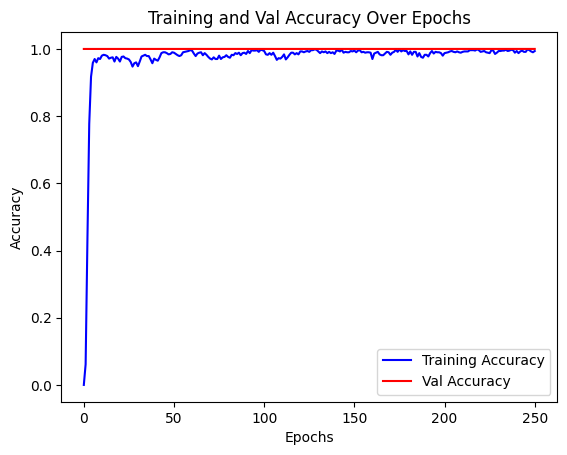

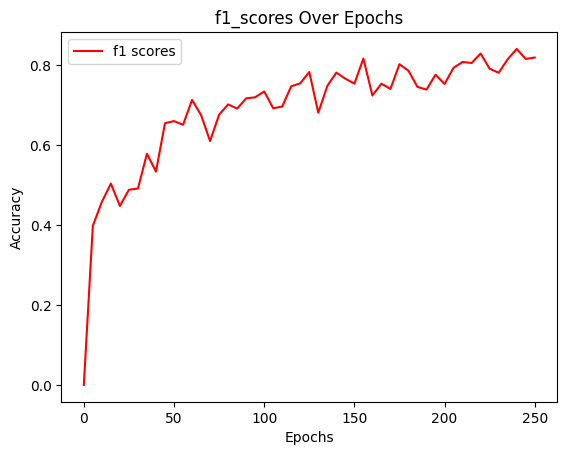

Epoch 250: train accuracy: 0.9937, Loss: 0.1218, Best Thresholds: 0.6000000238418579
Epoch 251: train accuracy: 0.9887, Loss: 0.0660, Best Thresholds: 0.6000000238418579
Epoch 252: train accuracy: 0.9850, Loss: 0.1329, Best Thresholds: 0.6000000238418579
Epoch 253: train accuracy: 0.9850, Loss: 0.1027, Best Thresholds: 0.6000000238418579
Epoch 254: train accuracy: 0.9850, Loss: 0.0591, Best Thresholds: 0.6000000238418579
tensor([[0.4933, 0.3098, 0.5272,  ..., 0.4017, 0.4105, 0.4055],
        [0.3580, 0.4962, 0.5119,  ..., 0.4302, 0.4235, 0.4272],
        [0.3809, 0.4225, 0.4941,  ..., 0.4056, 0.4098, 0.4070],
        ...,
        [0.3294, 0.4797, 0.3643,  ..., 0.4167, 0.4176, 0.4157],
        [0.4312, 0.4231, 0.3378,  ..., 0.3603, 0.3828, 0.3731],
        [0.2980, 0.4303, 0.4260,  ..., 0.3888, 0.3942, 0.3877]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.4933, 0.3098, 0.5272,  ..., 0.4017, 0.4105, 0.4055],
        [0.3580, 0.4962, 0.5119, 

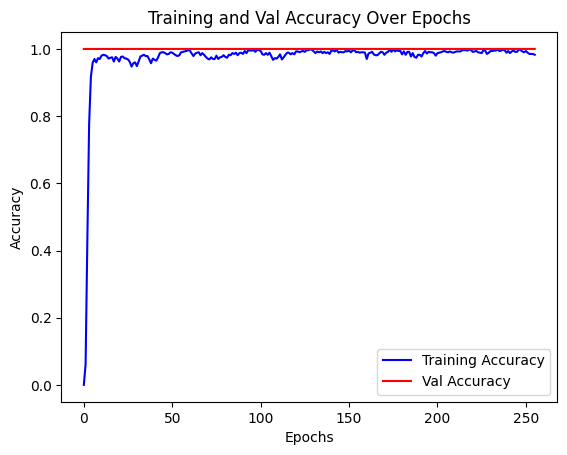

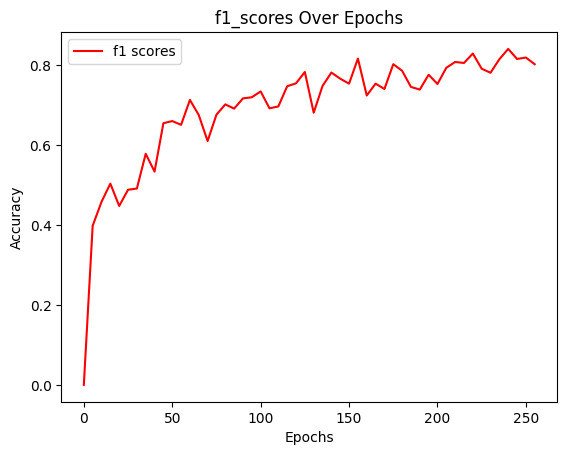

Epoch 255: train accuracy: 0.9825, Loss: 0.0813, Best Thresholds: 0.6000000238418579
Epoch 256: train accuracy: 0.9812, Loss: 0.0963, Best Thresholds: 0.6000000238418579
Epoch 257: train accuracy: 0.9850, Loss: 0.0969, Best Thresholds: 0.6000000238418579
Epoch 258: train accuracy: 0.9912, Loss: 0.0524, Best Thresholds: 0.6000000238418579
Epoch 259: train accuracy: 0.9850, Loss: 0.0867, Best Thresholds: 0.6000000238418579
tensor([[0.3400, 0.4367, 0.4190,  ..., 0.3764, 0.3774, 0.3777],
        [0.3714, 0.3976, 0.4130,  ..., 0.3930, 0.3898, 0.3893],
        [0.3520, 0.4810, 0.3361,  ..., 0.3782, 0.3774, 0.3796],
        ...,
        [0.5031, 0.3309, 0.3981,  ..., 0.3973, 0.4012, 0.3976],
        [0.4301, 0.3130, 0.3949,  ..., 0.3597, 0.3656, 0.3630],
        [0.3629, 0.3738, 0.4180,  ..., 0.3451, 0.3556, 0.3469]], device='cuda:0')
precision:  0.0001698751439107582 recall:  0.9766082167625427
tensor([[0.3400, 0.4367, 0.4190,  ..., 0.3764, 0.3774, 0.3777],
        [0.3714, 0.3976, 0.4130,  

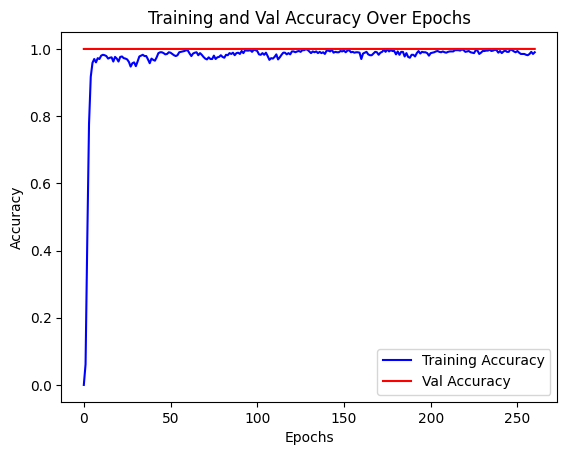

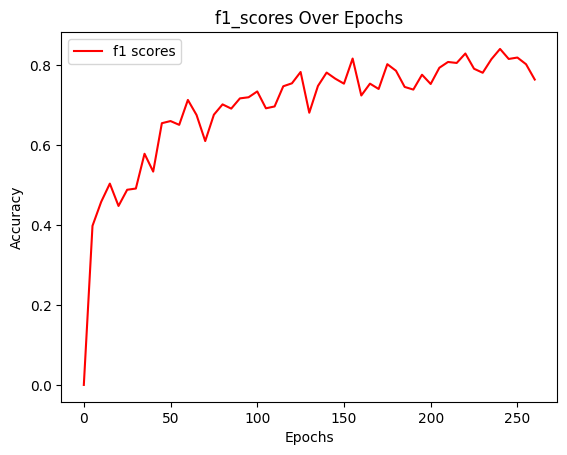

Epoch 260: train accuracy: 0.9900, Loss: 0.0353, Best Thresholds: 0.6000000238418579
Epoch 261: train accuracy: 0.9950, Loss: 0.0261, Best Thresholds: 0.6000000238418579
Epoch 262: train accuracy: 0.9925, Loss: 0.0227, Best Thresholds: 0.6000000238418579
Epoch 263: train accuracy: 0.9912, Loss: 0.0791, Best Thresholds: 0.6000000238418579
Epoch 264: train accuracy: 0.9937, Loss: 0.0430, Best Thresholds: 0.6000000238418579
tensor([[0.3823, 0.3883, 0.4288,  ..., 0.3944, 0.3945, 0.3945],
        [0.3950, 0.3421, 0.4008,  ..., 0.3929, 0.4001, 0.3976],
        [0.3212, 0.6290, 0.3206,  ..., 0.3606, 0.3648, 0.3632],
        ...,
        [0.4228, 0.3962, 0.2937,  ..., 0.3679, 0.3740, 0.3672],
        [0.5087, 0.5162, 0.3336,  ..., 0.3829, 0.3895, 0.3859],
        [0.3186, 0.4971, 0.4355,  ..., 0.3993, 0.3965, 0.3995]], device='cuda:0')
precision:  0.00017089217726606876 recall:  0.9824561476707458
tensor([[0.3823, 0.3883, 0.4288,  ..., 0.3944, 0.3945, 0.3945],
        [0.3950, 0.3421, 0.4008, 

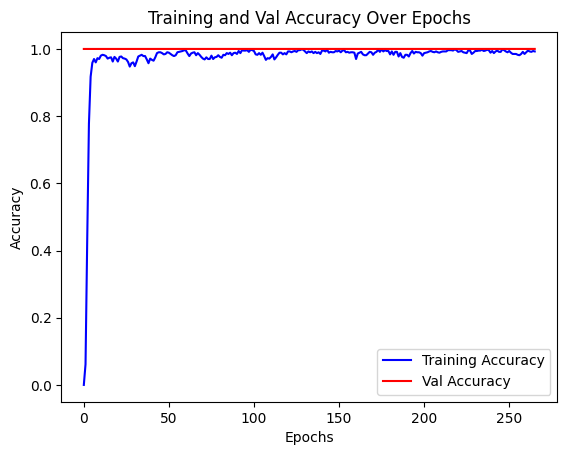

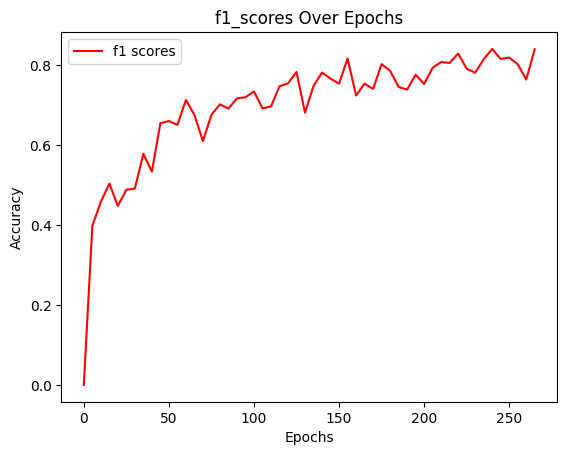

Epoch 265: train accuracy: 0.9925, Loss: 0.0503, Best Thresholds: 0.6000000238418579
Epoch 266: train accuracy: 0.9950, Loss: 0.0074, Best Thresholds: 0.6000000238418579
Epoch 267: train accuracy: 0.9975, Loss: 0.0160, Best Thresholds: 0.6000000238418579
Epoch 268: train accuracy: 0.9950, Loss: 0.0219, Best Thresholds: 0.6000000238418579
Epoch 269: train accuracy: 0.9987, Loss: 0.0022, Best Thresholds: 0.6000000238418579
tensor([[0.3323, 0.4036, 0.3475,  ..., 0.3659, 0.3694, 0.3684],
        [0.3732, 0.7629, 0.4402,  ..., 0.3717, 0.3765, 0.3740],
        [0.3736, 0.3935, 0.3798,  ..., 0.3903, 0.3876, 0.3874],
        ...,
        [0.3091, 0.4465, 0.3184,  ..., 0.3627, 0.3692, 0.3651],
        [0.3475, 0.4911, 0.4167,  ..., 0.3822, 0.3822, 0.3843],
        [0.3136, 0.4748, 0.3937,  ..., 0.3838, 0.3814, 0.3840]], device='cuda:0')
precision:  0.00017190922517329454 recall:  0.988304078578949
tensor([[0.3323, 0.4036, 0.3475,  ..., 0.3659, 0.3694, 0.3684],
        [0.3732, 0.7629, 0.4402,  

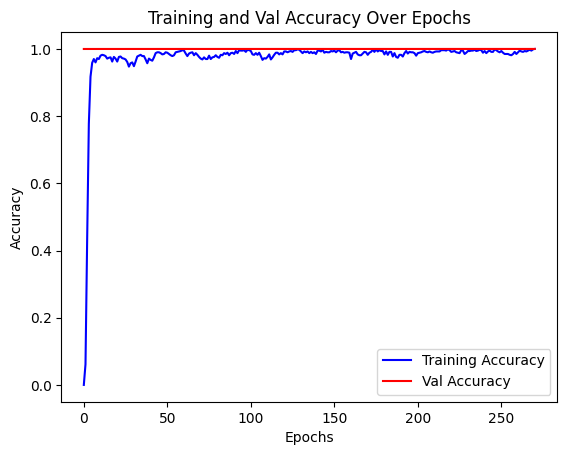

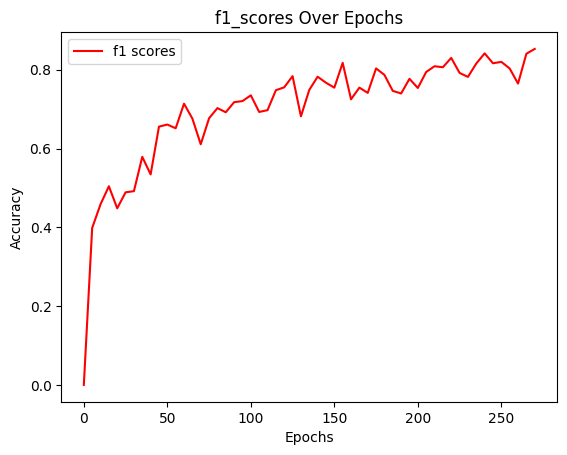

Epoch 270: train accuracy: 1.0000, Loss: 0.0013, Best Thresholds: 0.6000000238418579
Epoch 271: train accuracy: 1.0000, Loss: 0.0017, Best Thresholds: 0.6000000238418579
Epoch 272: train accuracy: 0.9975, Loss: 0.0182, Best Thresholds: 0.6000000238418579
Epoch 273: train accuracy: 0.9962, Loss: 0.0053, Best Thresholds: 0.6000000238418579
Epoch 274: train accuracy: 0.9962, Loss: 0.0119, Best Thresholds: 0.6000000238418579
tensor([[0.3660, 0.3989, 0.4792,  ..., 0.4084, 0.4070, 0.4058],
        [0.4215, 0.3258, 0.4030,  ..., 0.3946, 0.4001, 0.3978],
        [0.3482, 0.5898, 0.3663,  ..., 0.4079, 0.4028, 0.4042],
        ...,
        [0.3782, 0.3924, 0.2617,  ..., 0.3950, 0.3985, 0.3974],
        [0.4083, 0.3394, 0.2445,  ..., 0.3555, 0.3653, 0.3599],
        [0.4727, 0.4389, 0.3669,  ..., 0.3703, 0.3761, 0.3750]], device='cuda:0')
precision:  0.0001729262585286051 recall:  0.9941520690917969
tensor([[0.3660, 0.3989, 0.4792,  ..., 0.4084, 0.4070, 0.4058],
        [0.4215, 0.3258, 0.4030,  

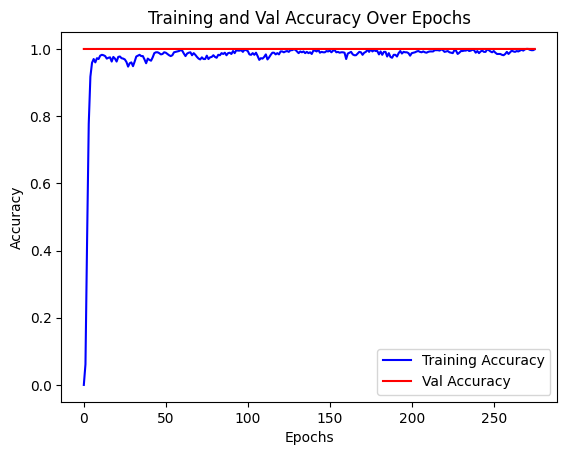

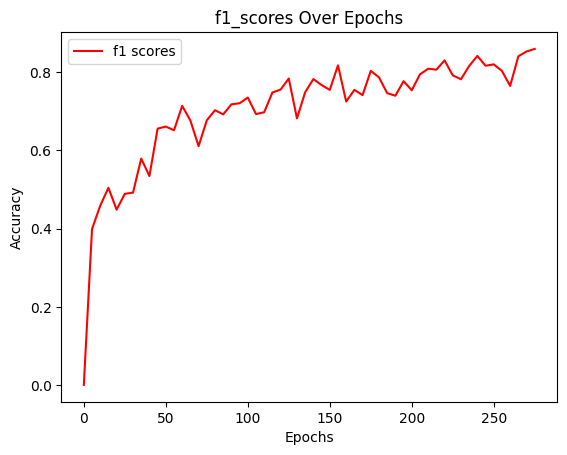

Epoch 275: train accuracy: 0.9987, Loss: 0.0054, Best Thresholds: 0.6000000238418579
Epoch 276: train accuracy: 0.9987, Loss: 0.0039, Best Thresholds: 0.6000000238418579
Epoch 277: train accuracy: 0.9987, Loss: 0.0034, Best Thresholds: 0.6000000238418579
Epoch 278: train accuracy: 0.9975, Loss: 0.0130, Best Thresholds: 0.6000000238418579
Epoch 279: train accuracy: 1.0000, Loss: 0.0011, Best Thresholds: 0.6000000238418579
tensor([[0.4618, 0.4250, 0.4150,  ..., 0.4025, 0.4018, 0.4022],
        [0.3848, 0.4023, 0.4175,  ..., 0.3816, 0.3902, 0.3853],
        [0.3317, 0.5732, 0.3337,  ..., 0.3968, 0.3957, 0.3968],
        ...,
        [0.3889, 0.3780, 0.2748,  ..., 0.3794, 0.3928, 0.3860],
        [0.4570, 0.4033, 0.3747,  ..., 0.4010, 0.4024, 0.4011],
        [0.3772, 0.3853, 0.4333,  ..., 0.3831, 0.3891, 0.3843]], device='cuda:0')
precision:  0.00017241774185094982 recall:  0.9912280440330505
tensor([[0.4618, 0.4250, 0.4150,  ..., 0.4025, 0.4018, 0.4022],
        [0.3848, 0.4023, 0.4175, 

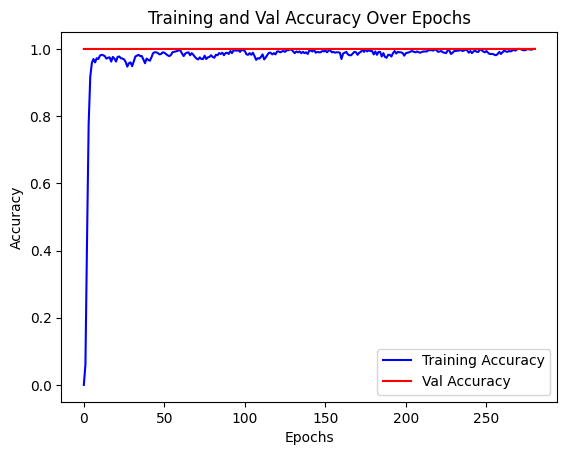

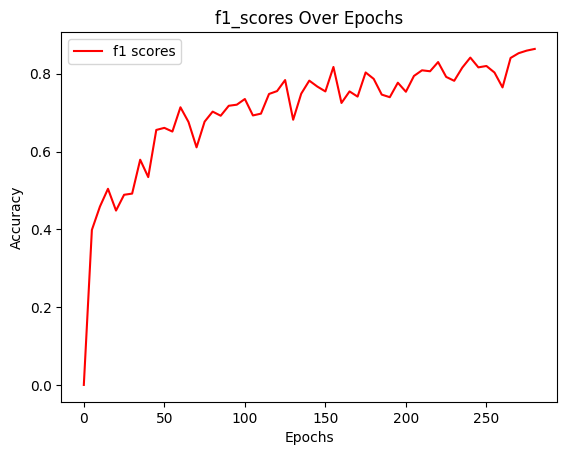

Epoch 280: train accuracy: 1.0000, Loss: 0.0011, Best Thresholds: 0.6000000238418579
Epoch 281: train accuracy: 0.9950, Loss: 0.0263, Best Thresholds: 0.6000000238418579
Epoch 282: train accuracy: 0.9937, Loss: 0.0215, Best Thresholds: 0.6000000238418579
Epoch 283: train accuracy: 0.9925, Loss: 0.0202, Best Thresholds: 0.6000000238418579
Epoch 284: train accuracy: 0.9937, Loss: 0.0287, Best Thresholds: 0.6000000238418579
tensor([[0.3970, 0.4187, 0.4499,  ..., 0.3990, 0.4049, 0.4022],
        [0.5220, 0.4348, 0.4222,  ..., 0.4259, 0.4266, 0.4247],
        [0.3698, 0.3778, 0.3309,  ..., 0.4125, 0.4186, 0.4150],
        ...,
        [0.3604, 0.4887, 0.4635,  ..., 0.4354, 0.4311, 0.4335],
        [0.3641, 0.4183, 0.3944,  ..., 0.4121, 0.4159, 0.4128],
        [0.5214, 0.4231, 0.2870,  ..., 0.3845, 0.3931, 0.3903]], device='cuda:0')
precision:  0.00017089217726606876 recall:  0.9824561476707458
tensor([[0.3970, 0.4187, 0.4499,  ..., 0.3990, 0.4049, 0.4022],
        [0.5220, 0.4348, 0.4222, 

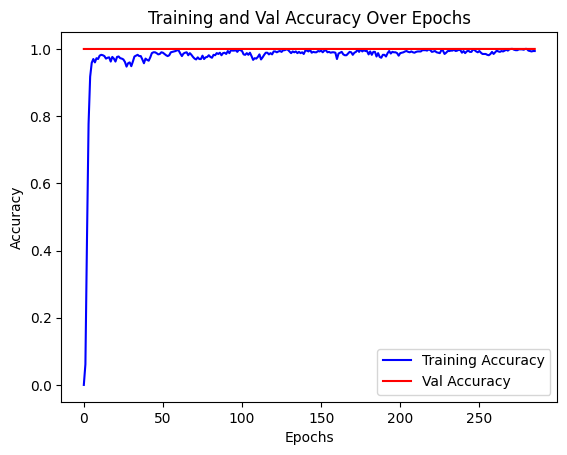

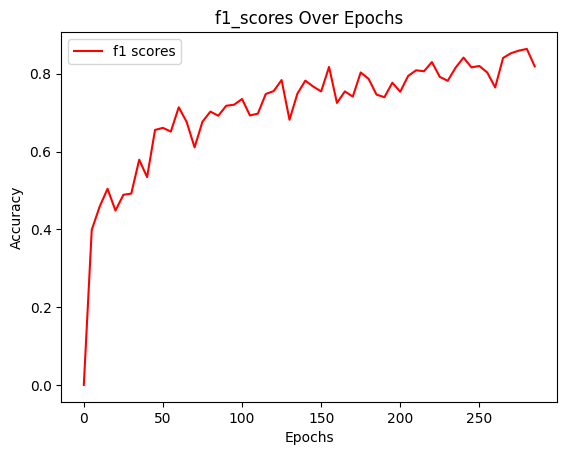

Epoch 285: train accuracy: 0.9937, Loss: 0.0182, Best Thresholds: 0.6000000238418579
Epoch 286: train accuracy: 0.9962, Loss: 0.0132, Best Thresholds: 0.6000000238418579
Epoch 287: train accuracy: 0.9950, Loss: 0.0307, Best Thresholds: 0.6000000238418579
Epoch 288: train accuracy: 0.9975, Loss: 0.0131, Best Thresholds: 0.6000000238418579
Epoch 289: train accuracy: 0.9962, Loss: 0.0117, Best Thresholds: 0.6000000238418579
tensor([[0.4328, 0.3347, 0.2935,  ..., 0.3481, 0.3544, 0.3522],
        [0.2801, 0.5840, 0.3172,  ..., 0.3792, 0.3788, 0.3789],
        [0.4246, 0.4949, 0.3367,  ..., 0.4065, 0.4025, 0.4029],
        ...,
        [0.8531, 0.3803, 0.3948,  ..., 0.4146, 0.4135, 0.4123],
        [0.4348, 0.4737, 0.4895,  ..., 0.3955, 0.3962, 0.3965],
        [0.3032, 0.4397, 0.3182,  ..., 0.3432, 0.3495, 0.3480]], device='cuda:0')
precision:  0.00017038366058841348 recall:  0.9795321822166443
tensor([[0.4328, 0.3347, 0.2935,  ..., 0.3481, 0.3544, 0.3522],
        [0.2801, 0.5840, 0.3172, 

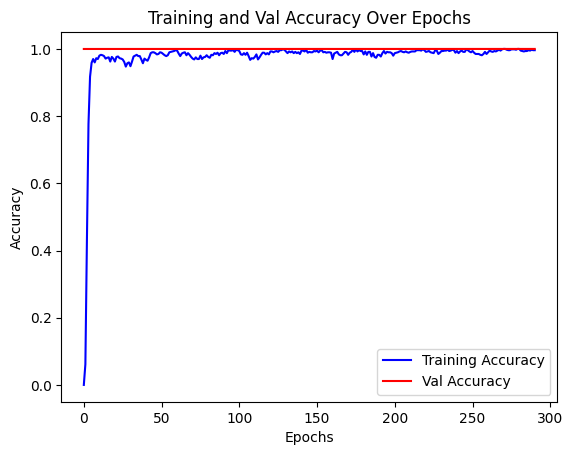

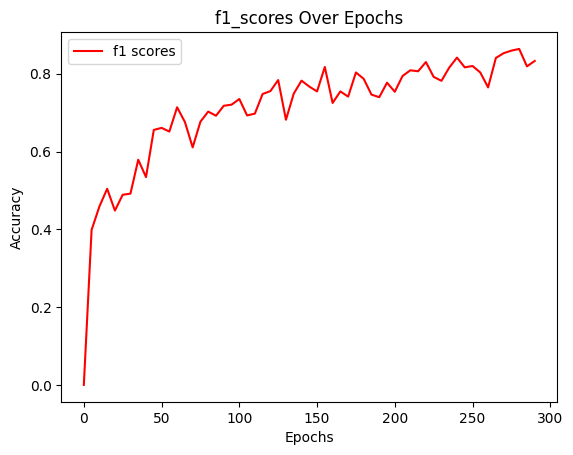

Epoch 290: train accuracy: 0.9962, Loss: 0.0150, Best Thresholds: 0.6000000238418579
Epoch 291: train accuracy: 0.9937, Loss: 0.0708, Best Thresholds: 0.6000000238418579
Epoch 292: train accuracy: 0.9937, Loss: 0.0312, Best Thresholds: 0.6000000238418579
Epoch 293: train accuracy: 0.9962, Loss: 0.0116, Best Thresholds: 0.6000000238418579
Epoch 294: train accuracy: 0.9975, Loss: 0.0179, Best Thresholds: 0.6000000238418579
tensor([[0.8196, 0.3330, 0.3741,  ..., 0.4300, 0.4224, 0.4256],
        [0.3189, 0.3964, 0.3997,  ..., 0.3548, 0.3611, 0.3576],
        [0.3297, 0.4177, 0.3284,  ..., 0.3809, 0.3847, 0.3827],
        ...,
        [0.4027, 0.4028, 0.4382,  ..., 0.3631, 0.3654, 0.3661],
        [0.3685, 0.3537, 0.3919,  ..., 0.3868, 0.3778, 0.3793],
        [0.4469, 0.4540, 0.3791,  ..., 0.4077, 0.4028, 0.4046]], device='cuda:0')
precision:  0.00017038366058841348 recall:  0.9795321822166443
tensor([[0.8196, 0.3330, 0.3741,  ..., 0.4300, 0.4224, 0.4256],
        [0.3189, 0.3964, 0.3997, 

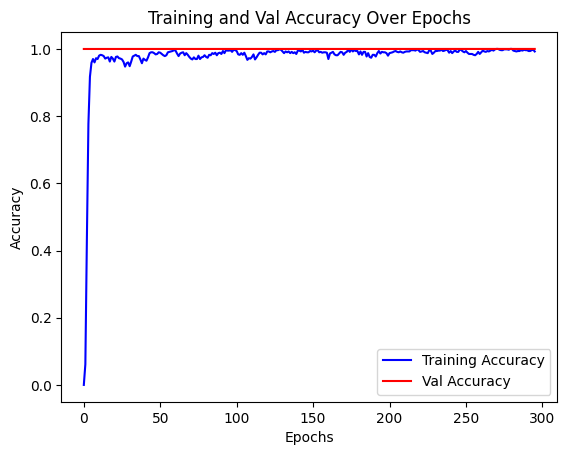

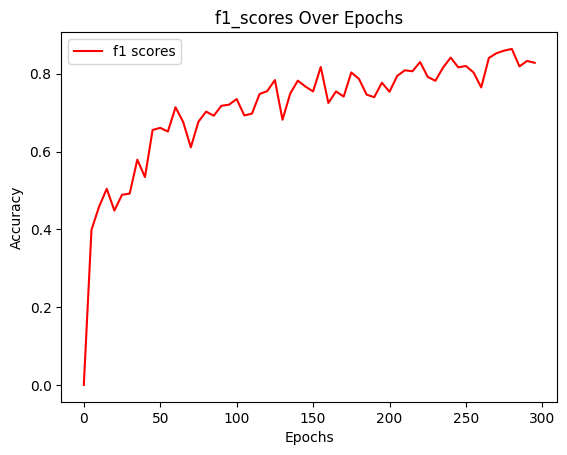

Epoch 295: train accuracy: 0.9925, Loss: 0.0205, Best Thresholds: 0.6000000238418579
Epoch 296: train accuracy: 0.9925, Loss: 0.0210, Best Thresholds: 0.6000000238418579
Epoch 297: train accuracy: 0.9987, Loss: 0.0083, Best Thresholds: 0.6000000238418579
Epoch 298: train accuracy: 0.9962, Loss: 0.0210, Best Thresholds: 0.6000000238418579
Epoch 299: train accuracy: 0.9962, Loss: 0.0148, Best Thresholds: 0.6000000238418579


In [ ]:
epochs = 300
epoch_accuracies = []
epoch_losses = []
best_thresholds_freqs  = torch.zeros(9).to(device)
all_thresholds = torch.arange(0.1, 1.0, 0.1).to(device)
test_accuracies = []
train_accuracies = []
f1_scores = []
for epoch in range(epochs):
  epoch_accuracy, epoch_loss, best_thresholds_freq, test_acc, best_f1 = train_one_epoch(model, metric_fc,\
                      lfw_dataloader_train, optimizer, criterion, epoch, test_dataloader = lfw_dataloader_test)
  train_accuracies.append(epoch_accuracy.item())
  if test_acc != None:
    f1_scores.append(best_f1)
    test_accuracies.append(test_acc)
    if epoch >0:
      plot_accuracies(train_accuracies, test_accuracies)
      plot_f1_scores(f1_scores)
  if type(best_thresholds_freq) == type(torch.tensor(1)):
    best_thresholds_freqs += best_thresholds_freq
    best_thresholds = torch.index_select(all_thresholds, 0,\
                    (best_thresholds_freqs == best_thresholds_freqs.max()).nonzero(as_tuple=True)[0]).tolist()

  print(f"Epoch {epoch}: train accuracy: {epoch_accuracy.item():.4f}, Loss: {epoch_loss:.4f}, Best Thresholds: { best_thresholds[-1]}")

  epoch_accuracies.append(epoch_accuracy), epoch_losses.append(epoch_loss)

# Testing

## Threshold selection and model quality assessment

In [ ]:
import os

import pandas as pd
from PIL import Image
from torch.utils.data import Dataset

class CSVBenchmarkDataset(Dataset):
    def __init__(self, root, csv_file, transform=None, return_img_paths=False):
        self.root = root
        self.return_img_paths = return_img_paths
        self.data = pd.read_csv(csv_file, delimiter=',')
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx].values
        if len(row) == 4:
            if row[-1] == '' or pd.isna(row[-1]):
                img_match = True
                person1, ind1, ind2, _ = row
                person2 = person1
            else:
                img_match = False
                person1, ind1, person2, ind2 = row
        else:
            raise RuntimeError(f"Row can be only of length 4. But found: `{row}`.")
        images = []
        for ind, person in [(ind1, person1),
                            (ind2, person2)]:
            ind = int(ind)
            img_path = self.add_extension(f'{self.root}/{person}/{person}_{ind:04d}')
            if self.return_img_paths:
                img = img_path
            else:
                img = Image.open(img_path)
                if self.transform:
                    img = self.transform(img)
            images.append(img)
        return *images, img_match

    @staticmethod
    def add_extension(path):
        if os.path.exists(path + '.jpg'):
            return path + '.jpg'
        elif os.path.exists(path + '.png'):
            return path + '.png'
        else:
            raise RuntimeError(f'No file `{path}` with extension png or jpg.')

In [ ]:
import os
import time

import numpy as np
import torch
import torchvision.transforms.functional as TF
from PIL import Image
from matplotlib import pyplot as plt
from sklearn.metrics import f1_score, accuracy_score, average_precision_score
from tqdm import tqdm

def read_pil_img(img_path, img_sz=112):
    # Reading the image and resizing it to size 112x112
    pil_img = Image.open(img_path).convert('RGB')
    return pil_img.resize((img_sz, img_sz))


def read_img_to_tensor(img_path):
    # Image preprocessing
    pil_img = read_pil_img(img_path)
    img = TF.pil_to_tensor(pil_img)
    img = img.unsqueeze(0).float()
    # img.div_(255).sub_(0.5).div_(0.5)
    img.div_(255)
    return img


@torch.inference_mode()
def norm_single(embed):
    # Embedding normalization
    return embed / torch.linalg.norm(embed)


def create_plot(dataset_name,
                metric,
                out_dir,
                thresholds,
                positive_values, negative_values,
                total_values):
    # Creating a graph of the dependence of accuracy on the selected dataset on the selected threshold.
    thresholds = np.array(thresholds)
    print(f"Saving plot for dataset `{dataset_name}` with metric {metric}...")
    plt.title(f'Dependence of accuracy on the selected threshold.\n'
              f'Dataset: {dataset_name}. Metric: {metric}.', wrap=True)
    plt.plot(thresholds, positive_values, color='g', label="positive pairs")
    plt.plot(thresholds, negative_values, color='r', label="negative pairs")
    plt.plot(thresholds, total_values, color='b', label="total pairs")
    plt.legend(loc="lower left")
    plt.xlabel('Threshold')
    plt.ylabel('Accuracy')

    major_thresholds_gap = len(thresholds) // 10
    plt.xticks(np.concatenate((thresholds[::major_thresholds_gap], [thresholds[-1]])))
    plt.yticks(np.arange(0, 1.05, 0.1))
    minor_thresholds_gap = len(thresholds) // 20
    plt.xticks(thresholds[::minor_thresholds_gap], minor=True)
    plt.yticks(np.arange(0, 1.05, 0.05), minor=True)
    plt.tick_params(which='minor', length=0)
    plt.grid()
    plt.grid(which='minor', alpha=0.3)

    out_plot_path = f'{out_dir}/accuracy_plot_{dataset_name}_{metric}.png'
    print(f"out_plot_path: {out_plot_path}")
    plt.savefig(out_plot_path, dpi=500)
    plt.show()
    plt.close()


def run_benchmarking(dataset, embedder, device, dataset_name, out_plots_dir):
    start = time.time()

    # Selecting thresholds to test to find the best one for each metric
    metrics = {
        'euclidian': np.arange(0, 3, 0.01),
        'cosine': np.arange(0, 1, 0.01),
    }
    positive_predicted_labels = dict()
    negative_predicted_labels = dict()
    total_predicted_labels = dict()
    for metric in metrics:
        positive_predicted_labels[metric] = {threshold: [] for threshold in metrics[metric]}
        negative_predicted_labels[metric] = {threshold: [] for threshold in metrics[metric]}
        total_predicted_labels[metric] = {threshold: [] for threshold in metrics[metric]}
    true_labels = []
    for image1, image2, issame in tqdm(dataset):
        with torch.no_grad():
            img1 = read_img_to_tensor(image1).to(device)
            img2 = read_img_to_tensor(image2).to(device)
            # Получение эмбеддингов изображений
            emb1 = embedder(img1).detach()[0]
            emb2 = embedder(img2).detach()[0]
            # Нормировка эмбеддингов изображений
            emb1_norm = norm_single(emb1)
            emb2_norm = norm_single(emb2)
            for metric in metrics:
                if metric == 'cosine':
                    # Подсчет косинусного расстояния
                    dist = 1 - (emb1_norm * emb2_norm).sum()
                else:
                    # Подсчет евклидовой метрики
                    dist = torch.nn.functional.mse_loss(emb1_norm, emb2_norm, reduction='sum')
                dist = dist.item()
                for threshold in metrics[metric]:
                    predicted_label = dist <= threshold
                    total_predicted_labels[metric][threshold].append(predicted_label)
                    if issame:
                        positive_predicted_labels[metric][threshold].append(predicted_label)
                    else:
                        negative_predicted_labels[metric][threshold].append(predicted_label)
            true_labels.append(issame)
    for metric in metrics:
        print(f"Analyzing thresholds for `{metric}` metric...")
        positive_accuracies = []
        negative_accuracies = []
        total_accuracies = []

        max_ap = (0, None)
        max_acc = (0, None)
        max_f1 = (0, None)
        for threshold in tqdm(metrics[metric]):
            cur_predicted_labels = total_predicted_labels[metric][threshold]
            accuracy = accuracy_score(true_labels, cur_predicted_labels)
            f1_macro = f1_score(true_labels, cur_predicted_labels, average='macro')
            total_accuracies.append(accuracy)
            cur_positive_pred_labels = positive_predicted_labels[metric][threshold]
            positive_accuracies.append(
                accuracy_score([True] * len(cur_positive_pred_labels),
                               cur_positive_pred_labels)
            )
            cur_negative_pred_labels = negative_predicted_labels[metric][threshold]
            negative_accuracies.append(
                accuracy_score([False] * len(cur_negative_pred_labels),
                               cur_negative_pred_labels)
            )
            if accuracy > max_acc[0]:
                max_acc = (accuracy, threshold)
            if f1_macro > max_f1[0]:
                max_f1 = (f1_macro, threshold)
        print("-" * 50)
        print(f"Best Accuracy: {max_acc[0]:.4f} on threshold {max_acc[1]}")
        print(f"Best F1: {max_f1[0]:.4f} on threshold {max_f1[1]}")
        create_plot(dataset_name, metric, out_plots_dir,
                    metrics[metric],
                    positive_accuracies, negative_accuracies, total_accuracies)
        print("-" * 50)
    end = time.time() - start
    print(f"Total time: {end} sec")
    print("=" * 50)

In [ ]:
pd.read_csv('/content/pairs.csv').head()

,name,imagenum1,imagenum2,Unnamed: 3
0,Abel_Pacheco,1,4,NaN
1,Akhmed_Zakayev,1,3,NaN
2,Akhmed_Zakayev,2,3,NaN
3,Amber_Tamblyn,1,2,NaN
4,Anders_Fogh_Rasmussen,1,3,NaN


Dataset name: LFW-yolo
Dataset Length: 6000


100%|██████████| 6000/6000 [02:22<00:00, 42.07it/s]


Analyzing thresholds for `euclidian` metric...


100%|██████████| 300/300 [00:03<00:00, 78.57it/s]


--------------------------------------------------
Best Accuracy: 0.7775 on threshold 1.25
Best F1: 0.7774 on threshold 1.25
Saving plot for dataset `LFW-yolo` with metric euclidian...
out_plot_path: ./out_plots_LFW-yolo/accuracy_plot_LFW-yolo_euclidian.png


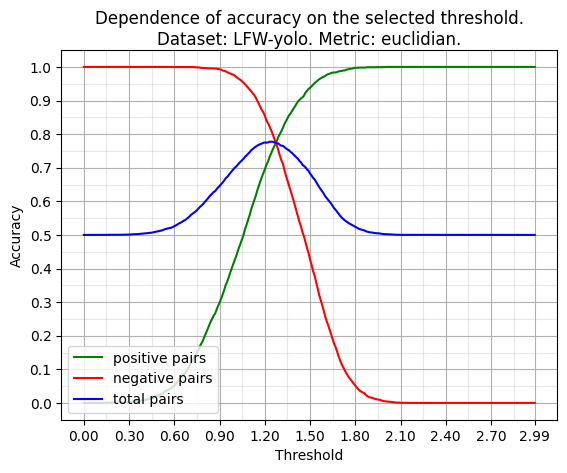

--------------------------------------------------
Analyzing thresholds for `cosine` metric...


100%|██████████| 100/100 [00:01<00:00, 79.40it/s]


--------------------------------------------------
Best Accuracy: 0.7772 on threshold 0.62
Best F1: 0.7769 on threshold 0.62
Saving plot for dataset `LFW-yolo` with metric cosine...
out_plot_path: ./out_plots_LFW-yolo/accuracy_plot_LFW-yolo_cosine.png


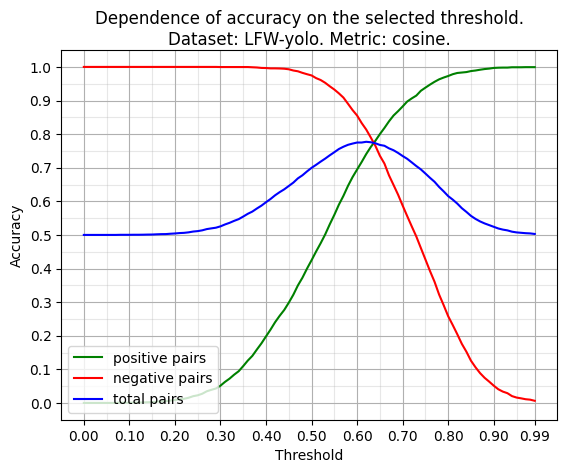

--------------------------------------------------
Total time: 149.7041530609131 sec


In [ ]:
dataset_name = 'LFW-yolo'
dataset_images_root = "./LFW-yolo"
dataset_csv_file = "./pairs.csv"
dataset = CSVBenchmarkDataset(root=dataset_images_root,
                              csv_file=dataset_csv_file,
                              return_img_paths=True)

print("Dataset name:", dataset_name)
print(f"Dataset Length: {len(dataset)}")

out_plots_dir = f'./out_plots_{dataset_name}'
os.makedirs(out_plots_dir, exist_ok=True)

run_benchmarking(dataset, model, device, dataset_name, out_plots_dir)

## Testing on pictures from the real world

**Задания:**

1. Write a face alignment function. Apply it during model inference to process found faces.
2. Download from the Internet photographs of famous people present in the LFW dataset, for example, politicians, and write a function to recognize their faces.
Visualize the results.

\+ Naturally, at the very beginning, train the feature extractor.

In [ ]:
all_classes = os.listdir('/content/LFW-yolo')

In [ ]:
def get_face_label(img1):
  input1 = transform(img1).unsqueeze(0).to(device)
  output1 = model(input1)
  output1 = metric_fc(output1.to(device), torch.tensor([1]).to(device))

  _, pred1 = torch.max(output1, 1)
  return pred1.item()
img1 = Image.fromarray(preprocess_image(cv2.imread('/content/John_Ashcroft.png'))[0])
all_classes[get_face_label(img1)]

'John_Ashcroft'

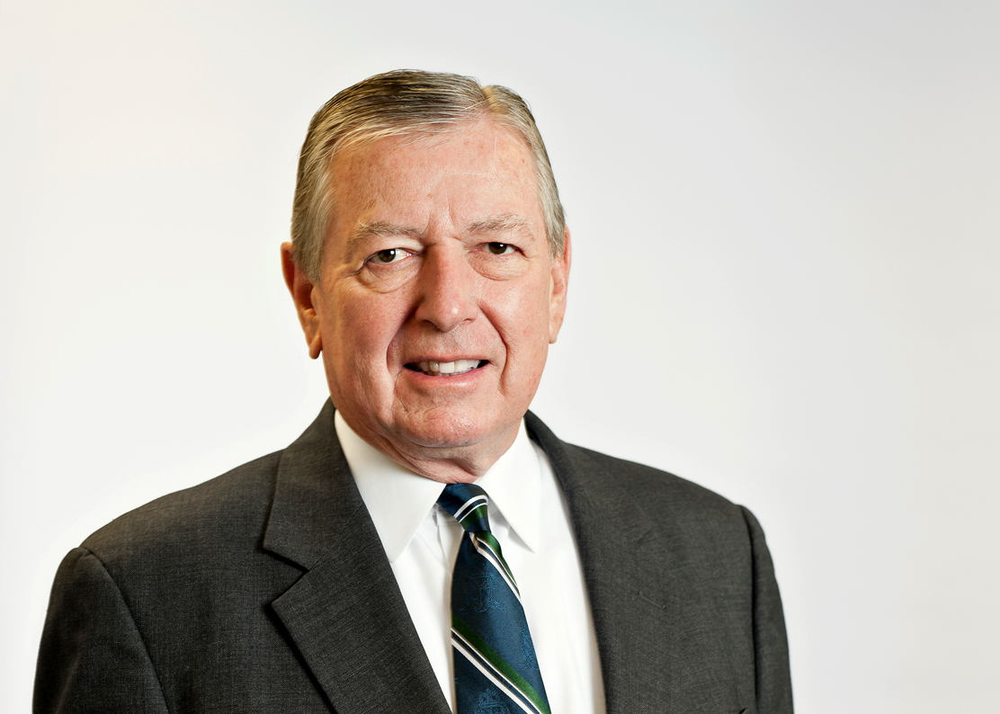

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(cv2.imread('/content/John_Ashcroft.png'))

In [ ]:
img = cv2.imread('/content/John_Ashcroft.png')
img, face = preprocess_image(img)
cls = all_classes[get_face_label(Image.fromarray(img))]
cls, face

('John_Ashcroft',
 [{'conf': 0.85888671875,
   'box_points': [357, 143, 612, 493],
   'key_points': [[430, 287],
    [547, 283],
    [500, 353],
    [442, 404],
    [547, 401]]}])

In [ ]:
import cv2

def draw_recognition_results(image, face_info):
    name = face_info['name']
    box_points = face_info['box_points']
    key_points = face_info['key_points']

    x0, y0, x1, y1 = tuple(box_points)
    color = (0, 0, 255)
    conf = face_info['conf']
    text = name  + f'  confidence: {conf:.2f}'
    font = cv2.FONT_HERSHEY_SIMPLEX
    text_size, _ = cv2.getTextSize(text, font, 0.5, 3)
    text_x = int((x1 + x0 - text_size[0]) // 2)
    text_y = int(y0 - text_size[1])
    cv2.rectangle(image, (int(x0), int(y0)), (int(x1), int(y1)), color, 2)
    cv2.putText(image, text, (text_x, text_y), font, 0.5, color, 2)

    key_points_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (0, 255, 255), (128, 0, 128)]
    radius = 3
    for point, cur_color in zip(key_points, key_points_colors):
        cv2.circle(image, (int(point[0]), int(point[1])), radius, cur_color, -1)

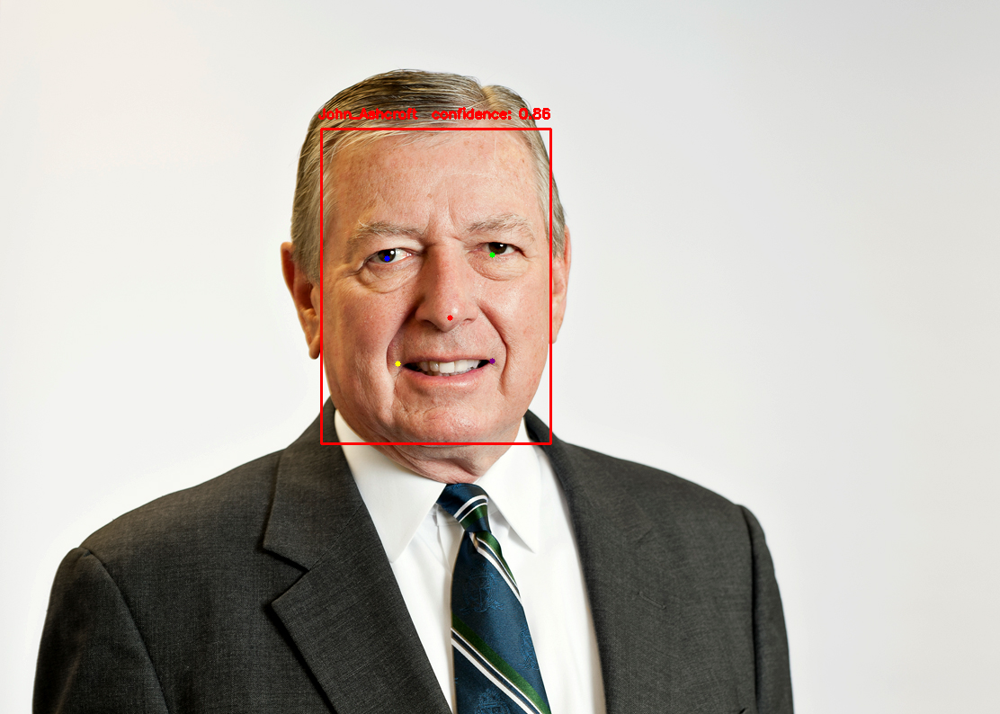

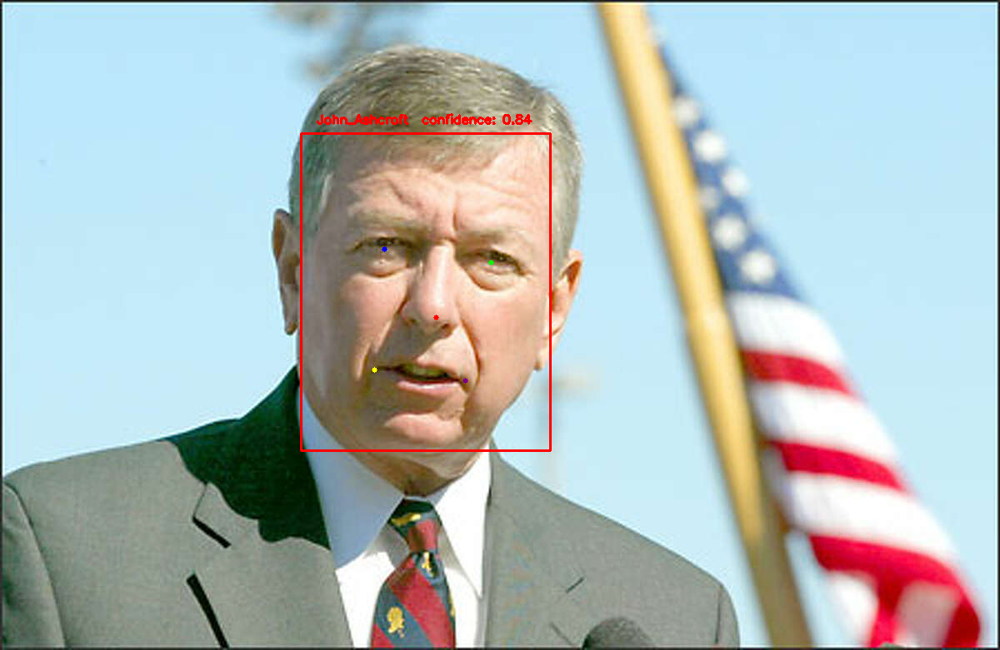

In [ ]:
def detect_face(img):
  face_img, face = preprocess_image(img)
  cls = all_classes[get_face_label(Image.fromarray(face_img))]
  face[0]['name'] = cls
  draw_recognition_results(img, face[0])
  return img
cv2_imshow(detect_face(cv2.imread('/content/John_Ashcroft.png')))
cv2_imshow(detect_face(cv2.imread('/content/John_Ashcroft2.png')))

In [ ]:
def detect_face(img):
  face_img, face = preprocess_image(img)
  idx = get_face_label(Image.fromarray(face_img))
  # print(idx)
  cls = all_classes[idx]
  face[0]['name'] = cls
  print(idx, face[0]['conf'])
  draw_recognition_results(img, face[0])
  return img


In [ ]:
import cv2

def process_video(input_path, output_path):
    # Open the video file
    cap = cv2.VideoCapture(input_path)

    # Check if the video file opened successfully
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Create a VideoWriter object to save the modified video
    fourcc = cv2.VideoWriter_fourcc(*'XVID')  # You can choose a different codec if needed
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Process each frame in the video
    while True:
        ret, frame = cap.read()

        # Break the loop if no more frames are available
        if not ret:
            break

        # Apply the detect_face function to the current frame
        modified_frame = detect_face(frame)

        # Write the modified frame to the output video file
        out.write(modified_frame)

        # Display the modified frame (optional)
        # cv2_imshow('Modified Frame', modified_frame)

        # Break the loop if 'q' key is pressed
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break

    # Release the VideoCapture and VideoWriter objects
    cap.release()
    out.release()

    # Close all OpenCV windows
    cv2.destroyAllWindows()

# Example usage:
input_video_path = '/content/John Ashcroft on endorsing Trump - Trim.mp4'  # Replace with your input video file path
output_video_path = '/content/John.avi'  # Replace with your desired output video file path
process_video(input_video_path, output_video_path)


3357 0.8525390625
3357 0.853515625
3357 0.85595703125
442 0.85693359375
3357 0.8583984375
442 0.85546875
442 0.85498046875
442 0.8583984375
442 0.85888671875
442 0.86083984375
442 0.86279296875
442 0.86474609375
442 0.86376953125
442 0.861328125
442 0.8603515625
442 0.8603515625
442 0.85986328125
3297 0.85888671875
442 0.859375
3297 0.85888671875
3297 0.857421875
3297 0.8544921875
442 0.85400390625
442 0.85546875
442 0.859375
442 0.861328125
442 0.86181640625
442 0.86083984375
442 0.85986328125
442 0.8583984375
3297 0.8583984375
442 0.85888671875
442 0.861328125
442 0.86181640625
442 0.86083984375
3297 0.86083984375
442 0.86181640625
442 0.86083984375
3357 0.8603515625
3297 0.85986328125
442 0.85986328125
3297 0.86083984375
3297 0.86083984375
442 0.861328125
442 0.86083984375
3297 0.86181640625
442 0.86083984375
442 0.859375
442 0.8583984375
442 0.85791015625
442 0.86083984375
442 0.8603515625
442 0.86083984375
442 0.86181640625
442 0.86279296875
442 0.86328125
442 0.86279296875
442 0.

In [ ]:
!cp '/content/John.avi' '/content/drive/MyDrive'

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

def convert_video(input_path, output_path):
    # Use FFmpeg to convert the video to MP4 with H.264 codec
    os.system(f"ffmpeg -i {input_path} -c:v libx264 -b:v 2000k -c:a aac -strict experimental -b:a 192k -movflags faststart {output_path}")

def show_video(video_path):
    # Read the converted video file and encode it
    video_file = open(video_path, "rb").read()
    video_encoded = b64encode(video_file).decode("ascii")

    # Display the video player
    video_tag = f'<video controls src="data:video/mp4;base64,{video_encoded}">'
    display(HTML(video_tag))

# Example usage:
input_video_path = '/content/John.avi'  # Replace with your output video file path
converted_video_path = 'output_video.mp4'  # Output video path after conversion

# Convert the video to a format supported by Colab
convert_video(input_video_path, converted_video_path)

# Show the converted video in Colab
show_video(converted_video_path)
